In [1]:
import sqlite3
import pandas as pd

# Connect to the SQLite database
conn = sqlite3.connect('/Users/devinpathiraja/Desktop/IFN704 /lol.db')  # Replace with your actual database file name

# Function to process each chunk of data
def process_chunk(chunk):
    # Replace empty strings with NaN
    chunk.replace('', pd.NA, inplace=True)
    
    # Remove rows with missing values in specified columns
    chunk = chunk.dropna(subset=['match_id', 'puuid', 'teamPosition', 'win', 'teamId'])
    
    # Remove rows where puuid is 'BOT'
    chunk = chunk[chunk['puuid'] != 'BOT']
    
    return chunk

# SQL query to extract the desired features
query = """
SELECT puuid, match_id, teamPosition, win, teamId
FROM participant
"""

# Execute the query and load the results into a pandas DataFrame, processing in chunks
chunk_size = 100000  # Adjust this value based on your system's memory capacity
df_list = []

for chunk in pd.read_sql_query(query, conn, chunksize=chunk_size):
    processed_chunk = process_chunk(chunk)
    df_list.append(processed_chunk)

# Concatenate all processed chunks
df = pd.concat(df_list, ignore_index=True)

# Close the database connection
conn.close()

In [2]:
def get_match_data(df, match_id):
    # Filter the DataFrame for the specific match_id
    match_data = df[df['match_id'] == match_id]
    
    # Sort the data by teamId to group players by team
    match_data = match_data.sort_values('teamId')
    
    print(f"Data for match {match_id}:")
    print(f"Number of players found: {len(match_data)}")
    
    for index, row in match_data.iterrows():
        print(f"Player {index + 1}:")
        print(f"  PUUID: {row['puuid']}")
        print(f"  Position: {row['teamPosition']}")
        print(f"  Team ID: {row['teamId']}")
        print(f"  Win: {row['win']}")
        print()

# Specify the match_id you want to check
match_id_to_check = 'OC1_564876644'

# Get and print the data for this match
get_match_data(df, match_id_to_check)

Data for match OC1_564876644:
Number of players found: 10
Player 1675:
  PUUID: UoBtQQIjzVdYoQnCE3v7kauzvPBm_UFbuVYAxFEO7NrxLx5ERnaoigWwBaqvr0S7COnlXLch6-fhqw
  Position: TOP
  Team ID: 100
  Win: 0

Player 1676:
  PUUID: FH8BKVK4gxBd8yd3w658M_k02mdHq_8seh_8CLEbbxFxCrIChhdbU46NzHiP0mYq55dPfI4U5q8Ivg
  Position: JUNGLE
  Team ID: 100
  Win: 0

Player 1677:
  PUUID: n7Vx94O6wlXye4RI11L7SxbEXH-sPXGnQyKTtCr7uClPzNda5199rdKQ-cR34q2W-CAmHc8OZL2SFg
  Position: MIDDLE
  Team ID: 100
  Win: 0

Player 1678:
  PUUID: cXPc4OrBrqibrLdDhgo4WZyR_gTpu7Bs65RmiY6yupMSAn07i1xnP7DaerYZWrwwdLLTr-UAfC0alw
  Position: BOTTOM
  Team ID: 100
  Win: 0

Player 1679:
  PUUID: NPD9MTbIW0kgE2fFwkvvudSq0_FtvLnJbON0s6zc66luaThe8HCALsAxcb9-V7WWLT6A9bBPMnQbkg
  Position: UTILITY
  Team ID: 100
  Win: 0

Player 1680:
  PUUID: CBWHup3kaETfy6ziW2Ty3d8jMbcUmhya-UtDpBCHilp8NFOGCQKpaCULCPHkfDiQmX-30z8a7BX1mQ
  Position: TOP
  Team ID: 200
  Win: 1

Player 1681:
  PUUID: tPJAHi7KaWwVA3Jt4ubwuArADbx7WCZukgWRgbszdvhtQTMVr24_1FW

In [4]:
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', None)  # Set width to unlimited
pd.set_option('display.max_colwidth', None)  # Show full content of each column
pd.set_option('display.expand_frame_repr', False) 

In [5]:
import pandas as pd
from tqdm import tqdm
import math

def create_match_summary(df):
    # Create a player number for each match
    print("Creating player numbers...")
    df['player_num'] = df.groupby('match_id').cumcount() + 1

    # Pivot the dataframe
    print("Pivoting dataframe...")
    pivoted = df.pivot(index='match_id', columns='player_num', 
                       values=['puuid', 'teamPosition', 'teamId', 'win'])

    # Flatten column names
    print("Flattening column names...")
    pivoted.columns = [f'{col[0]}_{col[1]}' for col in pivoted.columns]

    # Reset index to make match_id a column
    pivoted = pivoted.reset_index()

    # Ensure all columns are present (in case some matches have fewer than 10 players)
    print("Ensuring all columns are present...")
    total_iterations = 40  # 10 players * 4 columns
    with tqdm(total=total_iterations) as pbar:
        for i in range(1, 11):
            for col in ['puuid', 'teamPosition', 'teamId', 'win']:
                if f'{col}_{i}' not in pivoted.columns:
                    pivoted[f'{col}_{i}'] = pd.NA
                pbar.update(1)

    # Reorder columns
    print("Reordering columns...")
    cols = ['match_id'] + [f'{col}_{i}' for i in range(1, 11) for col in ['puuid', 'teamPosition', 'teamId', 'win']]
    pivoted = pivoted[cols]

    return pivoted

# Create the new DataFrame
print("Starting to create match summary...")
df_match_summary = create_match_summary(df)

print("Match summary created. Displaying first few rows...")
print(df_match_summary.head())

print("\nDataFrame Info:")
print(df_match_summary.info())

# Check a specific match
match_id_to_check = 'OC1_564876644'
print(f"\nData for match {match_id_to_check}:")
print(df_match_summary[df_match_summary['match_id'] == match_id_to_check].iloc[0])

print("\nProcess completed successfully.")

Starting to create match summary...
Creating player numbers...
Pivoting dataframe...
Flattening column names...
Ensuring all columns are present...


100%|████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 36072.28it/s]


Reordering columns...
Match summary created. Displaying first few rows...
        match_id                                                                         puuid_1 teamPosition_1 teamId_1 win_1                                                                         puuid_2 teamPosition_2 teamId_2 win_2                                                                         puuid_3 teamPosition_3 teamId_3 win_3                                                                         puuid_4 teamPosition_4 teamId_4 win_4                                                                         puuid_5 teamPosition_5 teamId_5 win_5                                                                         puuid_6 teamPosition_6 teamId_6 win_6                                                                         puuid_7 teamPosition_7 teamId_7 win_7                                                                         puuid_8 teamPosition_8 teamId_8 win_8                              

In [6]:
import pandas as pd

# Assuming your current DataFrame is named df_match_summary
# Create a copy of the DataFrame to keep the original separate
df_renamed = df_match_summary.copy()

# Function to rename columns
def rename_columns(col):
    if col.startswith('teamId_'):
        player_num = int(col.split('_')[1])
        if player_num <= 5:
            return 'team_1'
        else:
            return 'team_2'
    elif col.startswith('win_'):
        return 'win'
    else:
        return col

# Rename the columns
df_renamed.columns = [rename_columns(col) for col in df_renamed.columns]

# Display the first few rows of the new DataFrame
df_renamed.head()


,match_id,puuid_1,teamPosition_1,team_1,win,puuid_2,teamPosition_2,team_1,win,puuid_3,teamPosition_3,team_1,win,puuid_4,teamPosition_4,team_1,win,puuid_5,teamPosition_5,team_1,win,puuid_6,teamPosition_6,team_2,win,puuid_7,teamPosition_7,team_2,win,puuid_8,teamPosition_8,team_2,win,puuid_9,teamPosition_9,team_2,win,puuid_10,teamPosition_10,team_2,win
0,OC1_564876644,UoBtQQIjzVdYoQnCE3v7kauzvPBm_UFbuVYAxFEO7NrxLx5ERnaoigWwBaqvr0S7COnlXLch6-fhqw,TOP,100,0,FH8BKVK4gxBd8yd3w658M_k02mdHq_8seh_8CLEbbxFxCrIChhdbU46NzHiP0mYq55dPfI4U5q8Ivg,JUNGLE,100,0,n7Vx94O6wlXye4RI11L7SxbEXH-sPXGnQyKTtCr7uClPzNda5199rdKQ-cR34q2W-CAmHc8OZL2SFg,MIDDLE,100,0,cXPc4OrBrqibrLdDhgo4WZyR_gTpu7Bs65RmiY6yupMSAn07i1xnP7DaerYZWrwwdLLTr-UAfC0alw,BOTTOM,100,0,NPD9MTbIW0kgE2fFwkvvudSq0_FtvLnJbON0s6zc66luaThe8HCALsAxcb9-V7WWLT6A9bBPMnQbkg,UTILITY,100,0,CBWHup3kaETfy6ziW2Ty3d8jMbcUmhya-UtDpBCHilp8NFOGCQKpaCULCPHkfDiQmX-30z8a7BX1mQ,TOP,200,1,tPJAHi7KaWwVA3Jt4ubwuArADbx7WCZukgWRgbszdvhtQTMVr24_1FWSZY89H1jTOOtiGUvb2qD9dw,JUNGLE,200,1,sduZVJ-zJSh9qJKqV_0wnQN0EBhNnvhFg9u0AtGqXUYFjnpcbt8BvyBHyfxo-hAt9xgS-Uivq1GtrQ,MIDDLE,200,1,1xLRZHol5hz1JEI18bX_7nTpEDX03vqJN3VtnncTudnGbEHLKXLvD536iUFVpoH7bcsb5mBGVW4Bcw,BOTTOM,200,1,3dgn7-Fwe4mYKEFjyzovEh1nteHrt7B3EZUT1RP-mZ5vRYUEkjRDlWlZT6hoD2CaqZHUrCAhsXwEsw,UTILITY,200,1
1,OC1_564882293,slIf7LP4Kr_1_CpGyOmL_BkzGSgGLNhAos6mRON5nOxvab8d1P7o6JPuqPeYQB5NBVeiNeGJzPCjyw,TOP,100,0,jxud22N5_fkeJ0jmp9krUfNgcSkYXWe9nDtFk1hO4uTRndQe2KjVI4Ey4kO-_p2mvfKsckpQYQRi2A,JUNGLE,100,0,tPJAHi7KaWwVA3Jt4ubwuArADbx7WCZukgWRgbszdvhtQTMVr24_1FWSZY89H1jTOOtiGUvb2qD9dw,MIDDLE,100,0,lo6YQidE22L5lMcvWrCrj5qFp7tdEa1gVHE9N6TB74HKPiwtqKagY9SofLhl5DiPMrx7v6CKxHAN7Q,BOTTOM,100,0,AJl3Ebo3uqJF7aOgPcvDPAasbhtNGufLGGGnCbedT_hvX_MI0ZWgwW1PADy8P1b9MJuLS6FnGrMkMQ,UTILITY,100,0,v7MdVgS5I_zXT04dcpOkqPk1AqL_G1-88gXH9Lg8u7-wIe6v6pV_YZ0awUWWs7VamaX25Y9Onb0xKw,TOP,200,1,huEycrZJfGKtB_sgan83kapEoISNKxW9BOAmanMFmuMkrNX5W7g9KZELdvllV2QW5oFjxF2cxlmeVw,JUNGLE,200,1,NO-0JdAO96OJkcVn9xnxizcamw6uEfwNRodM6hxyd8pKhi5IoiD9ZBf_Dr6CXh2cvDjm2Lf2lIlOpg,MIDDLE,200,1,e590wZ75DqKgcBj3wJeDY_01IBkek6ggWVdy96N8XbURMggPu3_CwLQcbvCRp4Ps_BnGUu4e3NBIOQ,BOTTOM,200,1,0sgU6iVda79lXfS-cdbZlT73EG5pvM6LUPZ9X5NClrRyhYqnjGdLlKkudNihZMhVOhr7PQ7uvBT13w,UTILITY,200,1
2,OC1_564915288,yWgGWIoPSMAQBQUmy4Y1kOJvZJP21vpmm9e4WG735KWTWqVddo7evtnWcsp3On4aXTzVSRhQW1vPEA,JUNGLE,100,1,C_FZOCg6LqBghfsji1PfM4Bruvrz_tKG-8RNVqsERrggeryB8rC8St5w3K3DkwFpSsiGVk32ru4nAg,UTILITY,100,1,ABmjzLoNuG0qPBBBitzk2UH_pPYZ05qGSaV-A9IR4fe_U4t2fRBx8PNzYCwlvfMHs2a0o6b6Cb8bmg,TOP,100,1,K8j8tLFucuT55DnCwx6kgnnBZcE7uYNj_nfNHiB2Axyx6XTOquOWgxZ-FBcOgvo1yQShjiyX0wm8mQ,MIDDLE,100,1,8s0y4xJWaILip4jvfh2FJv09G8chFK_S7bVNEY2rBt0LNRl5d-hAS0yCX2jeK6W-15w91r59epQxFA,BOTTOM,100,1,wpLwEIMeFjr7EnLQTebvOwcp9SUPa4LTFFcF8G3GrnZ5PiPix386fUswhAGNSSUCfLyK9G2rYR_eaQ,JUNGLE,200,0,R1jIzEuV7NrUbtF2hi6DUt4F0V9Zf2-aMMzleN45DjpSYh_zosdiakV1xGO3tbARU34lY67SFCO3jw,BOTTOM,200,0,2OAqPQHu6hIQh7wQK1BCrqptm-7rJptL0d3dBUIDX5xIVN08t7u8nq6tYwI-8C4VKGtC4ytVFYH-zw,UTILITY,200,0,GXb3f35CnWvE7ripK-fmLq9rgaAAc8-ScKDOgTYKLzJ1TKy-TXXm51d307Hx03mhjMYCl0rEyEC7jg,MIDDLE,200,0,YQk0vHWHy21aTrgtIoGpSobtK5mbdqmSaVmyBnK3DBfdIMNsna_QNCVpwUwFJii-UXxqrfkQ-x9fOA,TOP,200,0
3,OC1_564917000,YQk0vHWHy21aTrgtIoGpSobtK5mbdqmSaVmyBnK3DBfdIMNsna_QNCVpwUwFJii-UXxqrfkQ-x9fOA,TOP,100,1,R1jIzEuV7NrUbtF2hi6DUt4F0V9Zf2-aMMzleN45DjpSYh_zosdiakV1xGO3tbARU34lY67SFCO3jw,JUNGLE,100,1,GXb3f35CnWvE7ripK-fmLq9rgaAAc8-ScKDOgTYKLzJ1TKy-TXXm51d307Hx03mhjMYCl0rEyEC7jg,MIDDLE,100,1,wpLwEIMeFjr7EnLQTebvOwcp9SUPa4LTFFcF8G3GrnZ5PiPix386fUswhAGNSSUCfLyK9G2rYR_eaQ,BOTTOM,100,1,2OAqPQHu6hIQh7wQK1BCrqptm-7rJptL0d3dBUIDX5xIVN08t7u8nq6tYwI-8C4VKGtC4ytVFYH-zw,UTILITY,100,1,3QC7ggjT3H5kTiV9RbU3lzYZ7yi3fqQYf38byNdOhKWje1yu1G07SizvW5HmgtJe_fhevXOonPZ21g,TOP,200,0,rQE66nEYxzGNJBukM3YlIOH3hsH1avRp1cnfDCmXoJtf5XyIbVN90yWFpvkqO5VLbWODy5-vXCbxxw,JUNGLE,200,0,fwEH2oH4lAiIywJ9Y3HGfqmzT0FhTNx4t8-mLzQmij7tJjLQ9dffLx1uApHNs0bWJdhDTdUu03OLQA,MIDDLE,200,0,654_FhvWnIgiD23Czh1KNOIK8GIVA6fjmdCV97C0GSjsiIVLsFFZCeKeoVgB7HGYMb21lhLijoN5xA,BOTTOM,200,0,16v4L_UW-xByp

In [7]:
# Assuming your original DataFrame is named df_match_summary
# Create a new DataFrame with a different name
df_lol_matches = df_match_summary.copy()

# Function to rename columns
def rename_columns(col):
    if col.startswith('teamId_'):
        player_num = int(col.split('_')[1])
        if player_num <= 5:
            return 'team_id'
        else:
            return 'team_id'
    elif col.startswith('win_'):
        player_num = int(col.split('_')[1])
        if player_num <= 5:
            return 'team_1_win'
        else:
            return 'team_2_win'
    elif col.startswith('teamPosition_'):
        player_num = col.split('_')[1]
        return f'teamPosition_puuid_{player_num}'
    else:
        return col

# Rename the columns
df_lol_matches.columns = [rename_columns(col) for col in df_lol_matches.columns]

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.expand_frame_repr', False)

# Display the first few rows of the new DataFrame
df_lol_matches.head()

,match_id,puuid_1,teamPosition_puuid_1,team_id,team_1_win,puuid_2,teamPosition_puuid_2,team_id,team_1_win,puuid_3,teamPosition_puuid_3,team_id,team_1_win,puuid_4,teamPosition_puuid_4,team_id,team_1_win,puuid_5,teamPosition_puuid_5,team_id,team_1_win,puuid_6,teamPosition_puuid_6,team_id,team_2_win,puuid_7,teamPosition_puuid_7,team_id,team_2_win,puuid_8,teamPosition_puuid_8,team_id,team_2_win,puuid_9,teamPosition_puuid_9,team_id,team_2_win,puuid_10,teamPosition_puuid_10,team_id,team_2_win
0,OC1_564876644,UoBtQQIjzVdYoQnCE3v7kauzvPBm_UFbuVYAxFEO7NrxLx5ERnaoigWwBaqvr0S7COnlXLch6-fhqw,TOP,100,0,FH8BKVK4gxBd8yd3w658M_k02mdHq_8seh_8CLEbbxFxCrIChhdbU46NzHiP0mYq55dPfI4U5q8Ivg,JUNGLE,100,0,n7Vx94O6wlXye4RI11L7SxbEXH-sPXGnQyKTtCr7uClPzNda5199rdKQ-cR34q2W-CAmHc8OZL2SFg,MIDDLE,100,0,cXPc4OrBrqibrLdDhgo4WZyR_gTpu7Bs65RmiY6yupMSAn07i1xnP7DaerYZWrwwdLLTr-UAfC0alw,BOTTOM,100,0,NPD9MTbIW0kgE2fFwkvvudSq0_FtvLnJbON0s6zc66luaThe8HCALsAxcb9-V7WWLT6A9bBPMnQbkg,UTILITY,100,0,CBWHup3kaETfy6ziW2Ty3d8jMbcUmhya-UtDpBCHilp8NFOGCQKpaCULCPHkfDiQmX-30z8a7BX1mQ,TOP,200,1,tPJAHi7KaWwVA3Jt4ubwuArADbx7WCZukgWRgbszdvhtQTMVr24_1FWSZY89H1jTOOtiGUvb2qD9dw,JUNGLE,200,1,sduZVJ-zJSh9qJKqV_0wnQN0EBhNnvhFg9u0AtGqXUYFjnpcbt8BvyBHyfxo-hAt9xgS-Uivq1GtrQ,MIDDLE,200,1,1xLRZHol5hz1JEI18bX_7nTpEDX03vqJN3VtnncTudnGbEHLKXLvD536iUFVpoH7bcsb5mBGVW4Bcw,BOTTOM,200,1,3dgn7-Fwe4mYKEFjyzovEh1nteHrt7B3EZUT1RP-mZ5vRYUEkjRDlWlZT6hoD2CaqZHUrCAhsXwEsw,UTILITY,200,1
1,OC1_564882293,slIf7LP4Kr_1_CpGyOmL_BkzGSgGLNhAos6mRON5nOxvab8d1P7o6JPuqPeYQB5NBVeiNeGJzPCjyw,TOP,100,0,jxud22N5_fkeJ0jmp9krUfNgcSkYXWe9nDtFk1hO4uTRndQe2KjVI4Ey4kO-_p2mvfKsckpQYQRi2A,JUNGLE,100,0,tPJAHi7KaWwVA3Jt4ubwuArADbx7WCZukgWRgbszdvhtQTMVr24_1FWSZY89H1jTOOtiGUvb2qD9dw,MIDDLE,100,0,lo6YQidE22L5lMcvWrCrj5qFp7tdEa1gVHE9N6TB74HKPiwtqKagY9SofLhl5DiPMrx7v6CKxHAN7Q,BOTTOM,100,0,AJl3Ebo3uqJF7aOgPcvDPAasbhtNGufLGGGnCbedT_hvX_MI0ZWgwW1PADy8P1b9MJuLS6FnGrMkMQ,UTILITY,100,0,v7MdVgS5I_zXT04dcpOkqPk1AqL_G1-88gXH9Lg8u7-wIe6v6pV_YZ0awUWWs7VamaX25Y9Onb0xKw,TOP,200,1,huEycrZJfGKtB_sgan83kapEoISNKxW9BOAmanMFmuMkrNX5W7g9KZELdvllV2QW5oFjxF2cxlmeVw,JUNGLE,200,1,NO-0JdAO96OJkcVn9xnxizcamw6uEfwNRodM6hxyd8pKhi5IoiD9ZBf_Dr6CXh2cvDjm2Lf2lIlOpg,MIDDLE,200,1,e590wZ75DqKgcBj3wJeDY_01IBkek6ggWVdy96N8XbURMggPu3_CwLQcbvCRp4Ps_BnGUu4e3NBIOQ,BOTTOM,200,1,0sgU6iVda79lXfS-cdbZlT73EG5pvM6LUPZ9X5NClrRyhYqnjGdLlKkudNihZMhVOhr7PQ7uvBT13w,UTILITY,200,1
2,OC1_564915288,yWgGWIoPSMAQBQUmy4Y1kOJvZJP21vpmm9e4WG735KWTWqVddo7evtnWcsp3On4aXTzVSRhQW1vPEA,JUNGLE,100,1,C_FZOCg6LqBghfsji1PfM4Bruvrz_tKG-8RNVqsERrggeryB8rC8St5w3K3DkwFpSsiGVk32ru4nAg,UTILITY,100,1,ABmjzLoNuG0qPBBBitzk2UH_pPYZ05qGSaV-A9IR4fe_U4t2fRBx8PNzYCwlvfMHs2a0o6b6Cb8bmg,TOP,100,1,K8j8tLFucuT55DnCwx6kgnnBZcE7uYNj_nfNHiB2Axyx6XTOquOWgxZ-FBcOgvo1yQShjiyX0wm8mQ,MIDDLE,100,1,8s0y4xJWaILip4jvfh2FJv09G8chFK_S7bVNEY2rBt0LNRl5d-hAS0yCX2jeK6W-15w91r59epQxFA,BOTTOM,100,1,wpLwEIMeFjr7EnLQTebvOwcp9SUPa4LTFFcF8G3GrnZ5PiPix386fUswhAGNSSUCfLyK9G2rYR_eaQ,JUNGLE,200,0,R1jIzEuV7NrUbtF2hi6DUt4F0V9Zf2-aMMzleN45DjpSYh_zosdiakV1xGO3tbARU34lY67SFCO3jw,BOTTOM,200,0,2OAqPQHu6hIQh7wQK1BCrqptm-7rJptL0d3dBUIDX5xIVN08t7u8nq6tYwI-8C4VKGtC4ytVFYH-zw,UTILITY,200,0,GXb3f35CnWvE7ripK-fmLq9rgaAAc8-ScKDOgTYKLzJ1TKy-TXXm51d307Hx03mhjMYCl0rEyEC7jg,MIDDLE,200,0,YQk0vHWHy21aTrgtIoGpSobtK5mbdqmSaVmyBnK3DBfdIMNsna_QNCVpwUwFJii-UXxqrfkQ-x9fOA,TOP,200,0
3,OC1_564917000,YQk0vHWHy21aTrgtIoGpSobtK5mbdqmSaVmyBnK3DBfdIMNsna_QNCVpwUwFJii-UXxqrfkQ-x9fOA,TOP,100,1,R1jIzEuV7NrUbtF2hi6DUt4F0V9Zf2-aMMzleN45DjpSYh_zosdiakV1xGO3tbARU34lY67SFCO3jw,JUNGLE,100,1,GXb3f35CnWvE7ripK-fmLq9rgaAAc8-ScKDOgTYKLzJ1TKy-TXXm51d307Hx03mhjMYCl0rEyEC7jg,MIDDLE,100,1,wpLwEIMeFjr7EnLQTebvOwcp9SUPa4LTFFcF8G3GrnZ5PiPix386fUswhAGNSSUCfLyK9G2rYR_eaQ,BOTTOM,100,1,2OAqPQHu6hIQh7wQK1BCrqptm-7rJptL0d3dBUIDX5xIVN08t7u8nq6tYwI-8C4VKGtC4ytVFYH-zw,UTILITY,100,1,3QC7ggjT3H5kTiV9RbU3lzYZ7yi3fqQYf38byNdOhKWje1yu1G07SizvW5HmgtJe_fhevXOonPZ21g,TOP,200,0,rQE66nEYxzGNJBukM3YlIOH3hsH1avRp1cnfDCmXoJtf5XyIbVN90yWFpvkqO5VLbWODy5-vXCbxxw,JUNGLE,200,0,fwEH2oH4lAiIywJ9Y3HGfqmzT0FhTNx4t8-mLzQmij7tJjLQ9dffLx1uA

In [8]:
# Step 1: Count occurrences of each PUUID
puuid_counts = pd.Series()
for i in range(1, 11):
    puuid_counts = puuid_counts.add(df_lol_matches[f'puuid_{i}'].value_counts(), fill_value=0)

print("Top 10 PUUIDs by occurrence:")
print(puuid_counts.sort_values(ascending=False).head(10))

print(f"\nTotal unique PUUIDs: {len(puuid_counts)}")
print(f"PUUIDs appearing at least 50 times: {(puuid_counts >= 50).sum()}")
print(f"PUUIDs appearing less than 50 times: {(puuid_counts < 50).sum()}")

# Step 2: Get the list of PUUIDs that appear at least 50 times
frequent_puuids = puuid_counts[puuid_counts >= 50].index

# Step 3: Filter the DataFrame to keep only matches with frequent PUUIDs
def keep_frequent_matches(row):
    return all(row[f'puuid_{i}'] in frequent_puuids for i in range(1, 11))

df_lol_matches_filtered_50 = df_lol_matches[df_lol_matches.apply(keep_frequent_matches, axis=1)]

print(f"\nOriginal number of matches: {len(df_lol_matches)}")
print(f"Number of matches after filtering: {len(df_lol_matches_filtered_50)}")

# Display the first few rows of the filtered DataFrame
print("\nFirst few rows of the filtered DataFrame:")
print(df_lol_matches_filtered_50.head())

# Get info about the filtered DataFrame
print("\nInfo about the filtered DataFrame:")
print(df_lol_matches_filtered_50.info())

Top 10 PUUIDs by occurrence:
itA_C6VEO6BHUQC5_sL8dz_xqISQ0lqMvV-9n3pIJznrAH3UW7eSvsJXZ6x8cU23ppisLzfsoVRWxQ    1199.0
RuynagMA-JIAM5dyIVun5XSLXjmjy4fGvzDIYLI6MH1xeZHeyAdhPTnsR21NdzMRoiHQym9sc5R1iA    1185.0
0TNFgc7RTM3fmD9eDaXrf2nT6vctGyqUx_mNAr8JOQMVJqteMO_sa9eqx5H5vLPrWxstXitn0_bdwg    1169.0
AMX85m1E63xFJH7_kLMKXezgTvrwkJ78Vr_PZyEHuRjKSSmLOnxPWaO8CoAX2Ii9rL0amhq1mQv1lg    1143.0
bYboa730CW4FNtl0kLzq721Z-er_jjaRKcSGizqcSTmGwt2hjS9NUN_AuRPKJeoZzJTEZjrL2nfp8Q    1131.0
E7mT5cHjEUNzdYfPGdUQLNnBGX4i-MsLDo1GMsfdzH5CrXo4Mz6iKY_JUiuVkxH4AT6kTCFxqvgTEw    1120.0
UZWQvsTnG7F_xH6omzqlnMq1t_ZC8f6oE8mJRMcq0YnLX5vYYsKFyEALIM8SghhcMZh7kL4T455NAg    1110.0
le3guG2BewI75_YjKc-xNoiJpgedaY7OQTJo_uWgX3_LxsZn1rJ4g8pZpdmbttDkQmb5GEttuGHu5A    1110.0
ppiegP7S3BVBIBzXiXiOYlOPx-kNv_W_-cyDBJxaic7mqqHAt_x6AlU6YQMR01h86lEjVj8L3xcKUg    1093.0
TIOYshzp-zCafh2KanaR4X2OIWvHhxQrGuDBbDRu8jQPzMImldhgGf3DvxV5vdv53tCr1NVBebi60A    1057.0
dtype: object

Total unique PUUIDs: 284566
PUUIDs appearing at least 50 times: 85

In [9]:
import pandas as pd
import numpy as np

def calculate_individual_statistics(df):
    stats = []
    
    for i in range(1, 11):
        puuid_col = f'puuid_{i}'
        position_col = f'teamPosition_puuid_{i}'
        win_col = 'team_1_win' if i <= 5 else 'team_2_win'
        
        player_stats = df[[puuid_col, position_col]].copy()
        player_stats['win'] = df[win_col].iloc[:, 0]  # Take the first column of win data
        player_stats.columns = ['puuid', 'position', 'win']
        stats.append(player_stats)
    
    all_stats = pd.concat(stats, ignore_index=True)
    
    # Convert win column to numeric
    all_stats['win'] = all_stats['win'].astype(int)
    
    # Calculate statistics
    individual_stats = all_stats.groupby(['puuid', 'position']).agg({
        'win': ['count', 'mean']
    }).reset_index()
    
    individual_stats.columns = ['puuid', 'position', 'games_played', 'win_rate']
    
    # Pivot the table to have positions as columns
    pivot_stats = individual_stats.pivot(index='puuid', columns='position', values=['games_played', 'win_rate'])
    
    # Flatten column names
    pivot_stats.columns = [f'{col[1]}_{col[0]}' for col in pivot_stats.columns]
    
    # Reset index to make puuid a column
    pivot_stats = pivot_stats.reset_index()
    
    # Fill NaN values with 0 for games_played and win_rate
    for col in pivot_stats.columns:
        if col.endswith('_games_played') or col.endswith('_win_rate'):
            pivot_stats[col] = pivot_stats[col].fillna(0)
    
    # Calculate total games and overall win rate for each player
    total_stats = all_stats.groupby('puuid').agg({
        'win': ['count', 'mean']
    }).reset_index()
    total_stats.columns = ['puuid', 'total_games', 'overall_win_rate']
    
    # Merge pivot stats with total stats
    final_stats = pd.merge(pivot_stats, total_stats, on='puuid')
    
    # Reorder columns
    position_columns = [col for col in final_stats.columns if col != 'puuid' and col not in ['total_games', 'overall_win_rate']]
    column_order = ['puuid'] + position_columns + ['total_games', 'overall_win_rate']
    final_stats = final_stats[column_order]
    
    return final_stats

# Calculate individual statistics
individual_statistics_50 = calculate_individual_statistics(df_lol_matches_filtered_50)

# Sort the dataframe by total games played
individual_statistics_50 = individual_statistics_50.sort_values('total_games', ascending=False)

# Display the first few rows of the new dataframe
print("First few rows of individual statistics:")
print(individual_statistics_50.head(20))

# Get info about the new dataframe
print("\nDataFrame Info:")
print(individual_statistics_50.info())

# Display some summary statistics
print("\nTop 10 players by total games played:")
print(individual_statistics_50[['puuid', 'total_games']].head(10))

print("\nTop 10 players by overall win rate (minimum 50 games):")
print(individual_statistics_50[individual_statistics_50['total_games'] >= 50][['puuid', 'overall_win_rate']].sort_values('overall_win_rate', ascending=False).head(10))

# Calculate and print the number of players for each role
print("\nNumber of players in each role:")
for position in ['TOP', 'JUNGLE', 'MIDDLE', 'BOTTOM', 'UTILITY']:
    players_in_position = (individual_statistics_50[f'{position}_games_played'] > 0).sum()
    print(f"Number of players who played {position}: {players_in_position}")

# Additional statistics
print("\nTotal number of unique players:")
print(len(individual_statistics_50))

print("\nAverage number of games played per player:")
print(individual_statistics_50['total_games'].mean())

print("\nMedian number of games played per player:")
print(individual_statistics_50['total_games'].median())

print("\nOverall win rate distribution:")
print(individual_statistics_50['overall_win_rate'].describe())

# Optional: Save to CSV
#individual_statistics_50.to_csv('individual_statistics_50.csv', index=False)
#print("\nStatistics saved to 'individual_statistics_50.csv'")

First few rows of individual statistics:
                                                                               puuid  BOTTOM_games_played  JUNGLE_games_played  MIDDLE_games_played  TOP_games_played  UTILITY_games_played  BOTTOM_win_rate  JUNGLE_win_rate  MIDDLE_win_rate  TOP_win_rate  UTILITY_win_rate  total_games  overall_win_rate
905   PzaOrvw-CzAK4eaNn5d-so7swCCx5pwD9N-sJoVrrFyj3BLWa5abXPF5WxTjA6MkZaM65cwgaPrwtQ                  1.0                235.0                 18.0               0.0                   6.0         0.000000         0.536170         0.388889      0.000000          0.666667          260          0.526923
108   2614d1Fw7-UV1HE4ALpI4YvHnApKnn1X1GoLYfZ7rgPUNdO8nD9MqAv34uYwqo_Lkx3nrm0jK8W0mg                124.0                  1.0                  1.0               3.0                  15.0         0.483871         0.000000         0.000000      0.333333          0.400000          144          0.465278
597   H0aRGeflcbSveCqhCNyY0qSDWQXLCXZHY9chqX4fOwfXKLI

In [10]:
individual_statistics_50

,puuid,BOTTOM_games_played,JUNGLE_games_played,MIDDLE_games_played,TOP_games_played,UTILITY_games_played,BOTTOM_win_rate,JUNGLE_win_rate,MIDDLE_win_rate,TOP_win_rate,UTILITY_win_rate,total_games,overall_win_rate
905,PzaOrvw-CzAK4eaNn5d-so7swCCx5pwD9N-sJoVrrFyj3BLWa5abXPF5WxTjA6MkZaM65cwgaPrwtQ,1.0,235.0,18.0,0.0,6.0,0.000000,0.536170,0.388889,0.000000,0.666667,260,0.526923
108,2614d1Fw7-UV1HE4ALpI4YvHnApKnn1X1GoLYfZ7rgPUNdO8nD9MqAv34uYwqo_Lkx3nrm0jK8W0mg,124.0,1.0,1.0,3.0,15.0,0.483871,0.000000,0.000000,0.333333,0.400000,144,0.465278
597,H0aRGeflcbSveCqhCNyY0qSDWQXLCXZHY9chqX4fOwfXKLIOXvkTXpeP8VZt3xY2Jhi8_wajcUUjJA,2.0,0.0,80.0,6.0,38.0,0.000000,0.000000,0.425000,0.333333,0.473684,126,0.428571
1708,oPpi9B9Ispp37iaiMH-5fGW-mBW3YaGsm-dxyIpFURbgG2TOPWED9MzX53yB-sxB21cHGFSumUpyJg,13.0,43.0,20.0,22.0,19.0,0.384615,0.604651,0.350000,0.409091,0.578947,117,0.495726
616,Hc_TRsKtT6pX-YpfeJtm1ks7iZTCoXyBtS0wqHJXKFBq_8r06xSKp2bYfJI82w25yuiZqqaOvqq2BQ,1.0,0.0,106.0,4.0,1.0,0.000000,0.000000,0.537736,0.500000,1.000000,112,0.535714
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1008,SoFo6vs5EuxQ4AJ7YfgR2o7aXiBw9nPIOtD51DsbUfUt9YHD9cQDLQL6DT-0KFVB9CV5Jkotqy2bSw,0.0,0.0,1.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1,0.000000
1007,SoAa5xeK65tEmRXmtwic6PAIOnEJUT94ALj0HpAq5aMd9fHIEcqtefnxv-AqSgfWwC40ixqjp1Xg6w,1.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1,0.000000
1005,SlA0J3w7dXkeAHbgO5d-Df-W6-jobFeLMMx0ffV07CvBD3N6mnEahE8yZ9G_TzBj7PJcnVj63v1qWQ,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,1,0.000000
1003,SgR4KjLgzwh77SFQh0QDry9C1amoeyQddfvwUBuYtwiJCNbiW_ZOKa1WJuxydvQq4xuHZtrBccd4iQ,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,1.000000,1,1.000000


In [11]:
import pandas as pd
import numpy as np

def calculate_team_statistics(df_matches, df_individual):
    team_stats = []
    
    for _, match in df_matches.iterrows():
        for i in range(1, 11):
            puuid = match[f'puuid_{i}']
            team = 1 if i <= 5 else 2
            
            # Get teammates and opponents
            teammates = [match[f'puuid_{j}'] for j in range(1, 11) if (j <= 5) == (i <= 5) and j != i]
            opponents = [match[f'puuid_{j}'] for j in range(1, 11) if (j <= 5) != (i <= 5)]
            
            # Get stats for teammates and opponents
            teammate_stats = df_individual[df_individual['puuid'].isin(teammates)]
            opponent_stats = df_individual[df_individual['puuid'].isin(opponents)]
            
            # Calculate average stats
            avg_teammate_stats = teammate_stats[['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                                                 'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate',
                                                 'total_games', 'overall_win_rate']].mean()
            
            avg_opponent_stats = opponent_stats[['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                                                 'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate',
                                                 'total_games', 'overall_win_rate']].mean()
            
            # Rename columns
            avg_teammate_stats = avg_teammate_stats.add_prefix('teammate_avg_')
            avg_opponent_stats = avg_opponent_stats.add_prefix('opponent_avg_')
            
            # Combine stats
            combined_stats = pd.concat([pd.Series({'puuid': puuid}), avg_teammate_stats, avg_opponent_stats])
            team_stats.append(combined_stats)
    
    team_stats_df = pd.DataFrame(team_stats)
    
    # Group by puuid and calculate mean
    final_team_stats = team_stats_df.groupby('puuid').mean().reset_index()
    
    return final_team_stats

# Calculate team statistics
team_statistics_50 = calculate_team_statistics(df_lol_matches_filtered_50, individual_statistics_50)

# Merge with individual statistics
final_statistics_50 = pd.merge(individual_statistics_50, team_statistics_50, on='puuid')

# Display the first few rows of the new dataframe
print("First few rows of final statistics:")
print(final_statistics_50.head())

# Get info about the new dataframe
print("\nDataFrame Info:")
print(final_statistics_50.info())

# Save to CSV
final_statistics_50.to_csv('final_statistics_50.csv', index=False)
print("\nStatistics saved to 'final_statistics_50.csv'")

# Additional summary statistics
print("\nNumber of players in final statistics:")
print(len(final_statistics_50))

print("\nAverage number of games played per player:")
print(final_statistics_50['total_games'].mean())

print("\nMedian number of games played per player:")
print(final_statistics_50['total_games'].median())

print("\nDistribution of games played:")
print(final_statistics_50['total_games'].describe())

print("\nAverage teammate overall win rate:")
print(final_statistics_50['teammate_avg_overall_win_rate'].mean())

print("\nAverage opponent overall win rate:")
print(final_statistics_50['opponent_avg_overall_win_rate'].mean())

# Top players by total games
print("\nTop 10 players by total games played:")
print(final_statistics_50.nlargest(10, 'total_games')[['puuid', 'total_games']])

# Top players by win rate (minimum 100 games)
high_volume_players = final_statistics_50[final_statistics_50['total_games'] >= 100]
print("\nTop 10 high-volume players (100+ games) by win rate:")
print(high_volume_players.nlargest(10, 'overall_win_rate')[['puuid', 'total_games', 'overall_win_rate']])

First few rows of final statistics:
                                                                            puuid  BOTTOM_games_played  JUNGLE_games_played  MIDDLE_games_played  TOP_games_played  UTILITY_games_played  BOTTOM_win_rate  JUNGLE_win_rate  MIDDLE_win_rate  TOP_win_rate  UTILITY_win_rate  total_games  overall_win_rate  teammate_avg_TOP_games_played  teammate_avg_JUNGLE_games_played  teammate_avg_MIDDLE_games_played  teammate_avg_BOTTOM_games_played  teammate_avg_UTILITY_games_played  teammate_avg_TOP_win_rate  teammate_avg_JUNGLE_win_rate  teammate_avg_MIDDLE_win_rate  teammate_avg_BOTTOM_win_rate  teammate_avg_UTILITY_win_rate  teammate_avg_total_games  teammate_avg_overall_win_rate  opponent_avg_TOP_games_played  opponent_avg_JUNGLE_games_played  opponent_avg_MIDDLE_games_played  opponent_avg_BOTTOM_games_played  opponent_avg_UTILITY_games_played  opponent_avg_TOP_win_rate  opponent_avg_JUNGLE_win_rate  opponent_avg_MIDDLE_win_rate  opponent_avg_BOTTOM_win_rate  oppone

In [12]:
team_statistics_50

,puuid,teammate_avg_TOP_games_played,teammate_avg_JUNGLE_games_played,teammate_avg_MIDDLE_games_played,teammate_avg_BOTTOM_games_played,teammate_avg_UTILITY_games_played,teammate_avg_TOP_win_rate,teammate_avg_JUNGLE_win_rate,teammate_avg_MIDDLE_win_rate,teammate_avg_BOTTOM_win_rate,teammate_avg_UTILITY_win_rate,teammate_avg_total_games,teammate_avg_overall_win_rate,opponent_avg_TOP_games_played,opponent_avg_JUNGLE_games_played,opponent_avg_MIDDLE_games_played,opponent_avg_BOTTOM_games_played,opponent_avg_UTILITY_games_played,opponent_avg_TOP_win_rate,opponent_avg_JUNGLE_win_rate,opponent_avg_MIDDLE_win_rate,opponent_avg_BOTTOM_win_rate,opponent_avg_UTILITY_win_rate,opponent_avg_total_games,opponent_avg_overall_win_rate
0,-64wlXg5mXgPBTMFWEyYZ2uhYPZKESnUU_2i0kXptpELAhzZC5FRoivFLvuzmIaj6mOIaZE13cu7sw,4.000000,1.375000,4.625000,3.250000,5.000000,0.230655,0.400000,0.236905,0.421212,0.131944,18.250000,0.492063,2.400000,3.500000,3.300000,5.700000,1.600000,0.267857,0.299740,0.379524,0.328594,0.362500,16.500000,0.511259
1,-7_he7CgfDa6u6ZxZVSDlk-T-K1xPP22n92Ai5ikBZ2--PU-at7qAxFLiZN7VUyoFN2iWVsHs_vXxQ,5.375000,14.312500,6.156250,4.500000,5.031250,0.263144,0.191847,0.319355,0.325212,0.365333,35.375000,0.453944,4.425000,6.500000,3.100000,5.025000,4.700000,0.303011,0.261213,0.369788,0.349547,0.224952,23.750000,0.521039
2,-7ukEdWtvkdGVO0O7cOF69PgeyjE2NVEGMjk4SBSQeaNtIsJtPUlIqyTJOAZYo_AjC4pQIWBoR1KIQ,8.152174,15.293478,9.326087,6.663043,6.402174,0.275563,0.228747,0.366942,0.336186,0.369174,45.836957,0.535180,8.260870,17.634783,4.930435,5.321739,6.304348,0.277608,0.315553,0.346748,0.267297,0.331129,42.452174,0.503233
3,-8afnbq9mE-wro2NMhEdqwp6dQp6JizDHIqnA2ybMnNIBqJ5tZY_6OP2ZXg8Rq8n0BuASEzpDePA8Q,3.583333,0.750000,0.750000,1.500000,2.083333,0.273232,0.083333,0.233333,0.193056,0.064394,8.666667,0.473710,0.666667,0.733333,1.866667,1.800000,5.933333,0.122222,0.316667,0.162222,0.167806,0.190598,11.000000,0.351179
4,-C0UiC_P7YCI-licbR0xZCd-N1ba6jpRBUZ4l9lTQX61LzUzXivfCuQ9fu35OxmRKx-pmWt7rHEMwA,5.053571,17.892857,6.821429,4.714286,4.357143,0.212401,0.268637,0.273453,0.285091,0.245658,38.839286,0.452909,4.714286,5.114286,6.042857,5.142857,7.000000,0.280149,0.292019,0.198255,0.286170,0.259857,28.014286,0.543853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2087,zpMR0IyJXQiG1XJieUB1HudZymMmI7Rs32fa2A1WQfeE7Ob3TebzHjOo06Ja2EvqXs39VHafFM43Pw,9.593750,15.609375,11.468750,6.968750,3.562500,0.294409,0.283392,0.433675,0.285376,0.354664,47.203125,0.520071,8.020833,13.620833,9.045833,8.408333,6.454167,0.260491,0.306952,0.346297,0.287259,0.356227,45.550000,0.511398
2088,zqszyKqXvQ7Pf0wPkfTKV4DMKOuEPXC8Rlup4y4HBZB0OVxa0R11_ReAzjgsJLhrUFSFwk7NgeWjnA,0.000000,0.250000,0.250000,0.500000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,1.250000,0.000000,0.400000,0.200000,0.400000,0.200000,0.200000,0.400000,0.200000,0.200000,0.200000,0.200000,1.400000,1.000000
2089,zwI3H0XFbg2LBokpaY9Y2UHDvqxYSiteT6XlcQraMxz14yS7euHOlrNLM60jByE5_1eCxk4tE5uZjQ,7.500000,20.312500,4.031250,6.250000,3.281250,0.243428,0.371074,0.284803,0.319169,0.245164,41.375000,0.513606,5.500000,9.750000,7.675000,5.225000,7.050000,0.293449,0.359259,0.284719,0.268515,0.254720,35.200000,0.491138
2090,zwQ333hBGzXIxG1LjJEba62P1OghUJ5R3cbJVjsMqnjGWjynMZMOLSWaUw-dY7DRnXtkbOOb9N5CfQ,2.166667,4.208333,2.583333,4.791667,5.333333,0.326389,0.179337,0.152913,0.350816,0.198974,19.083333,0.522607,3.700000,4.733333,8.100000,4.133333,6.133333,0.305866,0.218211,0.340349,0.292255,0.276568,26.800000,0.486522


In [14]:
final_statistics_50

,puuid,BOTTOM_games_played,JUNGLE_games_played,MIDDLE_games_played,TOP_games_played,UTILITY_games_played,BOTTOM_win_rate,JUNGLE_win_rate,MIDDLE_win_rate,TOP_win_rate,UTILITY_win_rate,total_games,overall_win_rate,teammate_avg_TOP_games_played,teammate_avg_JUNGLE_games_played,teammate_avg_MIDDLE_games_played,teammate_avg_BOTTOM_games_played,teammate_avg_UTILITY_games_played,teammate_avg_TOP_win_rate,teammate_avg_JUNGLE_win_rate,teammate_avg_MIDDLE_win_rate,teammate_avg_BOTTOM_win_rate,teammate_avg_UTILITY_win_rate,teammate_avg_total_games,teammate_avg_overall_win_rate,opponent_avg_TOP_games_played,opponent_avg_JUNGLE_games_played,opponent_avg_MIDDLE_games_played,opponent_avg_BOTTOM_games_played,opponent_avg_UTILITY_games_played,opponent_avg_TOP_win_rate,opponent_avg_JUNGLE_win_rate,opponent_avg_MIDDLE_win_rate,opponent_avg_BOTTOM_win_rate,opponent_avg_UTILITY_win_rate,opponent_avg_total_games,opponent_avg_overall_win_rate
0,PzaOrvw-CzAK4eaNn5d-so7swCCx5pwD9N-sJoVrrFyj3BLWa5abXPF5WxTjA6MkZaM65cwgaPrwtQ,1.0,235.0,18.0,0.0,6.0,0.000000,0.536170,0.388889,0.000000,0.666667,260,0.526923,7.512500,3.269231,6.180769,7.427885,6.341346,0.282205,0.226809,0.341659,0.323300,0.312858,30.731731,0.509404,7.278462,5.916154,6.633846,6.278462,5.459231,0.261894,0.276024,0.333557,0.307605,0.315497,31.566154,0.507218
1,2614d1Fw7-UV1HE4ALpI4YvHnApKnn1X1GoLYfZ7rgPUNdO8nD9MqAv34uYwqo_Lkx3nrm0jK8W0mg,124.0,1.0,1.0,3.0,15.0,0.483871,0.000000,0.000000,0.333333,0.400000,144,0.465278,8.512153,10.083333,6.989583,3.263889,5.722222,0.291860,0.271317,0.365129,0.249143,0.312629,34.571181,0.510198,6.834722,5.909722,6.270833,5.923611,5.712500,0.256418,0.268402,0.353182,0.302870,0.321966,30.651389,0.504959
2,H0aRGeflcbSveCqhCNyY0qSDWQXLCXZHY9chqX4fOwfXKLIOXvkTXpeP8VZt3xY2Jhi8_wajcUUjJA,2.0,0.0,80.0,6.0,38.0,0.000000,0.000000,0.425000,0.333333,0.473684,126,0.428571,6.617063,9.434524,4.412698,6.210317,5.253968,0.274838,0.290610,0.308358,0.292511,0.286963,31.928571,0.504284,7.136508,8.255556,7.366667,5.938095,5.842857,0.277010,0.285576,0.354699,0.270991,0.330912,34.539683,0.519247
3,oPpi9B9Ispp37iaiMH-5fGW-mBW3YaGsm-dxyIpFURbgG2TOPWED9MzX53yB-sxB21cHGFSumUpyJg,13.0,43.0,20.0,22.0,19.0,0.384615,0.604651,0.350000,0.409091,0.578947,117,0.495726,4.880342,4.585470,5.373932,5.425214,4.820513,0.288712,0.229256,0.318798,0.272216,0.274329,25.085470,0.493220,4.705983,5.695726,4.864957,4.200000,4.482051,0.260690,0.233276,0.296687,0.257088,0.284257,23.948718,0.480400
4,Hc_TRsKtT6pX-YpfeJtm1ks7iZTCoXyBtS0wqHJXKFBq_8r06xSKp2bYfJI82w25yuiZqqaOvqq2BQ,1.0,0.0,106.0,4.0,1.0,0.000000,0.000000,0.537736,0.500000,1.000000,112,0.535714,8.116071,10.366071,4.877232,8.029018,6.406250,0.257865,0.287532,0.354456,0.312866,0.287025,37.794643,0.508370,7.244643,12.580357,7.758929,7.667857,6.546429,0.247338,0.280110,0.348497,0.288221,0.330283,41.798214,0.508157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2087,SoFo6vs5EuxQ4AJ7YfgR2o7aXiBw9nPIOtD51DsbUfUt9YHD9cQDLQL6DT-0KFVB9CV5Jkotqy2bSw,0.0,0.0,1.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1,0.000000,0.250000,0.250000,0.000000,0.250000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.400000,0.400000,0.400000,0.200000,0.600000,0.400000,0.200000,0.400000,0.200000,0.400000,2.000000,1.000000
2088,SoAa5xeK65tEmRXmtwic6PAIOnEJUT94ALj0HpAq5aMd9fHIEcqtefnxv-AqSgfWwC40ixqjp1Xg6w,1.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1,0.000000,0.250000,0.250000,0.250000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.600000,0.800000,1.000000,0.600000,0.600000,0.200000,0.133333,0.266667,0.300000,0.200000,3.600000,0.533333
2089,SlA0J3w7dXkeAHbgO5d-Df-W6-jobFeLMMx0ffV07CvBD3N6mnEahE8yZ9G_TzBj7PJcnVj63v1qWQ,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,1,0.000000,0.250000,0.250000,0.250000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,


Model Performance:
Test RMSE: 0.3697
Test R²: -0.0118
Cross-validation RMSE: 0.4231


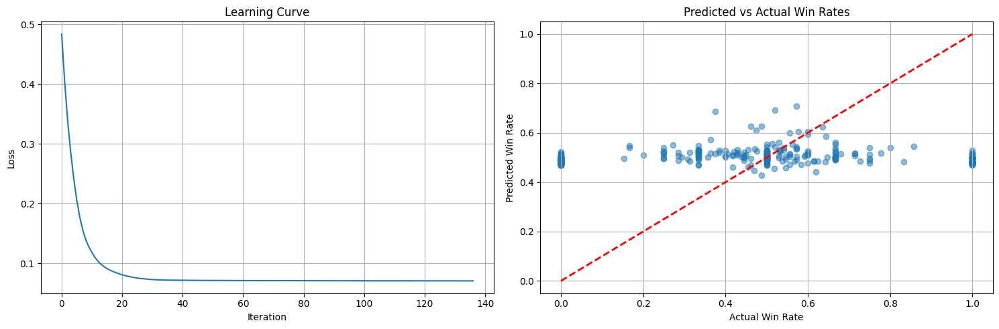


Predicted win rate for new player: -0.03%


/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [16]:
# Import required libraries
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

# Prepare the data
feature_cols = [
    'TOP_games_played', 
    'JUNGLE_games_played', 
    'MIDDLE_games_played', 
    'BOTTOM_games_played', 
    'UTILITY_games_played'
]

X = final_statistics_50[feature_cols]
y = final_statistics_50['overall_win_rate']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42
)

# Create and train model
model = MLPRegressor(
    hidden_layer_sizes=(10, 8, 5),
    activation='relu',
    solver='adam',
    alpha=0.0001,
    batch_size='auto',
    learning_rate='adaptive',
    max_iter=1000,
    random_state=42,
    early_stopping=True,
    validation_fraction=0.1,
    n_iter_no_change=10
)

# Train model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
cv_scores = cross_val_score(model, X_scaled, y, cv=5, scoring='neg_mean_squared_error')
cv_rmse = np.sqrt(-cv_scores.mean())

# Print results
print("\nModel Performance:")
print(f"Test RMSE: {rmse:.4f}")
print(f"Test R²: {r2:.4f}")
print(f"Cross-validation RMSE: {cv_rmse:.4f}")

# Plot results
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Learning curve
ax1.plot(model.loss_curve_)
ax1.set_title('Learning Curve')
ax1.set_xlabel('Iteration')
ax1.set_ylabel('Loss')
ax1.grid(True)

# Predicted vs Actual
ax2.scatter(y_test, y_pred, alpha=0.5)
ax2.plot([min(y_test), max(y_test)], 
         [min(y_test), max(y_test)], 
         'r--', lw=2)
ax2.set_title('Predicted vs Actual Win Rates')
ax2.set_xlabel('Actual Win Rate')
ax2.set_ylabel('Predicted Win Rate')
ax2.grid(True)

plt.tight_layout()
plt.show()

# Example prediction for a new player
new_player = [[100, 50, 20, 10, 5]]  # [TOP, JUNGLE, MIDDLE, BOTTOM, UTILITY]
new_player_scaled = scaler.transform(new_player)
predicted_wr = model.predict(new_player_scaled)[0]
print(f"\nPredicted win rate for new player: {predicted_wr:.2f}%")

Validation Accuracy: 0.8520
Test Accuracy: 0.8496

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.89      0.87       246
           1       0.84      0.79      0.81       173

    accuracy                           0.85       419
   macro avg       0.85      0.84      0.84       419
weighted avg       0.85      0.85      0.85       419



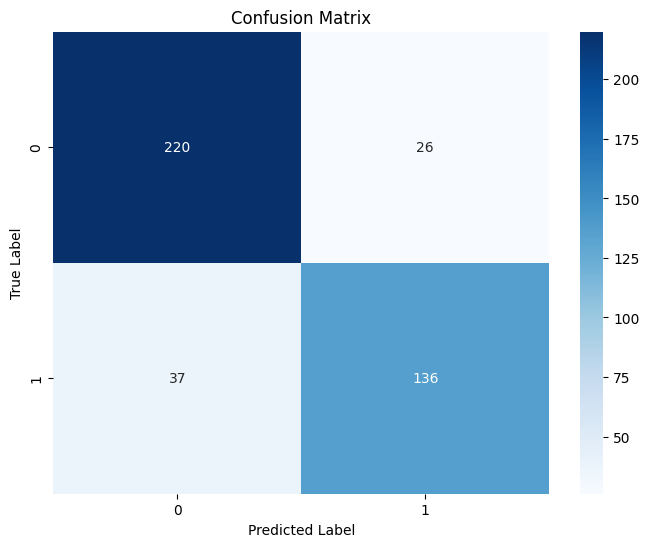

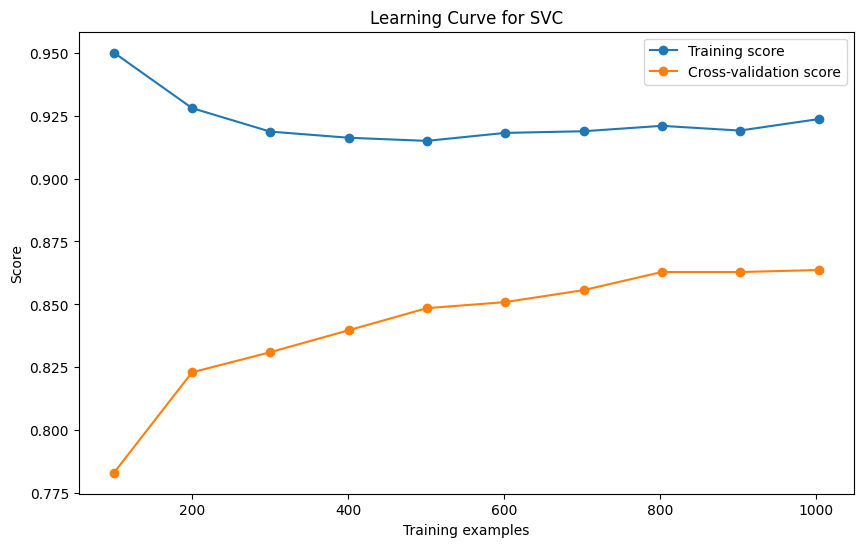

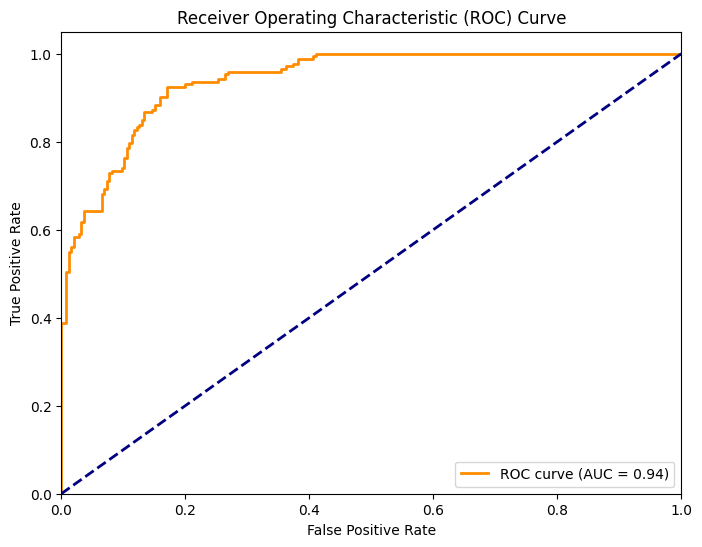

In [13]:
import numpy as np
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Prepare the features and target
individual_features = ['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                       'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate']

team_features = [col for col in final_statistics_50.columns if col.startswith('teammate_avg_') or col.startswith('opponent_avg_')]

features = individual_features + team_features

X = final_statistics_50[features]
y = (final_statistics_50['overall_win_rate'] > 0.5).astype(int)  # 1 if win rate > 50%, 0 otherwise

# Step 2: Split the data into training, validation, and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Step 3: Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Step 4: Train the SVC model
svc = SVC(kernel='rbf', random_state=42)
svc.fit(X_train_scaled, y_train)

# Step 5: Evaluate the model on validation set
y_val_pred = svc.predict(X_val_scaled)
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {val_accuracy:.4f}")

# Step 6: Evaluate the model on test set
y_test_pred = svc.predict(X_test_scaled)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Step 7: Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_test_pred))

# Step 8: Plot confusion matrix
cm = confusion_matrix(y_test, y_test_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Step 9: Learning Curve
train_sizes, train_scores, val_scores = learning_curve(
    svc, X_train_scaled, y_train, train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, scoring='accuracy', n_jobs=-1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', label='Training score')
plt.plot(train_sizes, np.mean(val_scores, axis=1), 'o-', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve for SVC')
plt.legend(loc='best')
plt.show()

# Step 10: ROC Curve
y_score = svc.decision_function(X_test_scaled)
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

Best parameters: {'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}
Best cross-validation score: 0.8899888446215141

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       246
           1       0.84      0.87      0.85       173

    accuracy                           0.88       419
   macro avg       0.87      0.87      0.87       419
weighted avg       0.88      0.88      0.88       419



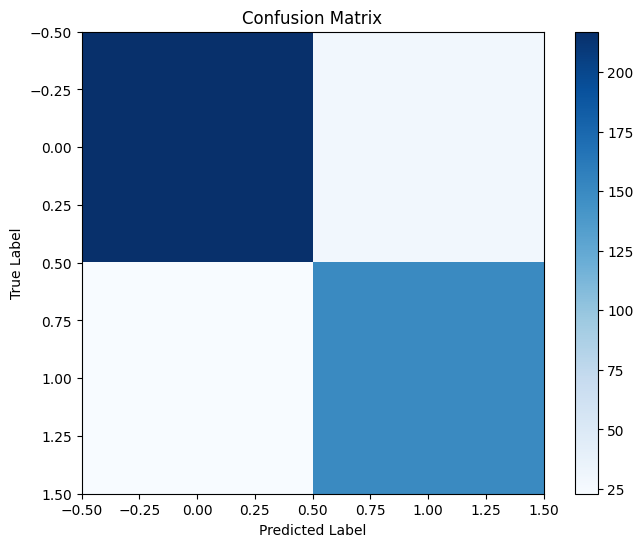

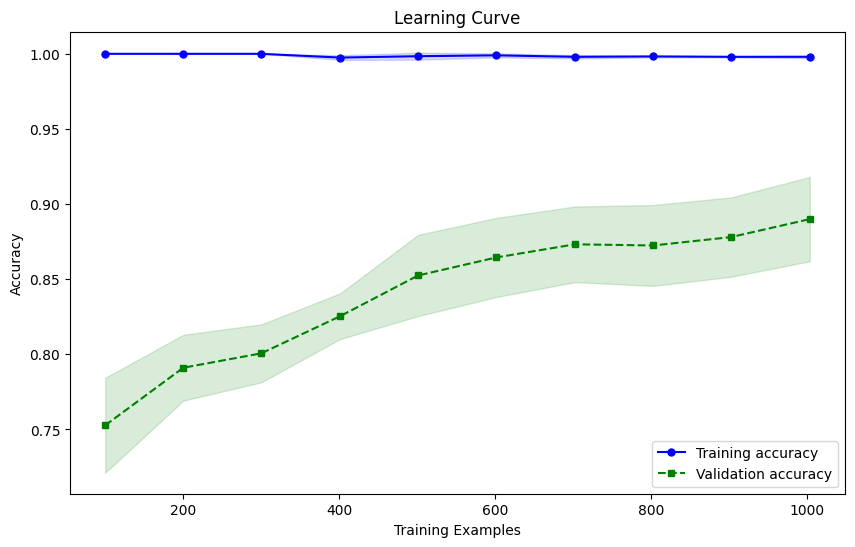

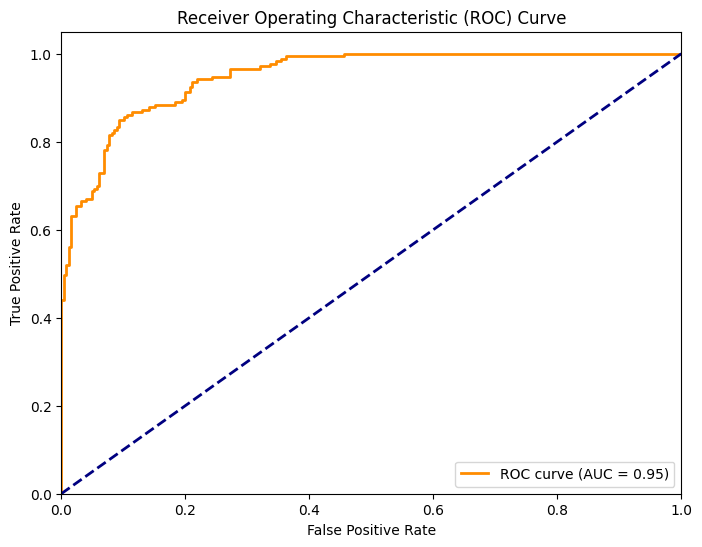

In [14]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# Assuming X_train_scaled, X_test_scaled, y_train, y_test are already defined

# Set up parameter grid
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'kernel': ['rbf', 'linear']
}

# Perform Grid Search
grid_search = GridSearchCV(SVC(), param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

# Print best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Train model with best parameters
best_svc = grid_search.best_estimator_
best_svc.fit(X_train_scaled, y_train)

# Evaluate model
y_pred = best_svc.predict(X_test_scaled)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Plot new learning curve
train_sizes, train_scores, test_scores = learning_curve(
    best_svc, X_train_scaled, y_train, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10))

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.title('Learning Curve')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get prediction probabilities
y_pred_proba = best_svc.decision_function(X_test_scaled)

# Calculate false positive rate, true positive rate, and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [15]:
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[217  29]
 [ 23 150]]


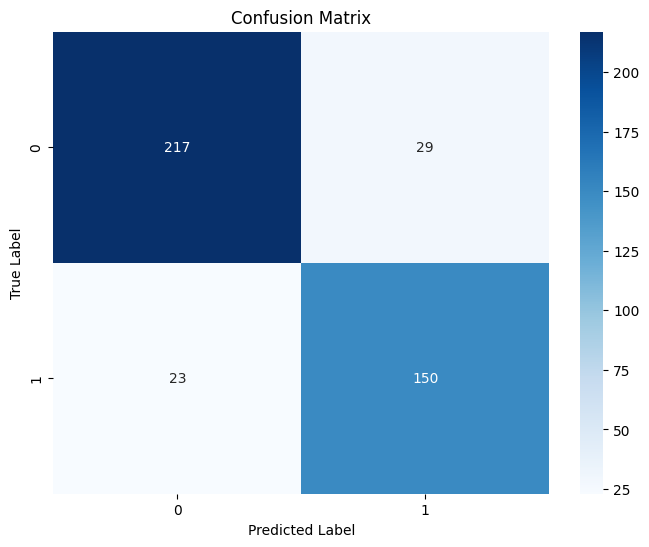

In [16]:
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

Best parameters: {'feature_selection__k': 20, 'svc__C': 10, 'svc__gamma': 0.01, 'svc__kernel': 'rbf'}
Best cross-validation score: 0.8732641859138865

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.90      0.89       246
           1       0.85      0.82      0.84       173

    accuracy                           0.87       419
   macro avg       0.86      0.86      0.86       419
weighted avg       0.87      0.87      0.87       419



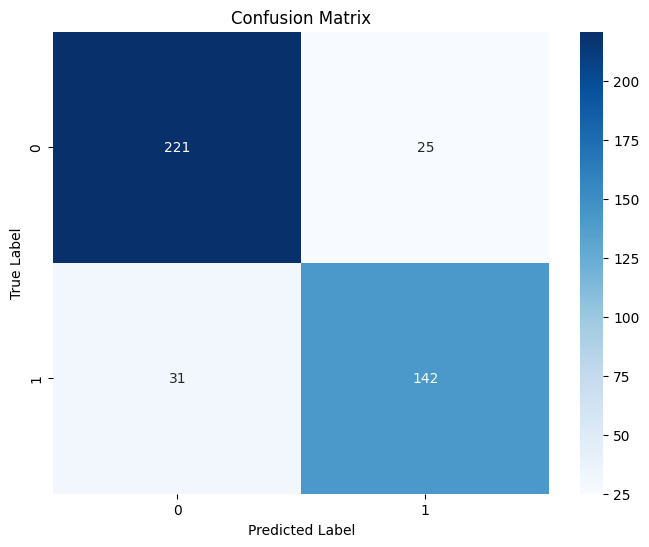

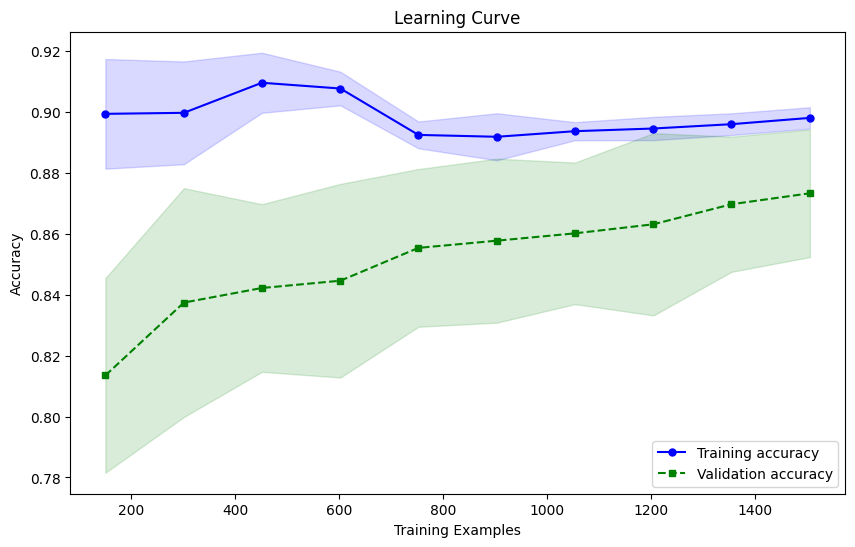

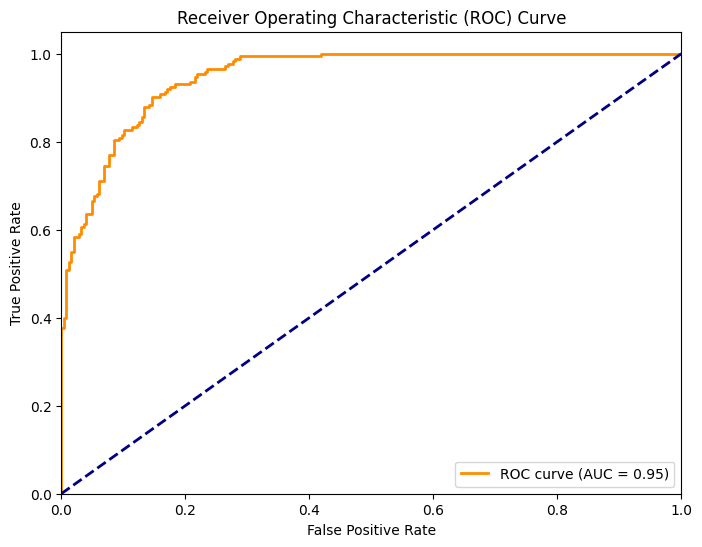

In [17]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming X and y are already defined from your previous code

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('feature_selection', SelectKBest(f_classif)),
    ('svc', SVC())
])

# Define parameter grid
param_grid = {
    'feature_selection__k': [10, 20, 30],  # Number of features to select
    'svc__C': [0.1, 1, 10],  # Reduced from previous range
    'svc__gamma': [0.01, 0.1, 1],
    'svc__kernel': ['rbf', 'linear']
}

# Perform Grid Search with more cross-validation folds
grid_search = GridSearchCV(pipeline, param_grid, cv=10, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get the best model
best_model = grid_search.best_estimator_

# Evaluate model
y_pred = best_model.predict(X_test)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot learning curve
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    best_model, X_train, y_train, cv=10, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.title('Learning Curve')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

# Plot ROC curve
from sklearn.metrics import roc_curve, auc

y_score = best_model.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test, y_score)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [18]:
import numpy as np
from scipy import stats
from sklearn.model_selection import cross_val_score

def get_model_stats(model, X, y, cv=10):
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    mean_accuracy = np.mean(scores)
    std_dev = np.std(scores)
    std_error = std_dev / np.sqrt(len(scores))
    ci = stats.t.interval(confidence=0.95, df=len(scores)-1, loc=mean_accuracy, scale=std_error)
    return {
        'mean_accuracy': mean_accuracy,
        'std_dev': std_dev,
        'std_error': std_error,
        'ci': ci
    }

# Assuming X and y are still in your workspace from the original code

# For the first code (Basic SVM)
basic_svm_stats = get_model_stats(svc, X, y)

print("\nBasic SVM:")
print(f"Mean Accuracy ± 95% CI: {basic_svm_stats['mean_accuracy']:.4f} ± {(basic_svm_stats['ci'][1] - basic_svm_stats['mean_accuracy']):.4f}")
print(f"Std. Dev.: {basic_svm_stats['std_dev']:.4f}")
print(f"Std. Error: {basic_svm_stats['std_error']:.4f}")

# For the second code (GridSearch SVM)
grid_svm_stats = get_model_stats(best_svc, X, y)

print("\nGridSearch SVM:")
print(f"Mean Accuracy ± 95% CI: {grid_svm_stats['mean_accuracy']:.4f} ± {(grid_svm_stats['ci'][1] - grid_svm_stats['mean_accuracy']):.4f}")
print(f"Std. Dev.: {grid_svm_stats['std_dev']:.4f}")
print(f"Std. Error: {grid_svm_stats['std_error']:.4f}")

# For the third code (Pipeline SVM)
pipeline_svm_stats = get_model_stats(best_model, X, y)

print("\nPipeline SVM:")
print(f"Mean Accuracy ± 95% CI: {pipeline_svm_stats['mean_accuracy']:.4f} ± {(pipeline_svm_stats['ci'][1] - pipeline_svm_stats['mean_accuracy']):.4f}")
print(f"Std. Dev.: {pipeline_svm_stats['std_dev']:.4f}")
print(f"Std. Error: {pipeline_svm_stats['std_error']:.4f}")


Basic SVM:
Mean Accuracy ± 95% CI: 0.6502 ± 0.0489
Std. Dev.: 0.0684
Std. Error: 0.0216

GridSearch SVM:
Mean Accuracy ± 95% CI: 0.7512 ± 0.1323
Std. Dev.: 0.1850
Std. Error: 0.0585

Pipeline SVM:
Mean Accuracy ± 95% CI: 0.8587 ± 0.0921
Std. Dev.: 0.1288
Std. Error: 0.0407


## KNN Models ## 

Best parameters: {'knn__metric': 'manhattan', 'knn__n_neighbors': 9, 'knn__weights': 'uniform'}
Best cross-validation score: 0.8428170524622397

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.89      0.86       246
           1       0.83      0.72      0.77       173

    accuracy                           0.82       419
   macro avg       0.82      0.81      0.81       419
weighted avg       0.82      0.82      0.82       419



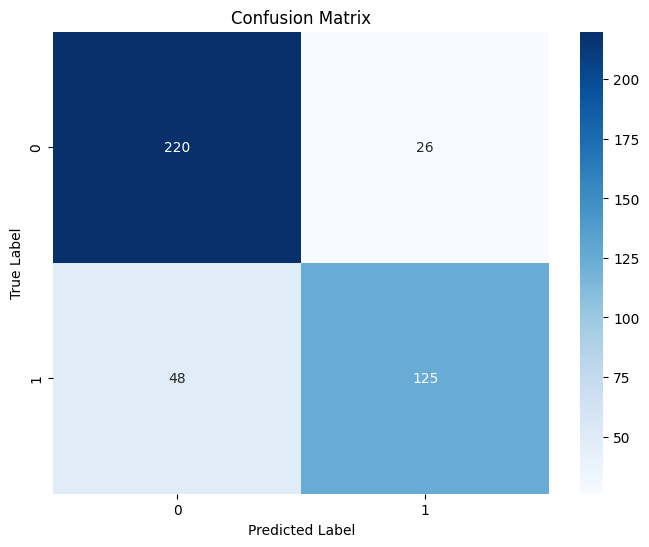

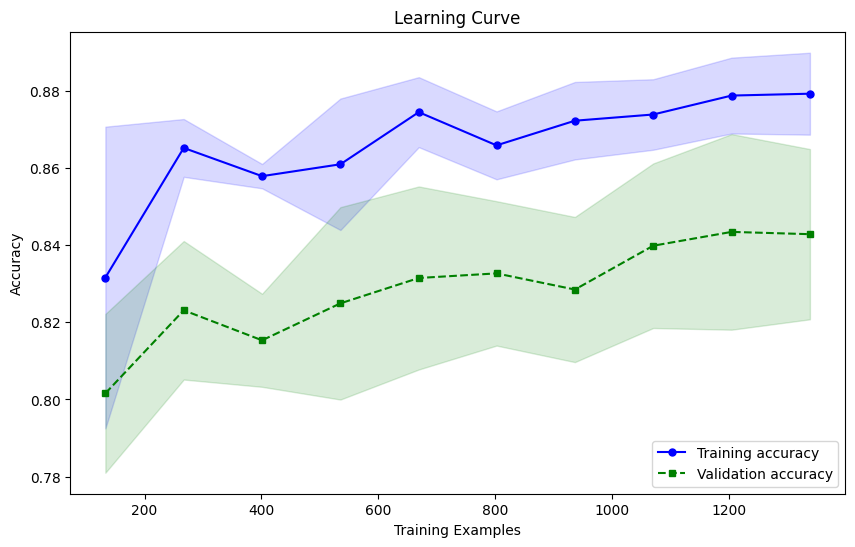

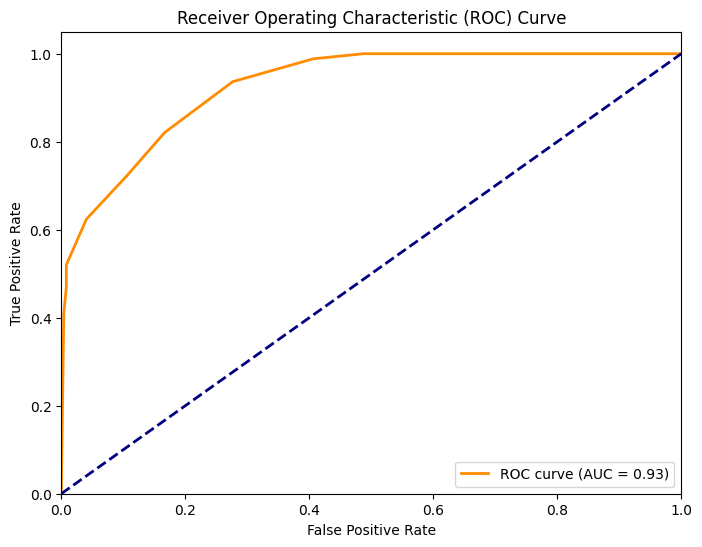

In [19]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data (assuming final_statistics_50 is your DataFrame)
df = final_statistics_50

# Define features and target
individual_features = ['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                       'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate']

team_features = [col for col in df.columns if col.startswith('teammate_avg_') or col.startswith('opponent_avg_')]

features = individual_features + team_features

X = df[features]
y = (df['overall_win_rate'] > 0.5).astype(int)  # 1 if win rate > 50%, 0 otherwise

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier())
])

# Define parameter grid
param_grid = {
    'knn__n_neighbors': [3, 5, 7, 9, 11],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

# Perform Grid Search
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get the best model
best_model = grid_search.best_estimator_

# Evaluate model
y_pred = best_model.predict(X_test)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot learning curve
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    best_model, X_train, y_train, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.title('Learning Curve')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

# Plot ROC curve
y_scores = best_model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [20]:
import numpy as np
from scipy import stats
from sklearn.model_selection import cross_val_score

def get_model_stats(model, X, y, cv=10):
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    mean_accuracy = np.mean(scores)
    std_dev = np.std(scores)
    std_error = std_dev / np.sqrt(len(scores))
    ci = stats.t.interval(confidence=0.95, df=len(scores)-1, loc=mean_accuracy, scale=std_error)
    return {
        'mean_accuracy': mean_accuracy,
        'std_dev': std_dev,
        'std_error': std_error,
        'ci': ci
    }

# After you've run your original code and have best_model defined:
knn_stats = get_model_stats(best_model, X, y)

print("\nKNN Model Statistics:")
print(f"Mean Accuracy ± 95% CI: {knn_stats['mean_accuracy']:.4f} ± {(knn_stats['ci'][1] - knn_stats['mean_accuracy']):.4f}")
print(f"Std. Dev.: {knn_stats['std_dev']:.4f}")
print(f"Std. Error: {knn_stats['std_error']:.4f}")


KNN Model Statistics:
Mean Accuracy ± 95% CI: 0.8305 ± 0.1000
Std. Dev.: 0.1397
Std. Error: 0.0442


Best parameters: {'feature_selection__k': 20, 'knn__metric': 'manhattan', 'knn__n_neighbors': 13, 'knn__p': 1, 'knn__weights': 'distance'}
Best cross-validation score: 0.848787201715971

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.92      0.87       236
           1       0.88      0.75      0.81       183

    accuracy                           0.85       419
   macro avg       0.85      0.84      0.84       419
weighted avg       0.85      0.85      0.85       419

Accuracy: 0.8473


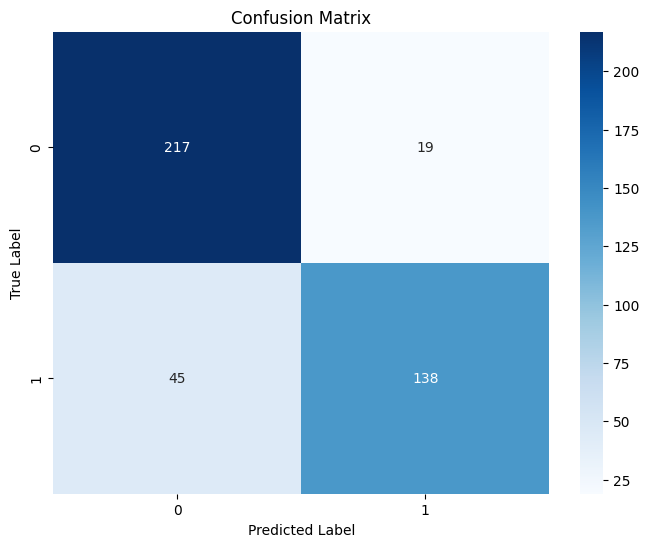

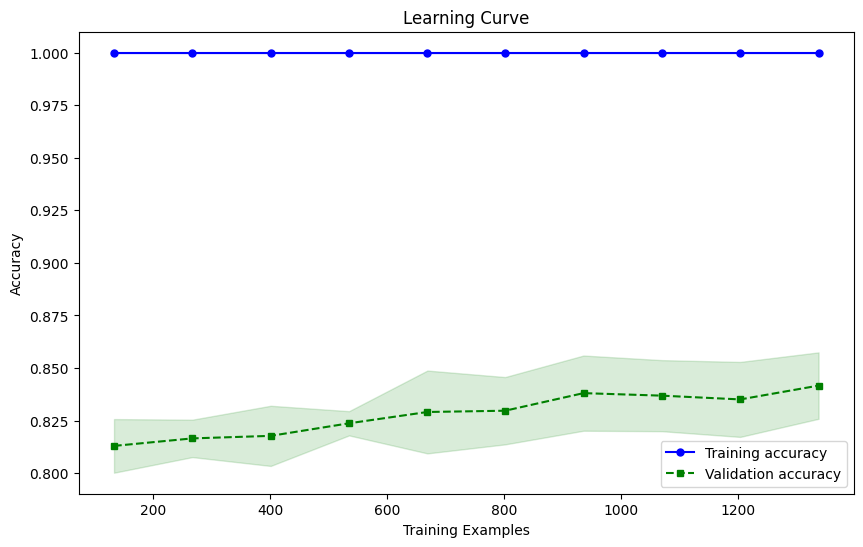

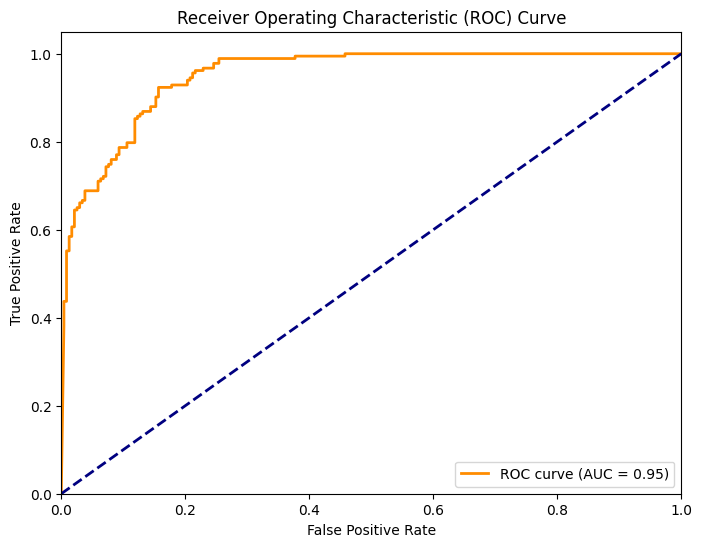


KNN Model Statistics:
Mean Accuracy ± 95% CI: 0.8577 ± 0.0865
Std. Dev.: 0.1209
Std. Error: 0.0382

Selected Features:
MIDDLE_games_played
TOP_win_rate
JUNGLE_win_rate
MIDDLE_win_rate
BOTTOM_win_rate
UTILITY_win_rate
teammate_avg_UTILITY_games_played
teammate_avg_TOP_win_rate
teammate_avg_JUNGLE_win_rate
teammate_avg_MIDDLE_win_rate
teammate_avg_BOTTOM_win_rate
teammate_avg_UTILITY_win_rate
teammate_avg_overall_win_rate
opponent_avg_BOTTOM_games_played
opponent_avg_TOP_win_rate
opponent_avg_JUNGLE_win_rate
opponent_avg_MIDDLE_win_rate
opponent_avg_BOTTOM_win_rate
opponent_avg_UTILITY_win_rate
opponent_avg_overall_win_rate


In [21]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_classif
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = final_statistics_50

# Define features and target
individual_features = ['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                       'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate']
team_features = [col for col in df.columns if col.startswith('teammate_avg_') or col.startswith('opponent_avg_')]
features = individual_features + team_features
X = df[features]
y = (df['overall_win_rate'] > 0.5).astype(int)

# Split the data using stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Create a pipeline with feature selection
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('feature_selection', SelectKBest(f_classif)),
    ('knn', KNeighborsClassifier())
])

# Define an expanded parameter grid
param_grid = {
    'feature_selection__k': [10, 20, 30, 'all'],
    'knn__n_neighbors': [3, 5, 7, 9, 11, 13, 15],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan', 'minkowski'],
    'knn__p': [1, 2, 3]  # Only used when metric='minkowski'
}

# Perform Grid Search with stratified k-fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get the best model
best_model = grid_search.best_estimator_

# Evaluate model
y_pred = best_model.predict(X_test)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Calculate and print accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot learning curve
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    best_model, X_train, y_train, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.title('Learning Curve')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

# Plot ROC curve
y_scores = best_model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate model statistics
from scipy import stats

def get_model_stats(model, X, y, cv=10):
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    mean_accuracy = np.mean(scores)
    std_dev = np.std(scores)
    std_error = std_dev / np.sqrt(len(scores))
    ci = stats.t.interval(confidence=0.95, df=len(scores)-1, loc=mean_accuracy, scale=std_error)
    return {
        'mean_accuracy': mean_accuracy,
        'std_dev': std_dev,
        'std_error': std_error,
        'ci': ci
    }

knn_stats = get_model_stats(best_model, X, y)

print("\nKNN Model Statistics:")
print(f"Mean Accuracy ± 95% CI: {knn_stats['mean_accuracy']:.4f} ± {(knn_stats['ci'][1] - knn_stats['mean_accuracy']):.4f}")
print(f"Std. Dev.: {knn_stats['std_dev']:.4f}")
print(f"Std. Error: {knn_stats['std_error']:.4f}")

# Print feature importances
feature_selector = best_model.named_steps['feature_selection']
selected_features = X.columns[feature_selector.get_support()]
print("\nSelected Features:")
for feature in selected_features:
    print(feature)

## Random Forest ## 

Best parameters: {'rf__max_depth': 10, 'rf__max_features': 'sqrt', 'rf__min_samples_leaf': 1, 'rf__min_samples_split': 5, 'rf__n_estimators': 300}
Best cross-validation score: 0.9079524533023505

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.91      0.90       246
           1       0.87      0.83      0.85       173

    accuracy                           0.88       419
   macro avg       0.87      0.87      0.87       419
weighted avg       0.88      0.88      0.88       419



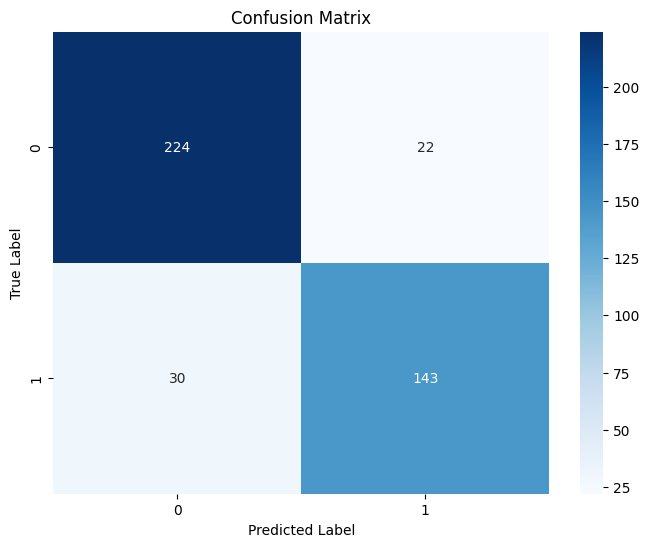

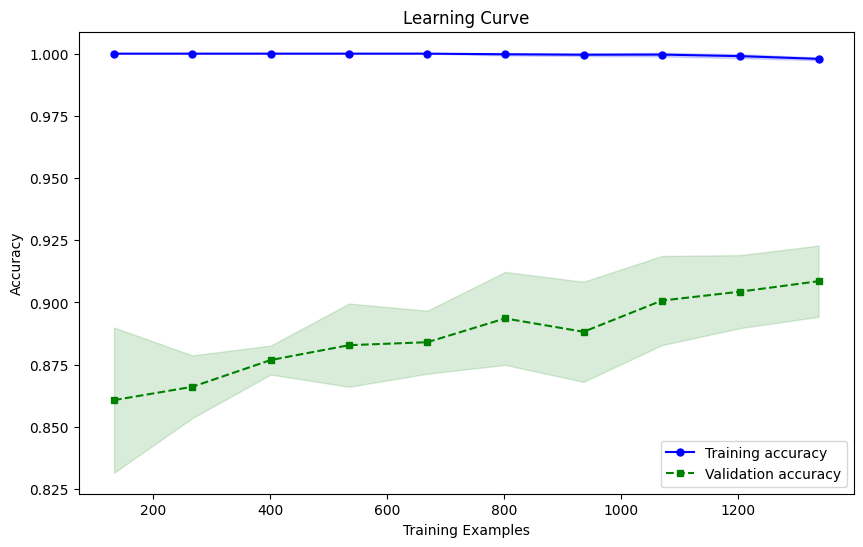

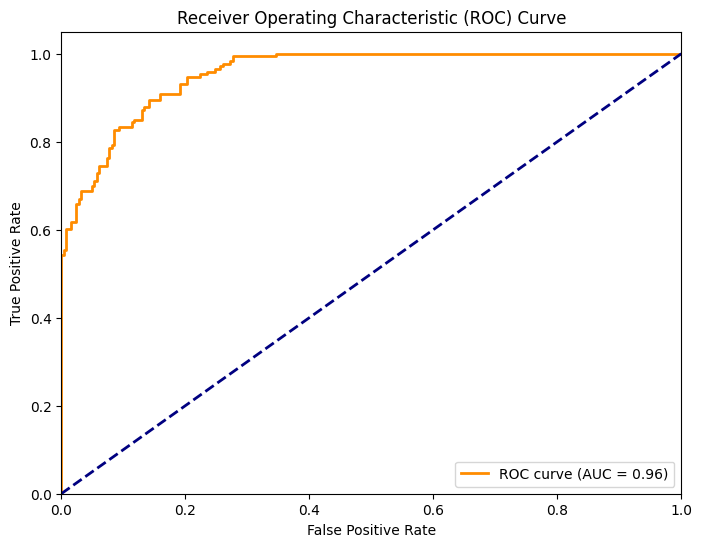

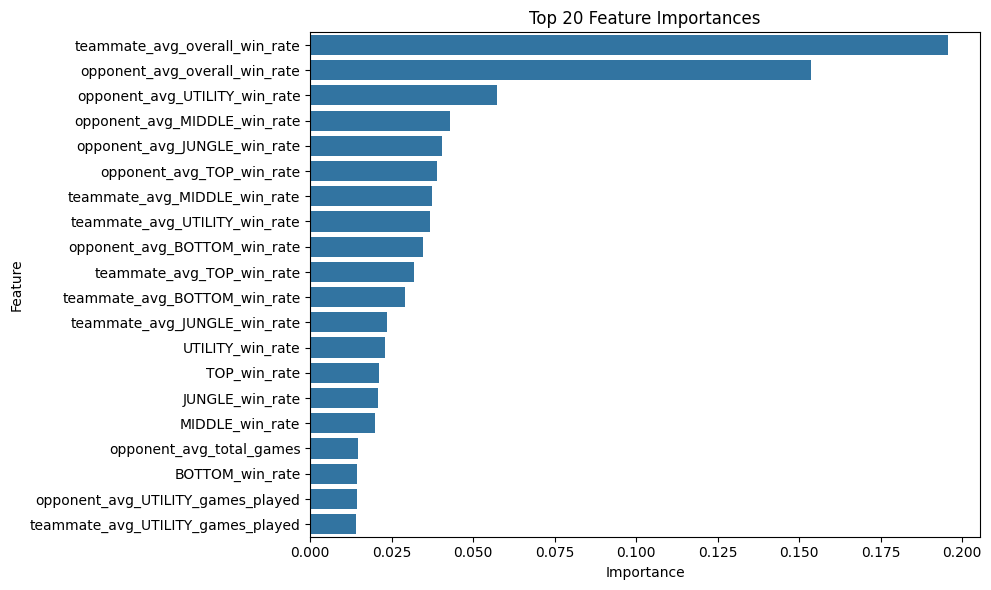


Top 20 features by importance:
    Importance                            Feature
0     0.195682      teammate_avg_overall_win_rate
1     0.153645      opponent_avg_overall_win_rate
2     0.057326      opponent_avg_UTILITY_win_rate
3     0.042912       opponent_avg_MIDDLE_win_rate
4     0.040354       opponent_avg_JUNGLE_win_rate
5     0.039057          opponent_avg_TOP_win_rate
6     0.037344       teammate_avg_MIDDLE_win_rate
7     0.036702      teammate_avg_UTILITY_win_rate
8     0.034723       opponent_avg_BOTTOM_win_rate
9     0.031792          teammate_avg_TOP_win_rate
10    0.029231       teammate_avg_BOTTOM_win_rate
11    0.023563       teammate_avg_JUNGLE_win_rate
12    0.022938                   UTILITY_win_rate
13    0.021174                       TOP_win_rate
14    0.020919                    JUNGLE_win_rate
15    0.019981                    MIDDLE_win_rate
16    0.014661           opponent_avg_total_games
17    0.014393                    BOTTOM_win_rate
18    0.014256  op

In [22]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data (assuming final_statistics_50 is your DataFrame)
df = final_statistics_50

# Define features and target
individual_features = ['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                       'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate']

team_features = [col for col in df.columns if col.startswith('teammate_avg_') or col.startswith('opponent_avg_')]

features = individual_features + team_features

X = df[features]
y = (df['overall_win_rate'] > 0.5).astype(int)  # 1 if win rate > 50%, 0 otherwise

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier(random_state=42))
])

# Define parameter grid
param_grid = {
    'rf__n_estimators': [100, 200, 300],
    'rf__max_depth': [None, 10, 20, 30],
    'rf__min_samples_split': [2, 5, 10],
    'rf__min_samples_leaf': [1, 2, 4],
    'rf__max_features': ['sqrt', 'log2', None]
}

# Perform Grid Search
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get the best model
best_model = grid_search.best_estimator_

# Evaluate model
y_pred = best_model.predict(X_test)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot learning curve
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    best_model, X_train, y_train, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy')

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training accuracy')
plt.fill_between(train_sizes, train_mean + train_std, train_mean - train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Validation accuracy')
plt.fill_between(train_sizes, test_mean + test_std, test_mean - test_std, alpha=0.15, color='green')
plt.title('Learning Curve')
plt.xlabel('Training Examples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

# Plot ROC curve
y_scores = best_model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Feature importance
importances = best_model.named_steps['rf'].feature_importances_
feature_imp = pd.DataFrame(sorted(zip(importances, X.columns), reverse=True), columns=['Importance', 'Feature'])

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_imp.head(20))
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()

print("\nTop 20 features by importance:")
print(feature_imp.head(20))

Best parameters: {'rf__max_depth': 20, 'rf__max_features': 'sqrt', 'rf__min_samples_leaf': 1, 'rf__min_samples_split': 2, 'rf__n_estimators': 100, 'rf__oob_score': True}
Best cross-validation score: 0.9668960609234478

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.89      0.88       246
           1       0.84      0.82      0.83       173

    accuracy                           0.86       419
   macro avg       0.86      0.85      0.85       419
weighted avg       0.86      0.86      0.86       419



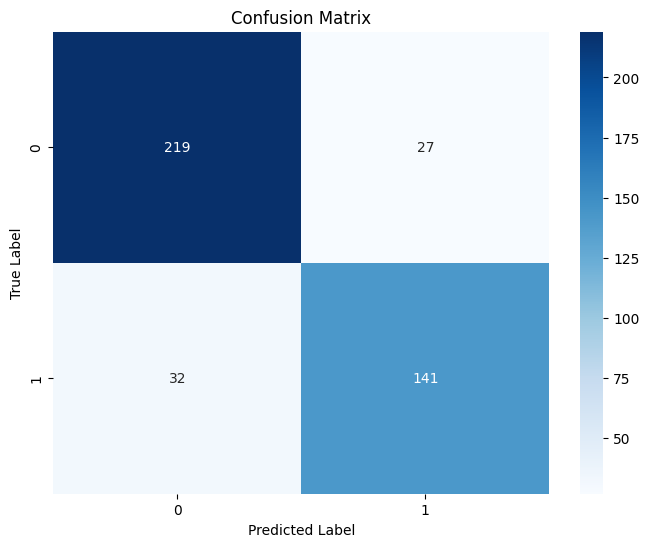

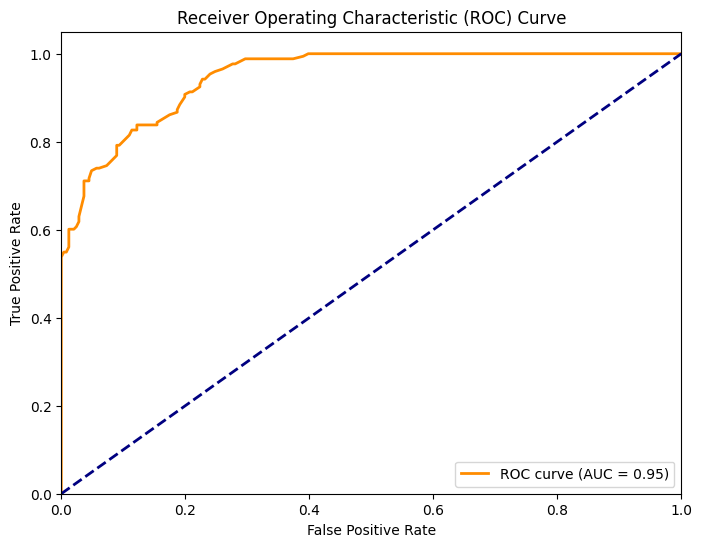


Optimal threshold based on F1 score: 0.480

Classification Report with tuned threshold:
              precision    recall  f1-score   support

           0       0.89      0.88      0.88       246
           1       0.83      0.84      0.83       173

    accuracy                           0.86       419
   macro avg       0.86      0.86      0.86       419
weighted avg       0.86      0.86      0.86       419



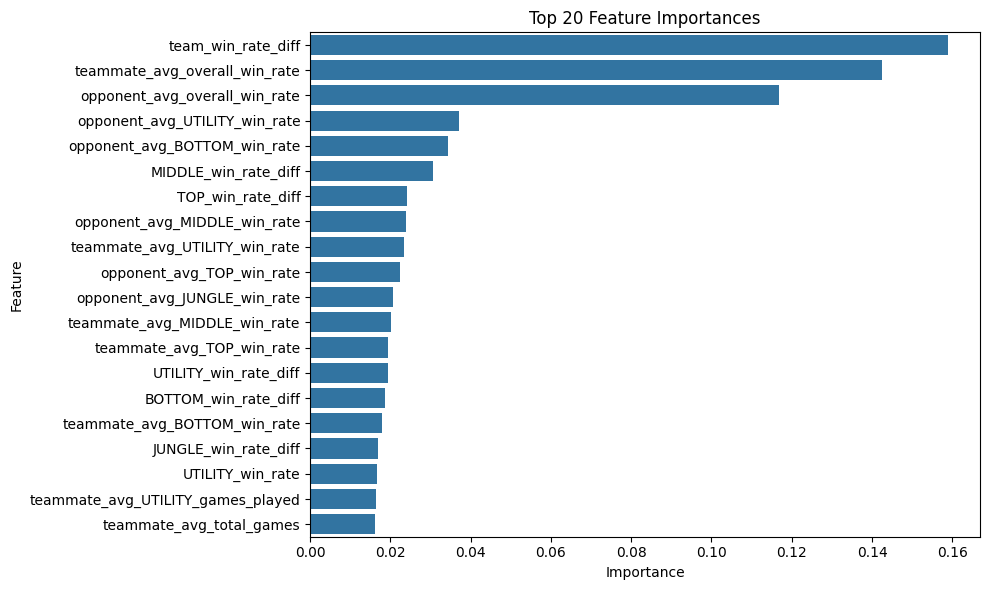


Model Statistics:
Mean Accuracy ± 95% CI: 0.8911 ± 0.0631
Standard Deviation: 0.0882
Standard Error: 0.0279


<Figure size 1000x600 with 0 Axes>

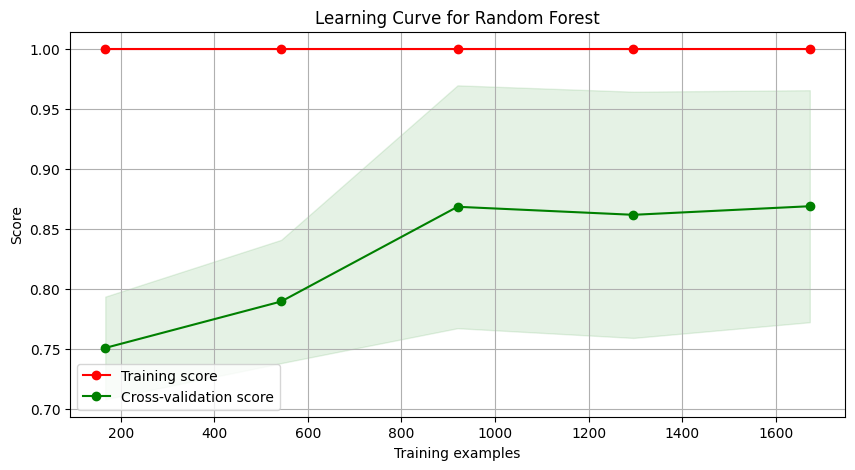


Out-of-Bag Score: 0.8942

Top 20 features by importance:
    Importance                            Feature
0     0.158953                 team_win_rate_diff
1     0.142574      teammate_avg_overall_win_rate
2     0.116788      opponent_avg_overall_win_rate
3     0.037056      opponent_avg_UTILITY_win_rate
4     0.034241       opponent_avg_BOTTOM_win_rate
5     0.030514               MIDDLE_win_rate_diff
6     0.024179                  TOP_win_rate_diff
7     0.023824       opponent_avg_MIDDLE_win_rate
8     0.023413      teammate_avg_UTILITY_win_rate
9     0.022495          opponent_avg_TOP_win_rate
10    0.020624       opponent_avg_JUNGLE_win_rate
11    0.020212       teammate_avg_MIDDLE_win_rate
12    0.019304          teammate_avg_TOP_win_rate
13    0.019282              UTILITY_win_rate_diff
14    0.018722               BOTTOM_win_rate_diff
15    0.017876       teammate_avg_BOTTOM_win_rate
16    0.016920               JUNGLE_win_rate_diff
17    0.016723                   UTILITY_w

In [23]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Load the data
df = final_statistics_50

# Define features and target
individual_features = ['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                       'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate']

team_features = [col for col in df.columns if col.startswith('teammate_avg_') or col.startswith('opponent_avg_')]

features = individual_features + team_features

# Feature engineering
df['team_win_rate_diff'] = df['teammate_avg_overall_win_rate'] - df['opponent_avg_overall_win_rate']
for role in ['TOP', 'JUNGLE', 'MIDDLE', 'BOTTOM', 'UTILITY']:
    df[f'{role}_win_rate_diff'] = df[f'teammate_avg_{role}_win_rate'] - df[f'opponent_avg_{role}_win_rate']

features += ['team_win_rate_diff', 'TOP_win_rate_diff', 'JUNGLE_win_rate_diff', 'MIDDLE_win_rate_diff', 'BOTTOM_win_rate_diff', 'UTILITY_win_rate_diff']

X = df[features]
y = (df['overall_win_rate'] > 0.5).astype(int)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier(random_state=42))
])

# Define parameter grid
param_grid = {
    'rf__n_estimators': [100, 200, 300],
    'rf__max_depth': [10, 20, 30, None],
    'rf__min_samples_split': [2, 5, 10],
    'rf__min_samples_leaf': [1, 2, 4],
    'rf__max_features': ['sqrt', 'log2'],
    'rf__oob_score': [True]  # Added for OOB score calculation
}

# Perform Grid Search with Stratified K-Fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get the best model
best_model = grid_search.best_estimator_

# Evaluate model
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Threshold tuning
precision, recall, thresholds = precision_recall_curve(y_test, y_prob)
f1_scores = 2 * (precision * recall) / (precision + recall)
optimal_threshold = thresholds[np.argmax(f1_scores)]

print(f"\nOptimal threshold based on F1 score: {optimal_threshold:.3f}")

y_pred_tuned = (y_prob >= optimal_threshold).astype(int)
print("\nClassification Report with tuned threshold:")
print(classification_report(y_test, y_pred_tuned))

# Feature importance
importances = best_model.named_steps['rf'].feature_importances_
feature_imp = pd.DataFrame(sorted(zip(importances, X.columns), reverse=True), columns=['Importance', 'Feature'])

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_imp.head(20))
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()

# Function to calculate model statistics
def get_model_stats(model, X, y, cv=10):
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    mean_accuracy = np.mean(scores)
    std_dev = np.std(scores)
    std_error = std_dev / np.sqrt(len(scores))
    ci = stats.t.interval(confidence=0.95, df=len(scores)-1, loc=mean_accuracy, scale=std_error)
    return {
        'mean_accuracy': mean_accuracy,
        'std_dev': std_dev,
        'std_error': std_error,
        'ci': ci
    }

# Calculate and print model statistics
model_stats = get_model_stats(best_model, X, y)

print("\nModel Statistics:")
print(f"Mean Accuracy ± 95% CI: {model_stats['mean_accuracy']:.4f} ± {(model_stats['ci'][1] - model_stats['mean_accuracy']):.4f}")
print(f"Standard Deviation: {model_stats['std_dev']:.4f}")
print(f"Standard Error: {model_stats['std_error']:.4f}")

# Function to plot learning curve
def plot_learning_curve(estimator, X, y, title="Learning Curve", axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    if axes is None:
        _, axes = plt.subplots(1, 1, figsize=(10, 5))

    axes.set_title(title)
    if ylim is not None:
        axes.set_ylim(*ylim)
    axes.set_xlabel("Training examples")
    axes.set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = \
        learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs,
                       train_sizes=train_sizes,
                       return_times=True)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # Plot learning curve
    axes.grid()
    axes.fill_between(train_sizes, train_scores_mean - train_scores_std,
                      train_scores_mean + train_scores_std, alpha=0.1,
                      color="r")
    axes.fill_between(train_sizes, test_scores_mean - test_scores_std,
                      test_scores_mean + test_scores_std, alpha=0.1,
                      color="g")
    axes.plot(train_sizes, train_scores_mean, 'o-', color="r",
              label="Training score")
    axes.plot(train_sizes, test_scores_mean, 'o-', color="g",
              label="Cross-validation score")
    axes.legend(loc="best")

    return plt

# Plot learning curve
plt.figure(figsize=(10, 6))
plot_learning_curve(best_model, X, y, cv=5)
plt.title("Learning Curve for Random Forest")
plt.show()

# Print OOB score
oob_score = best_model.named_steps['rf'].oob_score_
print(f"\nOut-of-Bag Score: {oob_score:.4f}")

print("\nTop 20 features by importance:")
print(feature_imp.head(20))

## Addressing the problem of overfitting in the random forest model ## 

Best parameters: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 1, 'rf__max_features': 'log2', 'rf__max_depth': 10}
Best cross-validation score: 0.9515358664596704

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.88      0.86       236
           1       0.83      0.78      0.80       183

    accuracy                           0.83       419
   macro avg       0.83      0.83      0.83       419
weighted avg       0.83      0.83      0.83       419



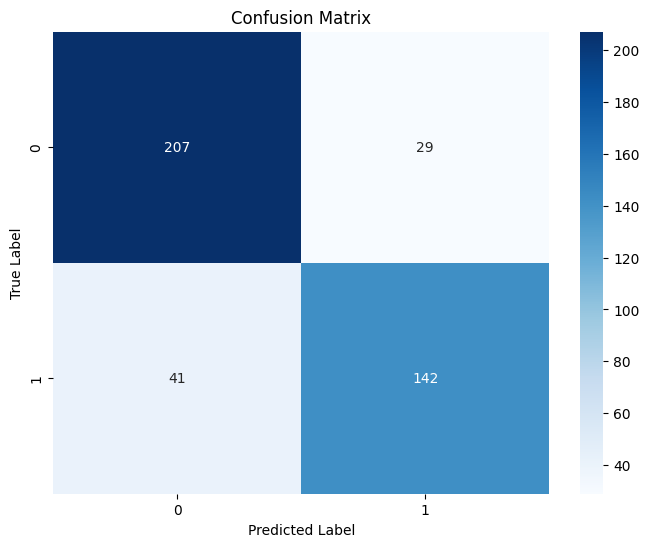

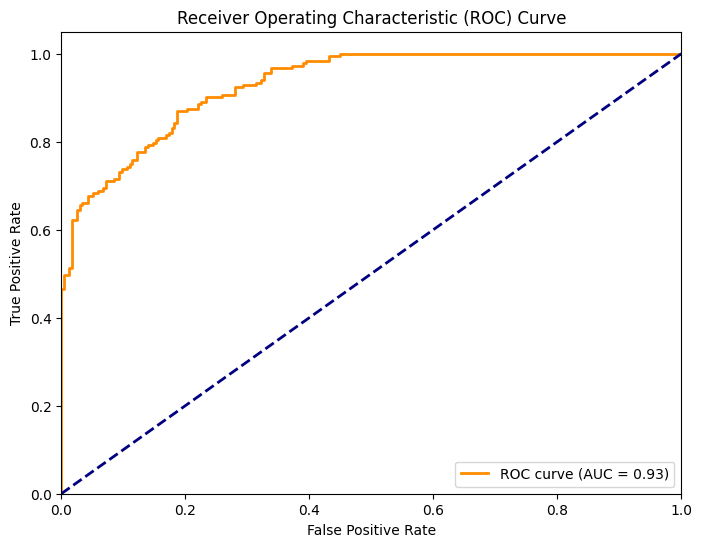

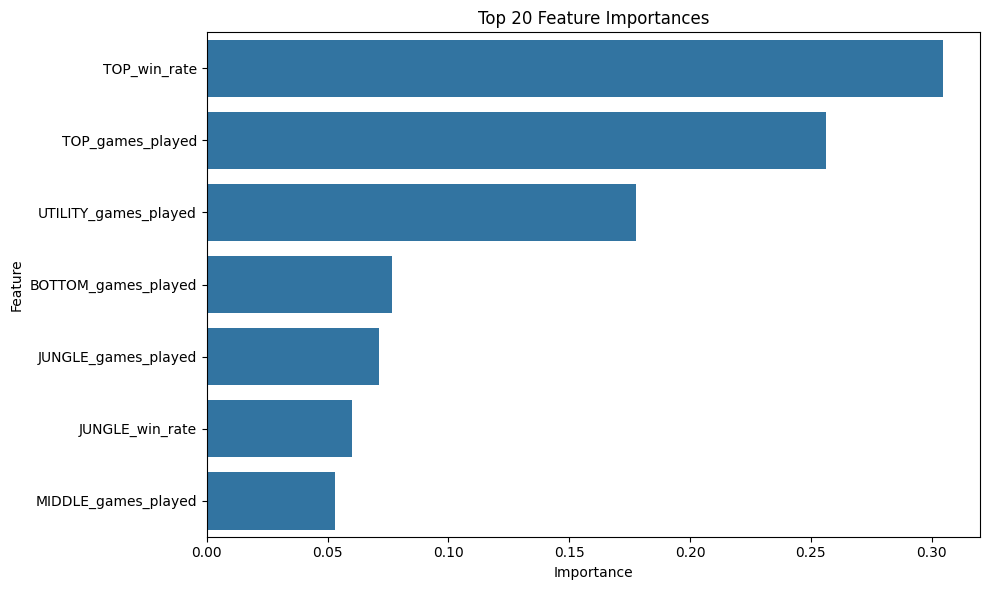


Model Statistics:
Mean Accuracy ± 95% CI: 0.8362 ± 0.1545
Standard Deviation: 0.1245
Standard Error: 0.0557

Top 20 features by importance:
   Importance               Feature
0    0.304805          TOP_win_rate
1    0.256290      TOP_games_played
2    0.177613  UTILITY_games_played
3    0.076685   BOTTOM_games_played
4    0.071446   JUNGLE_games_played
5    0.060004       JUNGLE_win_rate
6    0.053156   MIDDLE_games_played


In [24]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectFromModel
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Load the data
df = final_statistics_50

# Define features and target
individual_features = ['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                       'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate']
team_features = [col for col in df.columns if col.startswith('teammate_avg_') or col.startswith('opponent_avg_')]
features = individual_features + team_features

# Feature engineering
df['team_win_rate_diff'] = df['teammate_avg_overall_win_rate'] - df['opponent_avg_overall_win_rate']
for role in ['TOP', 'JUNGLE', 'MIDDLE', 'BOTTOM', 'UTILITY']:
    df[f'{role}_win_rate_diff'] = df[f'teammate_avg_{role}_win_rate'] - df[f'opponent_avg_{role}_win_rate']
features += ['team_win_rate_diff', 'TOP_win_rate_diff', 'JUNGLE_win_rate_diff', 'MIDDLE_win_rate_diff', 'BOTTOM_win_rate_diff', 'UTILITY_win_rate_diff']

X = df[features]
y = (df['overall_win_rate'] > 0.5).astype(int)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Create a pipeline
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('feature_selection', SelectFromModel(RandomForestClassifier(n_estimators=100, random_state=42))),
    ('rf', RandomForestClassifier(random_state=42))
])

# Define parameter distribution
param_dist = {
    'rf__n_estimators': [100, 200, 300],
    'rf__max_depth': [10, 20, None],
    'rf__min_samples_split': [2, 5, 10],
    'rf__min_samples_leaf': [1, 2, 4],
    'rf__max_features': ['sqrt', 'log2']
}

# Perform Randomized Search
random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=20, cv=5, scoring='roc_auc', n_jobs=-1, random_state=42)
random_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best cross-validation score:", random_search.best_score_)

# Get the best model
best_model = random_search.best_estimator_

# Evaluate model
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Feature importance
importances = best_model.named_steps['rf'].feature_importances_
feature_imp = pd.DataFrame(sorted(zip(importances, X.columns), reverse=True), columns=['Importance', 'Feature'])

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_imp.head(20))
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()

# Function to calculate model statistics
def get_model_stats(model, X, y, cv=5):
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    mean_accuracy = np.mean(scores)
    std_dev = np.std(scores)
    std_error = std_dev / np.sqrt(len(scores))
    ci = stats.t.interval(confidence=0.95, df=len(scores)-1, loc=mean_accuracy, scale=std_error)
    return {
        'mean_accuracy': mean_accuracy,
        'std_dev': std_dev,
        'std_error': std_error,
        'ci': ci
    }

# Calculate and print model statistics
model_stats = get_model_stats(best_model, X, y)

print("\nModel Statistics:")
print(f"Mean Accuracy ± 95% CI: {model_stats['mean_accuracy']:.4f} ± {(model_stats['ci'][1] - model_stats['mean_accuracy']):.4f}")
print(f"Standard Deviation: {model_stats['std_dev']:.4f}")
print(f"Standard Error: {model_stats['std_error']:.4f}")

print("\nTop 20 features by importance:")
print(feature_imp.head(20))

Best parameters: {'rf__oob_score': False, 'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_features': 'sqrt', 'rf__max_depth': 10}
Best cross-validation score: 0.9514875871654404

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.87      0.85       236
           1       0.83      0.78      0.80       183

    accuracy                           0.83       419
   macro avg       0.83      0.82      0.83       419
weighted avg       0.83      0.83      0.83       419



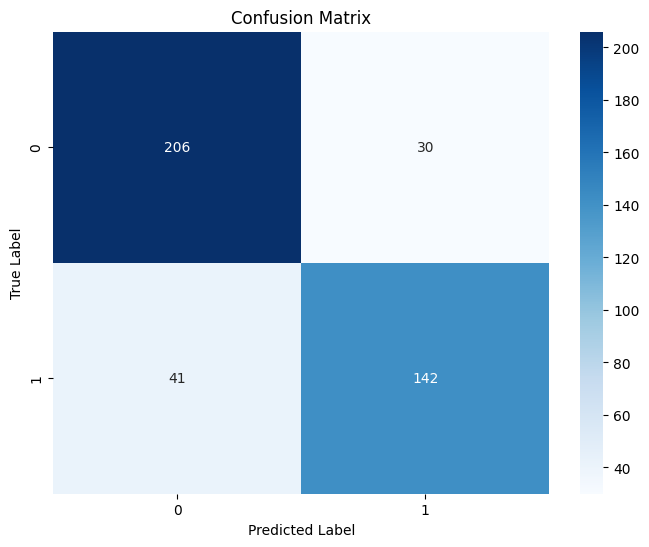

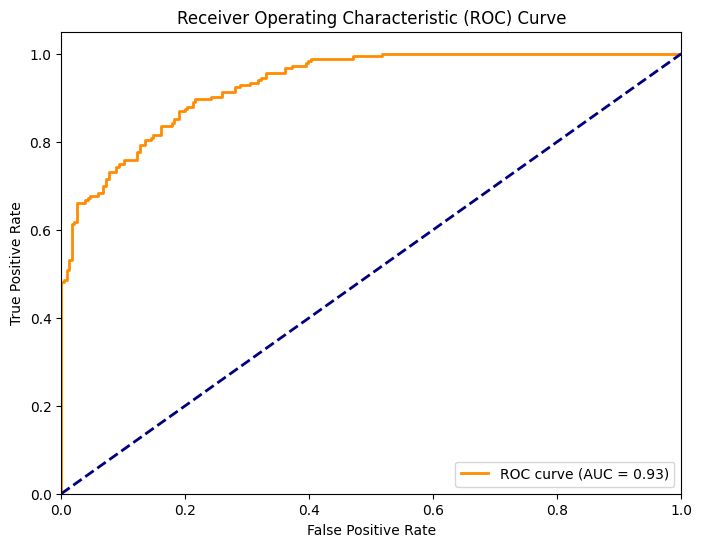

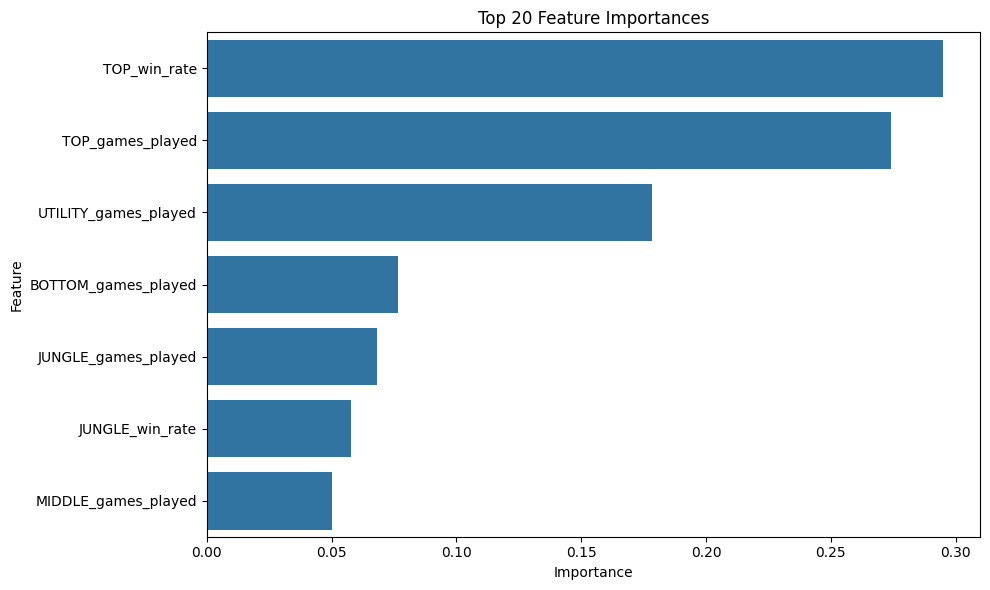


Model Statistics:
Mean Accuracy ± 95% CI: 0.8405 ± 0.1522
Standard Deviation: 0.1226
Standard Error: 0.0548


<Figure size 1000x600 with 0 Axes>

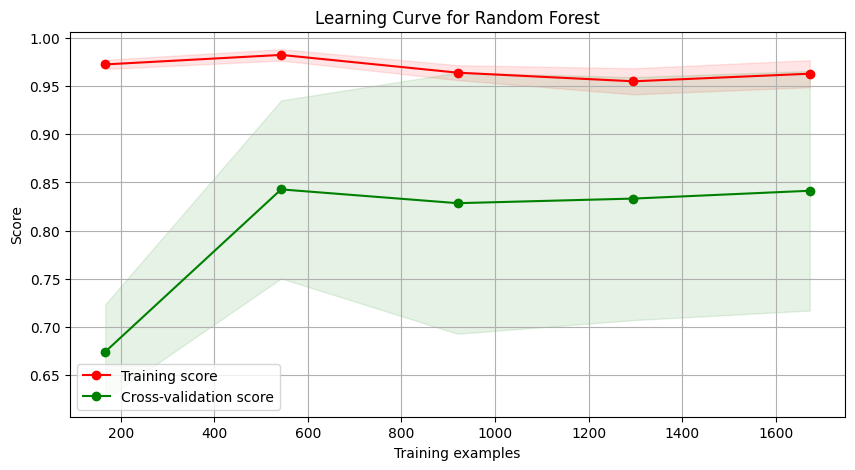


Top 20 features by importance:
   Importance               Feature
0    0.294969          TOP_win_rate
1    0.274182      TOP_games_played
2    0.178220  UTILITY_games_played
3    0.076599   BOTTOM_games_played
4    0.068155   JUNGLE_games_played
5    0.057892       JUNGLE_win_rate
6    0.049983   MIDDLE_games_played


In [25]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectFromModel
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Load the data
df = final_statistics_50  # Assuming this DataFrame is available

# Define features and target
individual_features = ['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                       'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate']
team_features = [col for col in df.columns if col.startswith('teammate_avg_') or col.startswith('opponent_avg_')]
features = individual_features + team_features

# Feature engineering
df['team_win_rate_diff'] = df['teammate_avg_overall_win_rate'] - df['opponent_avg_overall_win_rate']
for role in ['TOP', 'JUNGLE', 'MIDDLE', 'BOTTOM', 'UTILITY']:
    df[f'{role}_win_rate_diff'] = df[f'teammate_avg_{role}_win_rate'] - df[f'opponent_avg_{role}_win_rate']
features += ['team_win_rate_diff', 'TOP_win_rate_diff', 'JUNGLE_win_rate_diff', 'MIDDLE_win_rate_diff', 'BOTTOM_win_rate_diff', 'UTILITY_win_rate_diff']

X = df[features]
y = (df['overall_win_rate'] > 0.5).astype(int)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Create a pipeline
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('feature_selection', SelectFromModel(RandomForestClassifier(n_estimators=100, random_state=42))),
    ('rf', RandomForestClassifier(random_state=42))
])

# Define parameter distribution
param_dist = {
    'rf__n_estimators': [100, 200, 300],
    'rf__max_depth': [10, 20, None],
    'rf__min_samples_split': [2, 5, 10],
    'rf__min_samples_leaf': [1, 2, 4],
    'rf__max_features': ['sqrt', 'log2'],
    'rf__oob_score': [True, False]
}

# Perform Randomized Search
random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=20, cv=5, scoring='roc_auc', n_jobs=-1, random_state=42)
random_search.fit(X_train, y_train)

# Print best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best cross-validation score:", random_search.best_score_)

# Get the best model
best_model = random_search.best_estimator_

# Evaluate model
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Feature importance
importances = best_model.named_steps['rf'].feature_importances_
feature_imp = pd.DataFrame(sorted(zip(importances, X.columns), reverse=True), columns=['Importance', 'Feature'])

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_imp.head(20))
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()

# Function to calculate model statistics
def get_model_stats(model, X, y, cv=5):
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    mean_accuracy = np.mean(scores)
    std_dev = np.std(scores)
    std_error = std_dev / np.sqrt(len(scores))
    ci = stats.t.interval(confidence=0.95, df=len(scores)-1, loc=mean_accuracy, scale=std_error)
    return {
        'mean_accuracy': mean_accuracy,
        'std_dev': std_dev,
        'std_error': std_error,
        'ci': ci
    }

# Calculate and print model statistics
model_stats = get_model_stats(best_model, X, y)

print("\nModel Statistics:")
print(f"Mean Accuracy ± 95% CI: {model_stats['mean_accuracy']:.4f} ± {(model_stats['ci'][1] - model_stats['mean_accuracy']):.4f}")
print(f"Standard Deviation: {model_stats['std_dev']:.4f}")
print(f"Standard Error: {model_stats['std_error']:.4f}")

# Function to plot learning curve
def plot_learning_curve(estimator, X, y, title="Learning Curve", axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    if axes is None:
        _, axes = plt.subplots(1, 1, figsize=(10, 5))

    axes.set_title(title)
    if ylim is not None:
        axes.set_ylim(*ylim)
    axes.set_xlabel("Training examples")
    axes.set_ylabel("Score")

    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # Plot learning curve
    axes.grid()
    axes.fill_between(train_sizes, train_scores_mean - train_scores_std,
                      train_scores_mean + train_scores_std, alpha=0.1,
                      color="r")
    axes.fill_between(train_sizes, test_scores_mean - test_scores_std,
                      test_scores_mean + test_scores_std, alpha=0.1,
                      color="g")
    axes.plot(train_sizes, train_scores_mean, 'o-', color="r",
              label="Training score")
    axes.plot(train_sizes, test_scores_mean, 'o-', color="g",
              label="Cross-validation score")
    axes.legend(loc="best")

    return plt

# Plot learning curve
plt.figure(figsize=(10, 6))
plot_learning_curve(best_model, X, y, cv=5)
plt.title("Learning Curve for Random Forest")
plt.show()

print("\nTop 20 features by importance:")
print(feature_imp.head(20))

# If Random Forest has oob_score enabled, print the OOB score
if hasattr(best_model.named_steps['rf'], 'oob_score_'):
    print(f"\nOut-of-Bag Score: {best_model.named_steps['rf'].oob_score_:.4f}")


## Further Improvements ## 

Best parameters: {'rf__n_estimators': 200, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 4, 'rf__max_features': 'log2', 'rf__max_depth': 10}
Best cross-validation score: 0.9536274475384673

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.83      0.85       246
           1       0.77      0.84      0.80       173

    accuracy                           0.83       419
   macro avg       0.83      0.83      0.83       419
weighted avg       0.83      0.83      0.83       419



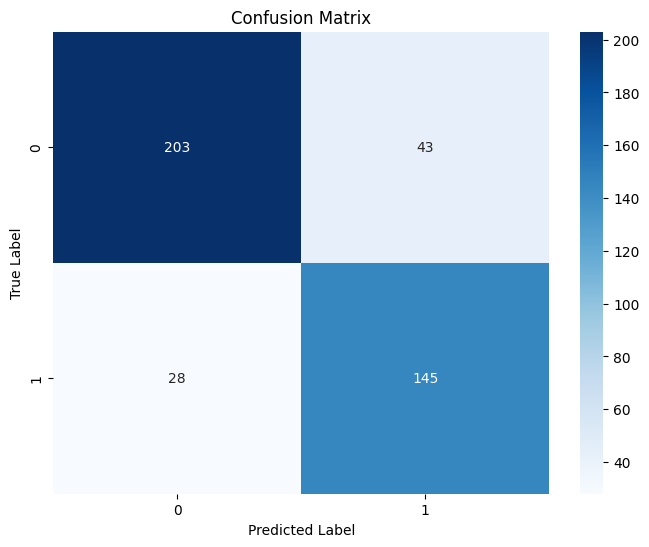

<Figure size 1000x600 with 0 Axes>

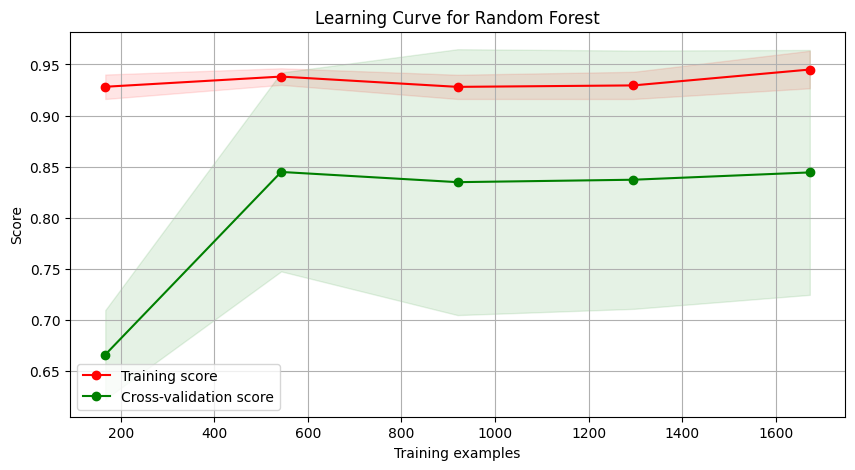


Model Statistics:
Mean Accuracy ± 95% CI: 0.8443 ± 0.1496
Standard Deviation: 0.1205
Standard Error: 0.0539


IndexError: boolean index did not match indexed array along dimension 0; dimension is 6 but corresponding boolean dimension is 40

In [26]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectFromModel
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Load the data
df = final_statistics_50

# Define features and target
individual_features = ['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played',
                       'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate']
team_features = [col for col in df.columns if col.startswith('teammate_avg_') or col.startswith('opponent_avg_')]
features = individual_features + team_features

# Feature engineering
df['team_win_rate_diff'] = df['teammate_avg_overall_win_rate'] - df['opponent_avg_overall_win_rate']
for role in ['TOP', 'JUNGLE', 'MIDDLE', 'BOTTOM', 'UTILITY']:
    df[f'{role}_win_rate_diff'] = df[f'teammate_avg_{role}_win_rate'] - df[f'opponent_avg_{role}_win_rate']
features += ['team_win_rate_diff', 'TOP_win_rate_diff', 'JUNGLE_win_rate_diff', 'MIDDLE_win_rate_diff', 'BOTTOM_win_rate_diff', 'UTILITY_win_rate_diff']

X = df[features]
y = (df['overall_win_rate'] > 0.5).astype(int)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create pipeline with simplified feature selection
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('feature_selection', SelectFromModel(RandomForestClassifier(n_estimators=100, random_state=42))),
    ('rf', RandomForestClassifier(random_state=42, class_weight='balanced'))
])

# Define focused parameter distribution
param_dist = {
    'rf__n_estimators': [100, 200],
    'rf__max_depth': [5, 10, 15],
    'rf__min_samples_split': [5, 10],
    'rf__min_samples_leaf': [4, 8],
    'rf__max_features': ['sqrt', 'log2']
}

# Perform Randomized Search with fewer iterations
random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, 
                                 n_iter=20, cv=5, scoring='roc_auc', 
                                 n_jobs=-1, random_state=42)
random_search.fit(X_train, y_train)

# Get the best model
best_model = random_search.best_estimator_

# Print best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best cross-validation score:", random_search.best_score_)

# Evaluate model
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Function to plot learning curve
def plot_learning_curve(estimator, X, y, title="Learning Curve", axes=None, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    if axes is None:
        _, axes = plt.subplots(1, 1, figsize=(10, 5))

    axes.set_title(title)
    if ylim is not None:
        axes.set_ylim(*ylim)
    axes.set_xlabel("Training examples")
    axes.set_ylabel("Score")

    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    axes.grid()
    axes.fill_between(train_sizes, train_scores_mean - train_scores_std,
                      train_scores_mean + train_scores_std, alpha=0.1,
                      color="r")
    axes.fill_between(train_sizes, test_scores_mean - test_scores_std,
                      test_scores_mean + test_scores_std, alpha=0.1,
                      color="g")
    axes.plot(train_sizes, train_scores_mean, 'o-', color="r",
              label="Training score")
    axes.plot(train_sizes, test_scores_mean, 'o-', color="g",
              label="Cross-validation score")
    axes.legend(loc="best")
    return plt

# Plot learning curve
plt.figure(figsize=(10, 6))
plot_learning_curve(best_model, X, y, cv=5)
plt.title("Learning Curve for Random Forest")
plt.show()

# Calculate model statistics
def get_model_stats(model, X, y, cv=5):
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    mean_accuracy = np.mean(scores)
    std_dev = np.std(scores)
    std_error = std_dev / np.sqrt(len(scores))
    ci = stats.t.interval(confidence=0.95, df=len(scores)-1, loc=mean_accuracy, scale=std_error)
    return {
        'mean_accuracy': mean_accuracy,
        'std_dev': std_dev,
        'std_error': std_error,
        'ci': ci
    }

# Get and print model statistics
model_stats = get_model_stats(best_model, X, y)
print("\nModel Statistics:")
print(f"Mean Accuracy ± 95% CI: {model_stats['mean_accuracy']:.4f} ± {(model_stats['ci'][1] - model_stats['mean_accuracy']):.4f}")
print(f"Standard Deviation: {model_stats['std_dev']:.4f}")
print(f"Standard Error: {model_stats['std_error']:.4f}")

# Print feature importances
importances = best_model.named_steps['rf'].feature_importances_
selected_mask = best_model.named_steps['feature_selection'].get_support()
selected_features = X.columns[selected_mask]
feature_imp = pd.DataFrame({'Feature': selected_features, 
                           'Importance': importances[selected_mask]})
feature_imp = feature_imp.sort_values('Importance', ascending=False)

print("\nSelected Features and Their Importances:")
print(feature_imp)

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_imp)
plt.title('Feature Importances (After Selection)')
plt.tight_layout()
plt.show()

## Advanced Models ## 

## Trying to reduce overfitting ## 

Training model...
Fitting 5 folds for each of 2 candidates, totalling 10 fits


/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters


Best parameters: {'xgb__colsample_bytree': 0.6, 'xgb__gamma': 0.2, 'xgb__learning_rate': 0.01, 'xgb__max_depth': 3, 'xgb__min_child_weight': 5, 'xgb__n_estimators': 100, 'xgb__reg_alpha': 1, 'xgb__reg_lambda': 2, 'xgb__subsample': 0.6}
Best cross-validation score: 0.9576052280428347

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.89      0.87       236
           1       0.85      0.79      0.82       183

    accuracy                           0.84       419
   macro avg       0.85      0.84      0.84       419
weighted avg       0.84      0.84      0.84       419



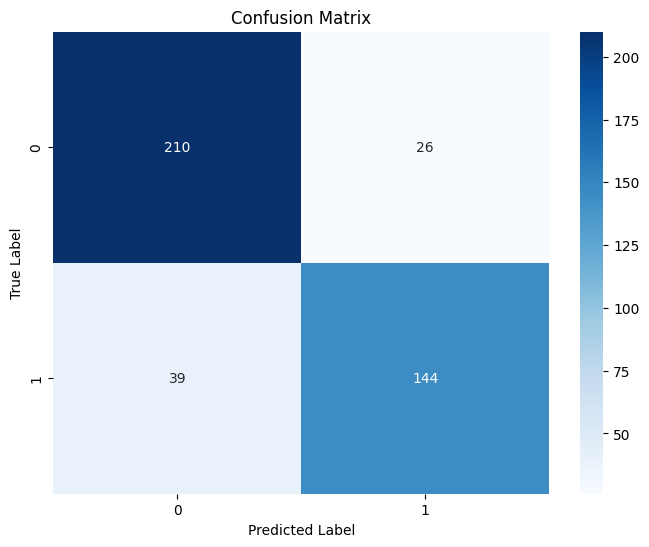

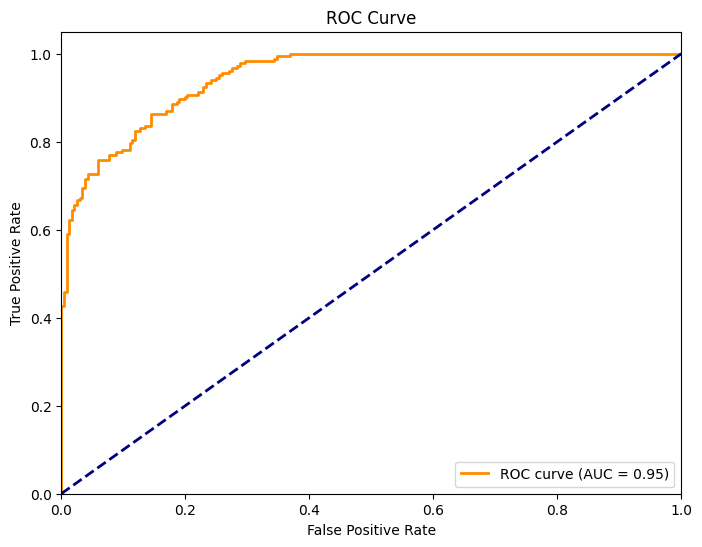

/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:44] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters

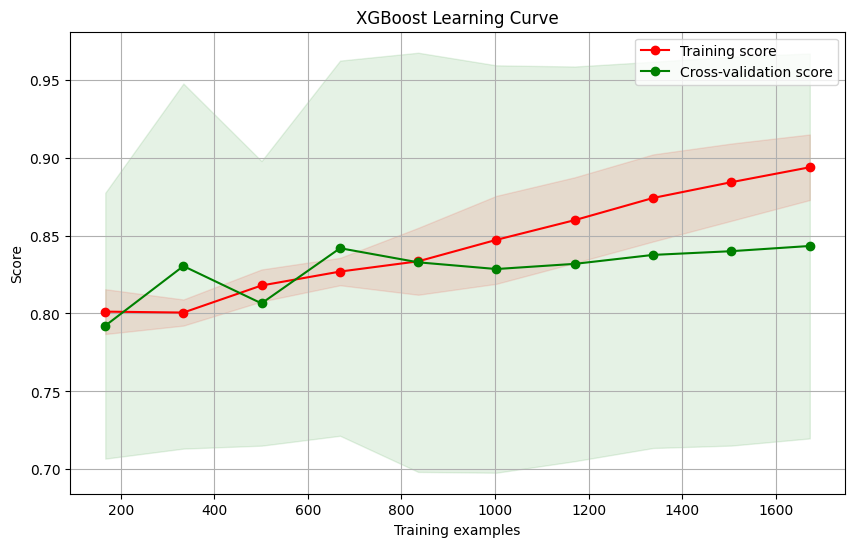


Final scores:
Training Score: 0.8938 ± 0.0210
CV Score: 0.8433 ± 0.1235


/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:45] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:45] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:45] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [11:24:45] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters


Model Statistics:
Mean Accuracy ± 95% CI: 0.8429 ± 0.1534
Standard Deviation: 0.1236
Standard Error: 0.0553


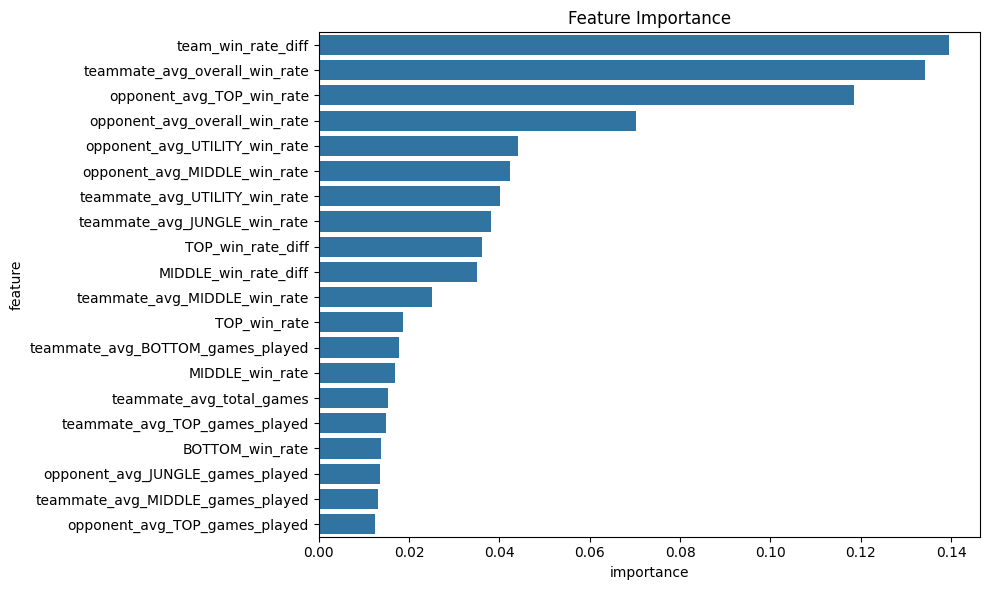

In [35]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from scipy.stats import t

# Create pipeline
xgb_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('xgb', xgb.XGBClassifier(
        random_state=42,
        use_label_encoder=False,
        eval_metric='logloss'
    ))
])

# Define focused parameter grid with strong regularization
xgb_param_grid = {
    'xgb__n_estimators': [100],
    'xgb__max_depth': [2, 3],
    'xgb__learning_rate': [0.01],0
    'xgb__min_child_weight': [5],
    'xgb__subsample': [0.6],
    'xgb__colsample_bytree': [0.6],
    'xgb__gamma': [0.2],
    'xgb__reg_alpha': [1],
    'xgb__reg_lambda': [2]
}

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Perform Grid Search
print("Training model...")
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(
    xgb_pipeline, 
    xgb_param_grid, 
    cv=cv, 
    scoring='roc_auc', 
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)

# Print results
print("\nBest parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get best model
best_model = grid_search.best_estimator_

# Evaluate on test set
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# Learning curve
def plot_learning_curve(estimator, X, y, title):
    train_sizes = np.linspace(0.1, 1.0, 10)
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y,
        train_sizes=train_sizes,
        cv=5,
        n_jobs=-1,
        scoring='accuracy'
    )
    
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, 'o-', color='r', label='Training score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='r')
    plt.plot(train_sizes, test_mean, 'o-', color='g', label='Cross-validation score')
    plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='g')
    
    plt.xlabel('Training examples')
    plt.ylabel('Score')
    plt.title(title)
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
    
    print(f"\nFinal scores:")
    print(f"Training Score: {train_mean[-1]:.4f} ± {train_std[-1]:.4f}")
    print(f"CV Score: {test_mean[-1]:.4f} ± {test_std[-1]:.4f}")

# Plot learning curve
plot_learning_curve(best_model, X, y, "XGBoost Learning Curve")

# Calculate model statistics
scores = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')
mean_accuracy = np.mean(scores)
std_dev = np.std(scores)
std_error = std_dev / np.sqrt(len(scores))
ci = t.interval(0.95, len(scores)-1, loc=mean_accuracy, scale=std_error)

print("\nModel Statistics:")
print(f"Mean Accuracy ± 95% CI: {mean_accuracy:.4f} ± {(ci[1] - mean_accuracy):.4f}")
print(f"Standard Deviation: {std_dev:.4f}")
print(f"Standard Error: {std_error:.4f}")

# Feature importance
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': best_model.named_steps['xgb'].feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance.head(20))
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

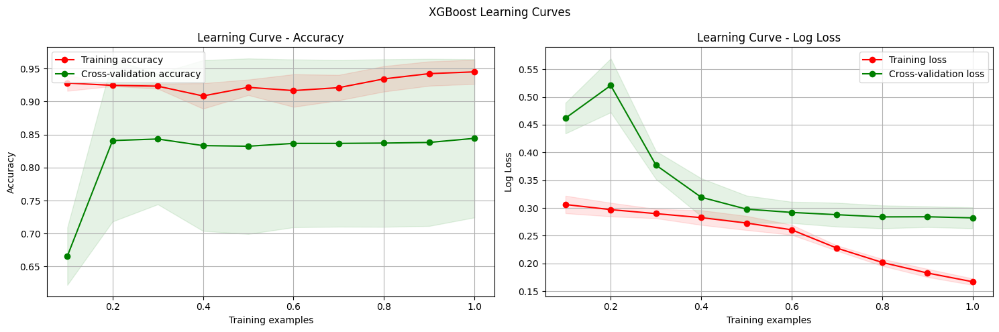


Final scores:
Training Accuracy: 0.9450 ± 0.0184
CV Accuracy: 0.8443 ± 0.1199
Training Loss: 0.1671 ± 0.0058
CV Loss: 0.2821 ± 0.0188


In [28]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, learning_curve, StratifiedKFold
from sklearn.metrics import log_loss
from sklearn.base import clone  # Added this import
import matplotlib.pyplot as plt

def plot_learning_curves(estimator, X, y, title):
    """
    Plot both accuracy and log loss learning curves for training and validation sets.
    
    Parameters:
    -----------
    estimator : estimator object
        A fitted estimator object implementing 'fit' and 'predict_proba'
    X : array-like
        Training data
    y : array-like
        Target values
    title : string
        Plot title
    """
    train_sizes = np.linspace(0.1, 1.0, 10)
    
    # Get accuracy scores
    train_sizes_acc, train_scores_acc, test_scores_acc = learning_curve(
        estimator, X, y,
        train_sizes=train_sizes,
        cv=5,
        n_jobs=-1,
        scoring='accuracy'
    )
    
    # Calculate log loss manually
    train_scores_loss = []
    test_scores_loss = []
    
    for train_idx, valid_idx in StratifiedKFold(n_splits=5, shuffle=True, random_state=42).split(X, y):
        X_train_cv, X_valid_cv = X.iloc[train_idx], X.iloc[valid_idx]
        y_train_cv, y_valid_cv = y.iloc[train_idx], y.iloc[valid_idx]
        
        # Initialize lists for this fold
        train_loss_fold = []
        valid_loss_fold = []
        
        for size in train_sizes:
            # Take a subset of training data
            subset_size = int(len(X_train_cv) * size)
            X_subset = X_train_cv.iloc[:subset_size]
            y_subset = y_train_cv.iloc[:subset_size]
            
            # Fit model on subset
            model_clone = clone(estimator)
            model_clone.fit(X_subset, y_subset)
            
            # Calculate losses
            train_proba = model_clone.predict_proba(X_subset)
            valid_proba = model_clone.predict_proba(X_valid_cv)
            
            train_loss = log_loss(y_subset, train_proba)
            valid_loss = log_loss(y_valid_cv, valid_proba)
            
            train_loss_fold.append(train_loss)
            valid_loss_fold.append(valid_loss)
        
        train_scores_loss.append(train_loss_fold)
        test_scores_loss.append(valid_loss_fold)
    
    train_scores_loss = np.array(train_scores_loss)
    test_scores_loss = np.array(test_scores_loss)
    
    # Calculate statistics
    train_mean_acc = np.mean(train_scores_acc, axis=1)
    train_std_acc = np.std(train_scores_acc, axis=1)
    test_mean_acc = np.mean(test_scores_acc, axis=1)
    test_std_acc = np.std(test_scores_acc, axis=1)
    
    train_mean_loss = np.mean(train_scores_loss, axis=0)
    train_std_loss = np.std(train_scores_loss, axis=0)
    test_mean_loss = np.mean(test_scores_loss, axis=0)
    test_std_loss = np.std(test_scores_loss, axis=0)
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot accuracy
    ax1.plot(train_sizes, train_mean_acc, 'o-', color='r', label='Training accuracy')
    ax1.fill_between(train_sizes, train_mean_acc - train_std_acc, 
                     train_mean_acc + train_std_acc, alpha=0.1, color='r')
    ax1.plot(train_sizes, test_mean_acc, 'o-', color='g', label='Cross-validation accuracy')
    ax1.fill_between(train_sizes, test_mean_acc - test_std_acc,
                     test_mean_acc + test_std_acc, alpha=0.1, color='g')
    ax1.set_xlabel('Training examples')
    ax1.set_ylabel('Accuracy')
    ax1.set_title('Learning Curve - Accuracy')
    ax1.legend(loc='best')
    ax1.grid(True)
    
    # Plot loss
    ax2.plot(train_sizes, train_mean_loss, 'o-', color='r', label='Training loss')
    ax2.fill_between(train_sizes, train_mean_loss - train_std_loss,
                     train_mean_loss + train_std_loss, alpha=0.1, color='r')
    ax2.plot(train_sizes, test_mean_loss, 'o-', color='g', label='Cross-validation loss')
    ax2.fill_between(train_sizes, test_mean_loss - test_std_loss,
                     test_mean_loss + test_std_loss, alpha=0.1, color='g')
    ax2.set_xlabel('Training examples')
    ax2.set_ylabel('Log Loss')
    ax2.set_title('Learning Curve - Log Loss')
    ax2.legend(loc='best')
    ax2.grid(True)
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    
    # Print final scores
    print(f"\nFinal scores:")
    print(f"Training Accuracy: {train_mean_acc[-1]:.4f} ± {train_std_acc[-1]:.4f}")
    print(f"CV Accuracy: {test_mean_acc[-1]:.4f} ± {test_std_acc[-1]:.4f}")
    print(f"Training Loss: {train_mean_loss[-1]:.4f} ± {train_std_loss[-1]:.4f}")
    print(f"CV Loss: {test_mean_loss[-1]:.4f} ± {test_std_loss[-1]:.4f}")

# Replace the existing learning curve call with:
plot_learning_curves(best_model, X, y, "XGBoost Learning Curves")

In [30]:
# First, let's check your current data structure
print("Available features:")
print(X.columns.tolist())
print("\nShape of data:")
print(X.shape)

# Also check for any null values
print("\nNull values in dataset:")
print(X.isnull().sum())

Available features:
['TOP_games_played', 'JUNGLE_games_played', 'MIDDLE_games_played', 'BOTTOM_games_played', 'UTILITY_games_played', 'TOP_win_rate', 'JUNGLE_win_rate', 'MIDDLE_win_rate', 'BOTTOM_win_rate', 'UTILITY_win_rate', 'teammate_avg_TOP_games_played', 'teammate_avg_JUNGLE_games_played', 'teammate_avg_MIDDLE_games_played', 'teammate_avg_BOTTOM_games_played', 'teammate_avg_UTILITY_games_played', 'teammate_avg_TOP_win_rate', 'teammate_avg_JUNGLE_win_rate', 'teammate_avg_MIDDLE_win_rate', 'teammate_avg_BOTTOM_win_rate', 'teammate_avg_UTILITY_win_rate', 'teammate_avg_total_games', 'teammate_avg_overall_win_rate', 'opponent_avg_TOP_games_played', 'opponent_avg_JUNGLE_games_played', 'opponent_avg_MIDDLE_games_played', 'opponent_avg_BOTTOM_games_played', 'opponent_avg_UTILITY_games_played', 'opponent_avg_TOP_win_rate', 'opponent_avg_JUNGLE_win_rate', 'opponent_avg_MIDDLE_win_rate', 'opponent_avg_BOTTOM_win_rate', 'opponent_avg_UTILITY_win_rate', 'opponent_avg_total_games', 'opponent_av

In [38]:
# First, let's check the data types
print("\nDataframe Info:")
print(X.info())

# Let's see which columns contain non-numeric data
non_numeric_columns = X.select_dtypes(exclude=['int64', 'float64']).columns
print("\nNon-numeric columns:")
print(non_numeric_columns)


Dataframe Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2092 entries, 0 to 2091
Data columns (total 48 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   puuid                              2092 non-null   object 
 1   BOTTOM_games_played                2092 non-null   float64
 2   JUNGLE_games_played                2092 non-null   float64
 3   MIDDLE_games_played                2092 non-null   float64
 4   TOP_games_played                   2092 non-null   float64
 5   UTILITY_games_played               2092 non-null   float64
 6   BOTTOM_win_rate                    2092 non-null   float64
 7   JUNGLE_win_rate                    2092 non-null   float64
 8   MIDDLE_win_rate                    2092 non-null   float64
 9   TOP_win_rate                       2092 non-null   float64
 10  UTILITY_win_rate                   2092 non-null   float64
 11  total_games                        2092

Starting model training...
Fitting 5 folds for each of 8 candidates, totalling 40 fits

Best parameters: {'xgb__colsample_bytree': 0.7, 'xgb__gamma': 0.1, 'xgb__learning_rate': 0.05, 'xgb__max_depth': 4, 'xgb__min_child_weight': 5, 'xgb__n_estimators': 200, 'xgb__reg_alpha': 1, 'xgb__reg_lambda': 2, 'xgb__subsample': 0.7}
Best cross-validation score: 0.9754360502580512

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       236
           1       0.91      0.90      0.90       183

    accuracy                           0.91       419
   macro avg       0.91      0.91      0.91       419
weighted avg       0.91      0.91      0.91       419



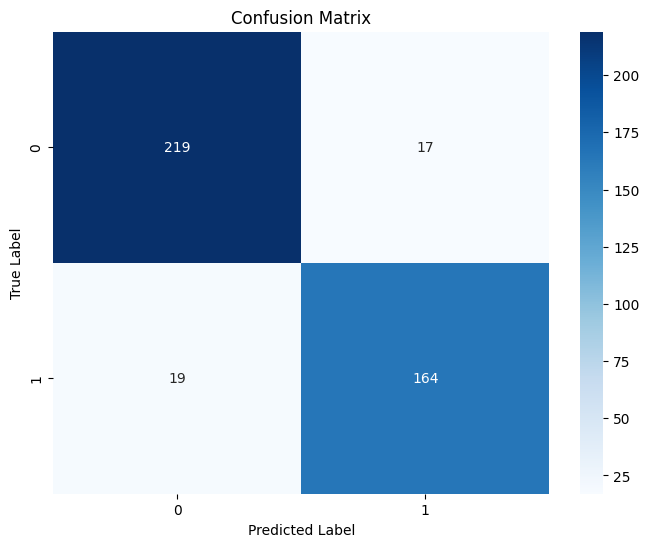

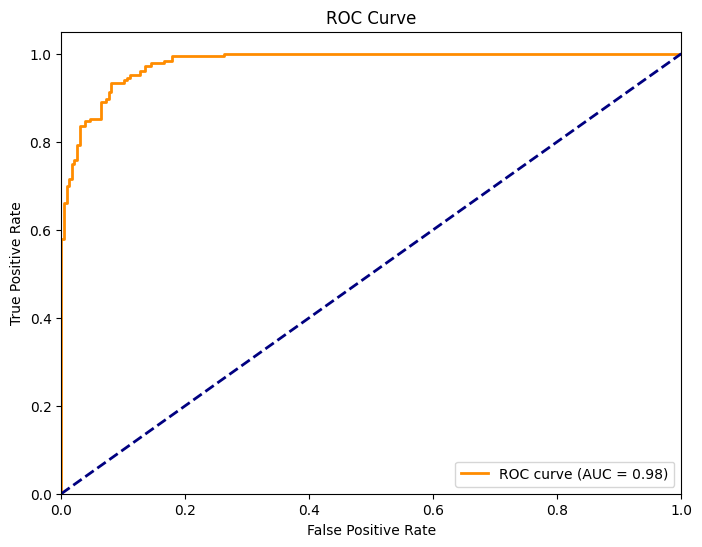

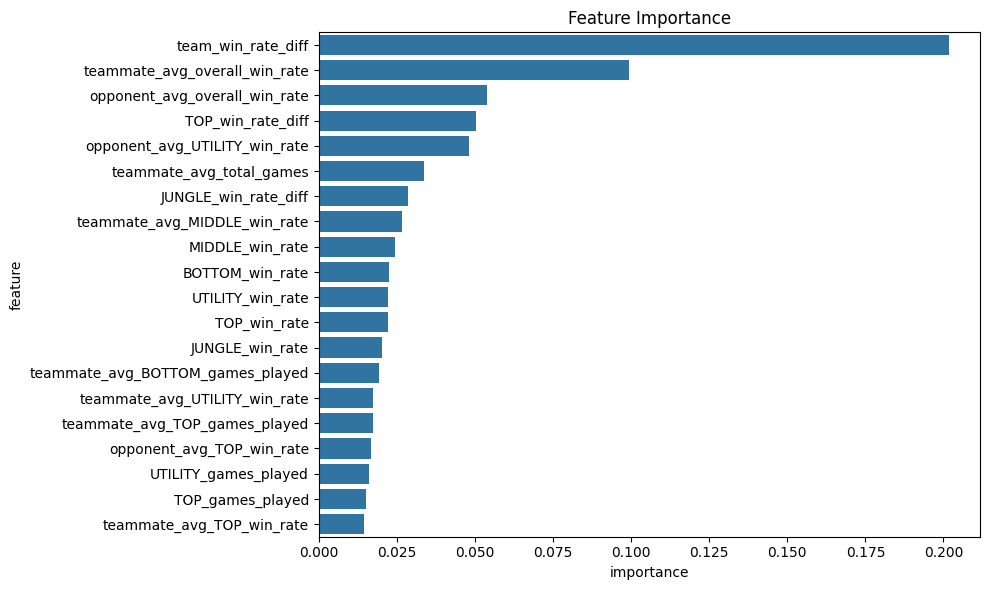

In [32]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Create pipeline with modified configuration
xgb_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()),
    ('xgb', xgb.XGBClassifier(
        random_state=42,
        objective='binary:logistic',
        scale_pos_weight=1,
        enable_categorical=False
    ))
])

# Simplified parameter grid
xgb_param_grid = {
    'xgb__n_estimators': [100, 200],
    'xgb__max_depth': [3, 4],
    'xgb__learning_rate': [0.01, 0.05],
    'xgb__min_child_weight': [5],
    'xgb__subsample': [0.7],
    'xgb__colsample_bytree': [0.7],
    'xgb__gamma': [0.1],
    'xgb__reg_alpha': [1],
    'xgb__reg_lambda': [2]
}

# Split data with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42, 
    stratify=y
)

# Set up cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform Grid Search
grid_search = GridSearchCV(
    estimator=xgb_pipeline,
    param_grid=xgb_param_grid,
    cv=cv,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

# Fit the model
print("Starting model training...")
grid_search.fit(X_train, y_train)

# Print results
print("\nBest parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get best model
best_model = grid_search.best_estimator_

# Evaluate on test set
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# Feature importance
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': best_model.named_steps['xgb'].feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance.head(20))
plt.title('Feature Importance')
plt.tight_layout()
plt.show()


Generating learning curves...


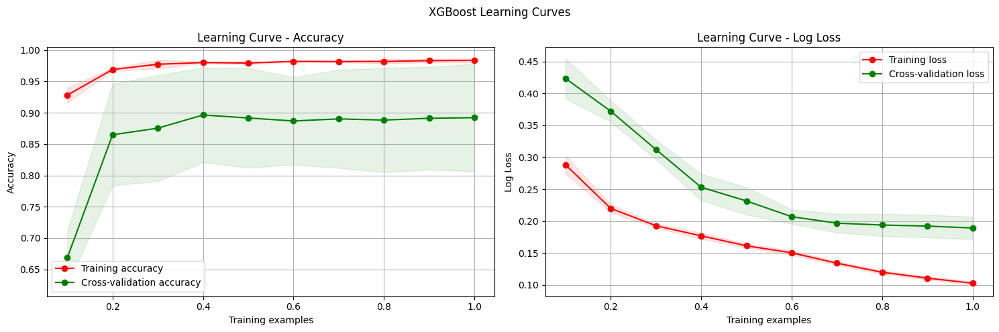


Final scores:
Training Accuracy: 0.9835 ± 0.0029
CV Accuracy: 0.8921 ± 0.0858
Training Loss: 0.1026 ± 0.0027
CV Loss: 0.1892 ± 0.0176
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.01, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=100, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.01, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=200, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.01, xgb__max_depth=4, xgb__min_child_weight=5, xgb__n_estimators=100, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total time=   0.0s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.05, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=100, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total ti

In [33]:
# Add this import
from sklearn.metrics import log_loss
from sklearn.base import clone
from sklearn.model_selection import learning_curve

# Add this function before the model training
def plot_learning_curves(estimator, X, y, title):
    """
    Plot both accuracy and log loss learning curves for training and validation sets.
    """
    train_sizes = np.linspace(0.1, 1.0, 10)
    
    # Get accuracy scores
    train_sizes_acc, train_scores_acc, test_scores_acc = learning_curve(
        estimator, X, y,
        train_sizes=train_sizes,
        cv=5,
        n_jobs=-1,
        scoring='accuracy'
    )
    
    # Calculate log loss manually
    train_scores_loss = []
    test_scores_loss = []
    
    for train_idx, valid_idx in StratifiedKFold(n_splits=5, shuffle=True, random_state=42).split(X, y):
        X_train_cv, X_valid_cv = X.iloc[train_idx], X.iloc[valid_idx]
        y_train_cv, y_valid_cv = y.iloc[train_idx], y.iloc[valid_idx]
        
        train_loss_fold = []
        valid_loss_fold = []
        
        for size in train_sizes:
            subset_size = int(len(X_train_cv) * size)
            X_subset = X_train_cv.iloc[:subset_size]
            y_subset = y_train_cv.iloc[:subset_size]
            
            model_clone = clone(estimator)
            model_clone.fit(X_subset, y_subset)
            
            train_proba = model_clone.predict_proba(X_subset)
            valid_proba = model_clone.predict_proba(X_valid_cv)
            
            train_loss = log_loss(y_subset, train_proba)
            valid_loss = log_loss(y_valid_cv, valid_proba)
            
            train_loss_fold.append(train_loss)
            valid_loss_fold.append(valid_loss)
        
        train_scores_loss.append(train_loss_fold)
        test_scores_loss.append(valid_loss_fold)
    
    train_scores_loss = np.array(train_scores_loss)
    test_scores_loss = np.array(test_scores_loss)
    
    # Calculate statistics
    train_mean_acc = np.mean(train_scores_acc, axis=1)
    train_std_acc = np.std(train_scores_acc, axis=1)
    test_mean_acc = np.mean(test_scores_acc, axis=1)
    test_std_acc = np.std(test_scores_acc, axis=1)
    
    train_mean_loss = np.mean(train_scores_loss, axis=0)
    train_std_loss = np.std(train_scores_loss, axis=0)
    test_mean_loss = np.mean(test_scores_loss, axis=0)
    test_std_loss = np.std(test_scores_loss, axis=0)
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot accuracy
    ax1.plot(train_sizes, train_mean_acc, 'o-', color='r', label='Training accuracy')
    ax1.fill_between(train_sizes, train_mean_acc - train_std_acc, 
                     train_mean_acc + train_std_acc, alpha=0.1, color='r')
    ax1.plot(train_sizes, test_mean_acc, 'o-', color='g', label='Cross-validation accuracy')
    ax1.fill_between(train_sizes, test_mean_acc - test_std_acc,
                     test_mean_acc + test_std_acc, alpha=0.1, color='g')
    ax1.set_xlabel('Training examples')
    ax1.set_ylabel('Accuracy')
    ax1.set_title('Learning Curve - Accuracy')
    ax1.legend(loc='best')
    ax1.grid(True)
    
    # Plot loss
    ax2.plot(train_sizes, train_mean_loss, 'o-', color='r', label='Training loss')
    ax2.fill_between(train_sizes, train_mean_loss - train_std_loss,
                     train_mean_loss + train_std_loss, alpha=0.1, color='r')
    ax2.plot(train_sizes, test_mean_loss, 'o-', color='g', label='Cross-validation loss')
    ax2.fill_between(train_sizes, test_mean_loss - test_std_loss,
                     test_mean_loss + test_std_loss, alpha=0.1, color='g')
    ax2.set_xlabel('Training examples')
    ax2.set_ylabel('Log Loss')
    ax2.set_title('Learning Curve - Log Loss')
    ax2.legend(loc='best')
    ax2.grid(True)
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    
    # Print final scores
    print(f"\nFinal scores:")
    print(f"Training Accuracy: {train_mean_acc[-1]:.4f} ± {train_std_acc[-1]:.4f}")
    print(f"CV Accuracy: {test_mean_acc[-1]:.4f} ± {test_std_acc[-1]:.4f}")
    print(f"Training Loss: {train_mean_loss[-1]:.4f} ± {train_std_loss[-1]:.4f}")
    print(f"CV Loss: {test_mean_loss[-1]:.4f} ± {test_std_loss[-1]:.4f}")

# Add this after getting the best model
print("\nGenerating learning curves...")
plot_learning_curves(best_model, X, y, "XGBoost Learning Curves")

Starting model training...
Fitting 5 folds for each of 8 candidates, totalling 40 fits

Best parameters: {'xgb__colsample_bytree': 0.7, 'xgb__gamma': 0.1, 'xgb__learning_rate': 0.05, 'xgb__max_depth': 4, 'xgb__min_child_weight': 5, 'xgb__n_estimators': 200, 'xgb__reg_alpha': 1, 'xgb__reg_lambda': 2, 'xgb__subsample': 0.7}
Best cross-validation score: 0.9754360502580512

Generating learning curves...


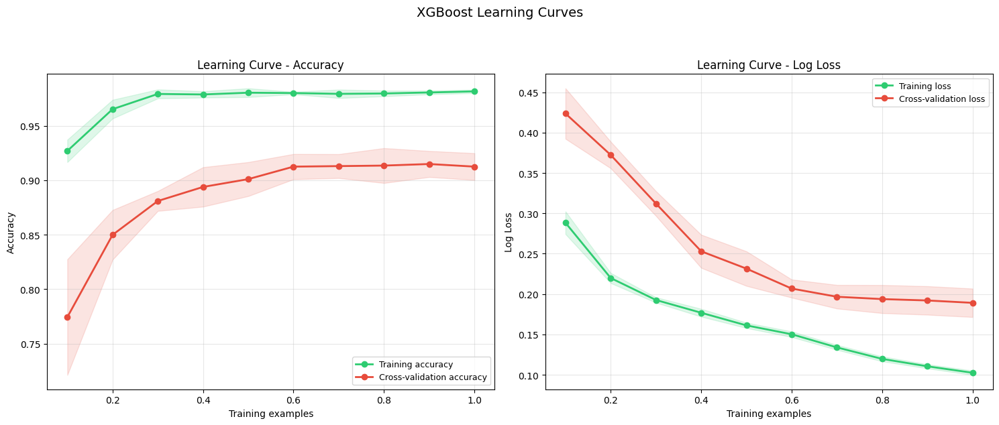


Final Scores:
--------------------------------------------------
Training Accuracy:     0.9816 ± 0.0016
CV Accuracy:          0.9125 ± 0.0123
Training Loss:        0.1026 ± 0.0027
CV Loss:             0.1892 ± 0.0176
Overfitting Gap:      0.0691


OSError: 'seaborn' is not a valid package style, path of style file, URL of style file, or library style name (library styles are listed in `style.available`)

[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.01, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=100, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.01, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=200, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total time=   0.2s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.05, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=100, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.05, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=100, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.05, xgb__max_depth=3, xgb__min_child_weight=5, xgb_

In [35]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, log_loss
from sklearn.base import clone
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

def plot_learning_curves(estimator, X, y, title):
    """
    Plot both accuracy and log loss learning curves for training and validation sets.
    Adapted to work with sklearn Pipeline.
    """
    train_sizes = np.linspace(0.1, 1.0, 10)
    
    # Get accuracy scores
    train_sizes_acc, train_scores_acc, test_scores_acc = learning_curve(
        estimator, X, y,
        train_sizes=train_sizes,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        n_jobs=-1,
        scoring='accuracy'
    )
    
    # Calculate log loss manually
    train_scores_loss = []
    test_scores_loss = []
    
    for train_idx, valid_idx in StratifiedKFold(n_splits=5, shuffle=True, random_state=42).split(X, y):
        X_train_cv, X_valid_cv = X.iloc[train_idx], X.iloc[valid_idx]
        y_train_cv, y_valid_cv = y.iloc[train_idx], y.iloc[valid_idx]
        
        train_loss_fold = []
        valid_loss_fold = []
        
        for size in train_sizes:
            subset_size = int(len(X_train_cv) * size)
            X_subset = X_train_cv.iloc[:subset_size]
            y_subset = y_train_cv.iloc[:subset_size]
            
            model_clone = clone(estimator)
            model_clone.fit(X_subset, y_subset)
            
            train_proba = model_clone.predict_proba(X_subset)
            valid_proba = model_clone.predict_proba(X_valid_cv)
            
            train_loss = log_loss(y_subset, train_proba)
            valid_loss = log_loss(y_valid_cv, valid_proba)
            
            train_loss_fold.append(train_loss)
            valid_loss_fold.append(valid_loss)
        
        train_scores_loss.append(train_loss_fold)
        test_scores_loss.append(valid_loss_fold)
    
    train_scores_loss = np.array(train_scores_loss)
    test_scores_loss = np.array(test_scores_loss)
    
    # Calculate statistics
    train_mean_acc = np.mean(train_scores_acc, axis=1)
    train_std_acc = np.std(train_scores_acc, axis=1)
    test_mean_acc = np.mean(test_scores_acc, axis=1)
    test_std_acc = np.std(test_scores_acc, axis=1)
    
    train_mean_loss = np.mean(train_scores_loss, axis=0)
    train_std_loss = np.std(train_scores_loss, axis=0)
    test_mean_loss = np.mean(test_scores_loss, axis=0)
    test_std_loss = np.std(test_scores_loss, axis=0)
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle(title, fontsize=14, y=1.05)
    
    # Plot accuracy
    ax1.plot(train_sizes, train_mean_acc, 'o-', color='#2ecc71', 
            label='Training accuracy', linewidth=2, markersize=6)
    ax1.fill_between(train_sizes, train_mean_acc - train_std_acc,
                    train_mean_acc + train_std_acc, alpha=0.15, color='#2ecc71')
    ax1.plot(train_sizes, test_mean_acc, 'o-', color='#e74c3c',
            label='Cross-validation accuracy', linewidth=2, markersize=6)
    ax1.fill_between(train_sizes, test_mean_acc - test_std_acc,
                    test_mean_acc + test_std_acc, alpha=0.15, color='#e74c3c')
    ax1.set_xlabel('Training examples', fontsize=10)
    ax1.set_ylabel('Accuracy', fontsize=10)
    ax1.set_title('Learning Curve - Accuracy', fontsize=12)
    ax1.legend(loc='lower right', fontsize=9)
    ax1.grid(True, alpha=0.3)
    
    # Plot loss
    ax2.plot(train_sizes, train_mean_loss, 'o-', color='#2ecc71',
            label='Training loss', linewidth=2, markersize=6)
    ax2.fill_between(train_sizes, train_mean_loss - train_std_loss,
                    train_mean_loss + train_std_loss, alpha=0.15, color='#2ecc71')
    ax2.plot(train_sizes, test_mean_loss, 'o-', color='#e74c3c',
            label='Cross-validation loss', linewidth=2, markersize=6)
    ax2.fill_between(train_sizes, test_mean_loss - test_std_loss,
                    test_mean_loss + test_std_loss, alpha=0.15, color='#e74c3c')
    ax2.set_xlabel('Training examples', fontsize=10)
    ax2.set_ylabel('Log Loss', fontsize=10)
    ax2.set_title('Learning Curve - Log Loss', fontsize=12)
    ax2.legend(loc='upper right', fontsize=9)
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print final scores with improved formatting
    print("\nFinal Scores:")
    print("-" * 50)
    print(f"Training Accuracy:     {train_mean_acc[-1]:.4f} ± {train_std_acc[-1]:.4f}")
    print(f"CV Accuracy:          {test_mean_acc[-1]:.4f} ± {test_std_acc[-1]:.4f}")
    print(f"Training Loss:        {train_mean_loss[-1]:.4f} ± {train_std_loss[-1]:.4f}")
    print(f"CV Loss:             {test_mean_loss[-1]:.4f} ± {test_std_loss[-1]:.4f}")
    print(f"Overfitting Gap:      {train_mean_acc[-1] - test_mean_acc[-1]:.4f}")
    
    # Calculate log loss manually
    train_scores_loss = []
    test_scores_loss = []
    
    for train_idx, valid_idx in StratifiedKFold(n_splits=5, shuffle=True, random_state=42).split(X, y):
        X_train_cv, X_valid_cv = X.iloc[train_idx], X.iloc[valid_idx]
        y_train_cv, y_valid_cv = y.iloc[train_idx], y.iloc[valid_idx]
        
        train_loss_fold = []
        valid_loss_fold = []
        
        for size in train_sizes:
            subset_size = int(len(X_train_cv) * size)
            X_subset = X_train_cv.iloc[:subset_size]
            y_subset = y_train_cv.iloc[:subset_size]
            
            model_clone = clone(estimator)
            model_clone.fit(X_subset, y_subset)
            
            train_proba = model_clone.predict_proba(X_subset)
            valid_proba = model_clone.predict_proba(X_valid_cv)
            
            train_loss = log_loss(y_subset, train_proba)
            valid_loss = log_loss(y_valid_cv, valid_proba)
            
            train_loss_fold.append(train_loss)
            valid_loss_fold.append(valid_loss)
        
        train_scores_loss.append(train_loss_fold)
        test_scores_loss.append(valid_loss_fold)
    
    train_scores_loss = np.array(train_scores_loss)
    test_scores_loss = np.array(test_scores_loss)
    
    # Calculate statistics
    train_mean_acc = np.mean(train_scores_acc, axis=1)
    train_std_acc = np.std(train_scores_acc, axis=1)
    test_mean_acc = np.mean(test_scores_acc, axis=1)
    test_std_acc = np.std(test_scores_acc, axis=1)
    
    train_mean_loss = np.mean(train_scores_loss, axis=0)
    train_std_loss = np.std(train_scores_loss, axis=0)
    test_mean_loss = np.mean(test_scores_loss, axis=0)
    test_std_loss = np.std(test_scores_loss, axis=0)
    
    # Create subplots with improved styling
    plt.style.use('seaborn')
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    fig.suptitle(title, fontsize=14, y=1.05)
    
    # Plot accuracy
    ax1.plot(train_sizes, train_mean_acc, 'o-', color='#2ecc71', 
            label='Training accuracy', linewidth=2, markersize=6)
    ax1.fill_between(train_sizes, train_mean_acc - train_std_acc,
                    train_mean_acc + train_std_acc, alpha=0.15, color='#2ecc71')
    ax1.plot(train_sizes, test_mean_acc, 'o-', color='#e74c3c',
            label='Cross-validation accuracy', linewidth=2, markersize=6)
    ax1.fill_between(train_sizes, test_mean_acc - test_std_acc,
                    test_mean_acc + test_std_acc, alpha=0.15, color='#e74c3c')
    ax1.set_xlabel('Training examples', fontsize=10)
    ax1.set_ylabel('Accuracy', fontsize=10)
    ax1.set_title('Learning Curve - Accuracy', fontsize=12)
    ax1.legend(loc='lower right', fontsize=9)
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Plot loss
    ax2.plot(train_sizes, train_mean_loss, 'o-', color='#2ecc71',
            label='Training loss', linewidth=2, markersize=6)
    ax2.fill_between(train_sizes, train_mean_loss - train_std_loss,
                    train_mean_loss + train_std_loss, alpha=0.15, color='#2ecc71')
    ax2.plot(train_sizes, test_mean_loss, 'o-', color='#e74c3c',
            label='Cross-validation loss', linewidth=2, markersize=6)
    ax2.fill_between(train_sizes, test_mean_loss - test_std_loss,
                    test_mean_loss + test_std_loss, alpha=0.15, color='#e74c3c')
    ax2.set_xlabel('Training examples', fontsize=10)
    ax2.set_ylabel('Log Loss', fontsize=10)
    ax2.set_title('Learning Curve - Log Loss', fontsize=12)
    ax2.legend(loc='upper right', fontsize=9)
    ax2.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    # Print final scores with improved formatting
    print("\nFinal Scores:")
    print("-" * 50)
    print(f"Training Accuracy:     {train_mean_acc[-1]:.4f} ± {train_std_acc[-1]:.4f}")
    print(f"CV Accuracy:          {test_mean_acc[-1]:.4f} ± {test_std_acc[-1]:.4f}")
    print(f"Training Loss:        {train_mean_loss[-1]:.4f} ± {train_std_loss[-1]:.4f}")
    print(f"CV Loss:             {test_mean_loss[-1]:.4f} ± {test_std_loss[-1]:.4f}")
    print(f"Overfitting Gap:      {train_mean_acc[-1] - test_mean_acc[-1]:.4f}")

# Create pipeline with modified configuration
xgb_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()),
    ('xgb', xgb.XGBClassifier(
        random_state=42,
        objective='binary:logistic',
        scale_pos_weight=1,
        enable_categorical=False
    ))
])

# Simplified parameter grid with better defaults for preventing overfitting
xgb_param_grid = {
    'xgb__n_estimators': [100, 200],
    'xgb__max_depth': [3, 4],
    'xgb__learning_rate': [0.01, 0.05],
    'xgb__min_child_weight': [5],
    'xgb__subsample': [0.7],
    'xgb__colsample_bytree': [0.7],
    'xgb__gamma': [0.1],
    'xgb__reg_alpha': [1],
    'xgb__reg_lambda': [2]
}

# Split data with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42, 
    stratify=y
)

# Set up cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform Grid Search
grid_search = GridSearchCV(
    estimator=xgb_pipeline,
    param_grid=xgb_param_grid,
    cv=cv,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

# Fit the model
print("Starting model training...")
grid_search.fit(X_train, y_train)

# Print results
print("\nBest parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get best model
best_model = grid_search.best_estimator_

# Generate learning curves
print("\nGenerating learning curves...")
plot_learning_curves(best_model, X, y, "XGBoost Learning Curves")

# Evaluate on test set
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# Feature importance
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': best_model.named_steps['xgb'].feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance.head(20))
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (roc_curve, auc, confusion_matrix, 
                           classification_report, accuracy_score)
from sklearn.model_selection import learning_curve
import seaborn as sns
from scipy import stats

def evaluate_model_comprehensive(model, X, y, X_test, y_test, title="Model Evaluation", figsize=(15, 10)):
    """
    Comprehensive model evaluation generating multiple metrics and visualizations.
    
    Parameters:
    -----------
    model : estimator object
        Trained model
    X : array-like
        Training features
    y : array-like
        Training labels
    X_test : array-like
        Test features
    y_test : array-like
        Test labels
    title : str
        Title for the plots
    figsize : tuple
        Figure size for the combined plots
    """
    # Make predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]
    
    # Calculate confidence interval for accuracy
    accuracy = accuracy_score(y_test, y_pred)
    n = len(y_test)
    confidence_interval = 1.96 * np.sqrt((accuracy * (1 - accuracy)) / n)
    
    # Calculate standard error
    std_error = np.sqrt((accuracy * (1 - accuracy)) / n)
    
    # Get learning curves
    train_sizes, train_scores, test_scores = learning_curve(
        model, X, y, 
        cv=5, 
        n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 10),
        scoring='accuracy'
    )
    
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)
    
    # Create figure with subplots
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 2)
    
    # 1. ROC Curve
    ax1 = fig.add_subplot(gs[0, 0])
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    ax1.plot(fpr, tpr, color='darkorange', lw=2, 
             label=f'ROC curve (AUC = {roc_auc:.2f})')
    ax1.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC Curve')
    ax1.legend(loc="lower right")
    ax1.grid(True, alpha=0.3)
    
    # 2. Learning Curves
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(train_sizes, train_mean, 'o-', color='#2ecc71',
             label='Training accuracy')
    ax2.fill_between(train_sizes, train_mean - train_std,
                     train_mean + train_std, alpha=0.15, color='#2ecc71')
    ax2.plot(train_sizes, test_mean, 'o-', color='#e74c3c',
             label='Cross-validation accuracy')
    ax2.fill_between(train_sizes, test_mean - test_std,
                     test_mean + test_std, alpha=0.15, color='#e74c3c')
    ax2.set_xlabel('Training examples')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Learning Curves')
    ax2.legend(loc='lower right')
    ax2.grid(True, alpha=0.3)
    
    # 3. Confusion Matrix
    ax3 = fig.add_subplot(gs[1, 0])
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax3)
    ax3.set_title('Confusion Matrix')
    ax3.set_ylabel('True Label')
    ax3.set_xlabel('Predicted Label')
    
    # 4. Metrics Text
    ax4 = fig.add_subplot(gs[1, 1])
    ax4.axis('off')
    
    # Calculate metrics
    classification_rep = classification_report(y_test, y_pred, output_dict=True)
    
    # Prepare metrics text
    metrics_text = f"""
    Model Performance Metrics:
    
    Accuracy: {accuracy:.4f} ± {confidence_interval:.4f}
    95% CI: [{accuracy-confidence_interval:.4f}, {accuracy+confidence_interval:.4f}]
    Standard Error: {std_error:.4f}
    Standard Deviation: {np.std(test_scores):.4f}
    
    Detailed Metrics:
    Precision (Weighted): {classification_rep['weighted avg']['precision']:.4f}
    Recall (Weighted): {classification_rep['weighted avg']['recall']:.4f}
    F1-Score (Weighted): {classification_rep['weighted avg']['f1-score']:.4f}
    
    ROC AUC Score: {roc_auc:.4f}
    
    Training-Validation Gap: {train_mean[-1] - test_mean[-1]:.4f}
    """
    
    ax4.text(0, 1, metrics_text, fontsize=10, va='top', ha='left', 
             bbox=dict(facecolor='white', alpha=0.8))
    
    plt.suptitle(title, y=1.02, fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Print detailed metrics
    print("\nDetailed Performance Metrics:")
    print("-" * 50)
    print(f"Mean Accuracy ± CI: {accuracy:.4f} ± {confidence_interval:.4f}")
    print(f"Standard Deviation: {np.std(test_scores):.4f}")
    print(f"Standard Error: {std_error:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    return {
        'accuracy': accuracy,
        'confidence_interval': confidence_interval,
        'std_dev': np.std(test_scores),
        'std_error': std_error,
        'roc_auc': roc_auc,
        'confusion_matrix': cm,
        'classification_report': classification_report(y_test, y_pred, output_dict=True)
    }


Generating comprehensive evaluation...


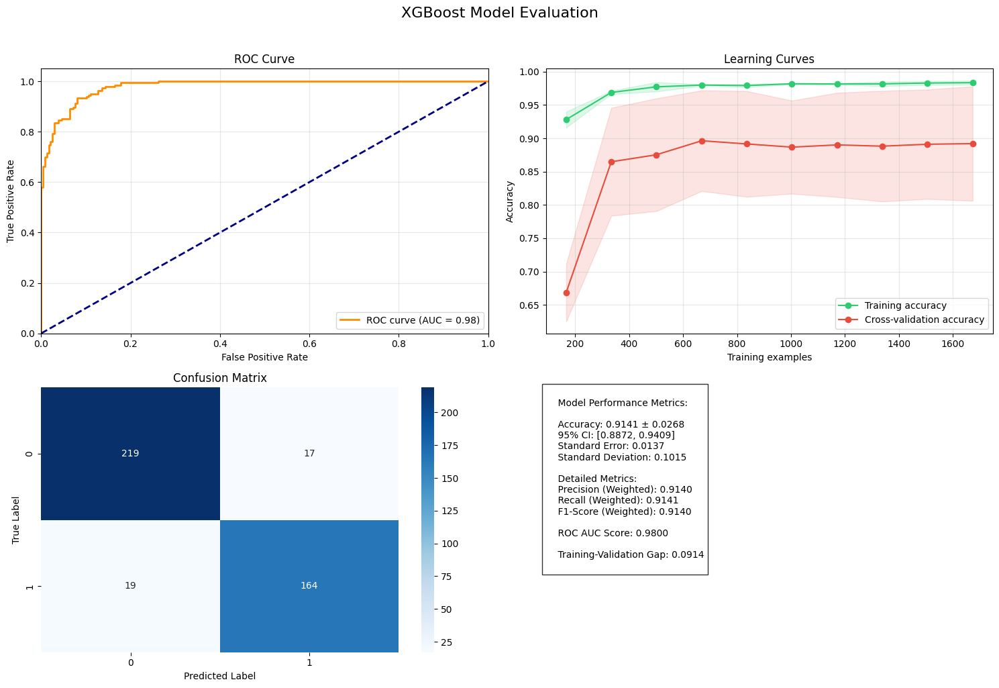


Detailed Performance Metrics:
--------------------------------------------------
Mean Accuracy ± CI: 0.9141 ± 0.0268
Standard Deviation: 0.1015
Standard Error: 0.0137

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       236
           1       0.91      0.90      0.90       183

    accuracy                           0.91       419
   macro avg       0.91      0.91      0.91       419
weighted avg       0.91      0.91      0.91       419

Accuracy with CI: 0.9141 ± 0.0268

Generating learning curves...


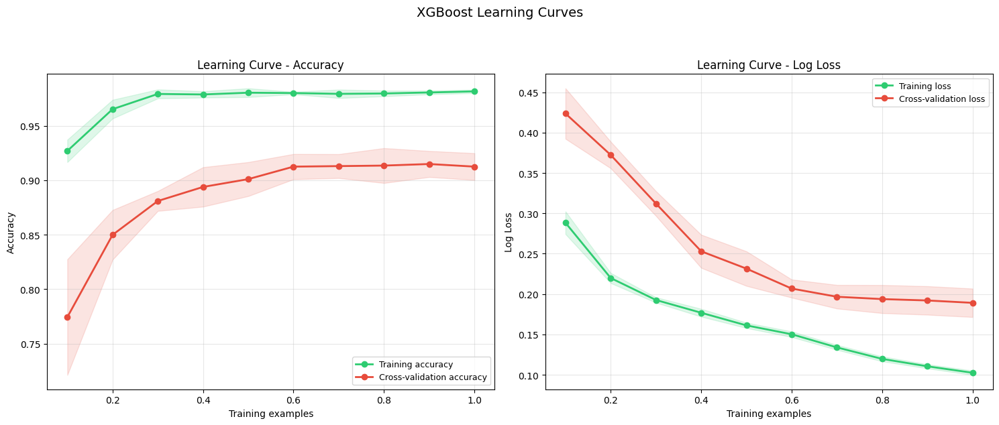


Final Scores:
--------------------------------------------------
Training Accuracy:     0.9816 ± 0.0016
CV Accuracy:          0.9125 ± 0.0123
Training Loss:        0.1026 ± 0.0027
CV Loss:             0.1892 ± 0.0176
Overfitting Gap:      0.0691


OSError: 'seaborn' is not a valid package style, path of style file, URL of style file, or library style name (library styles are listed in `style.available`)

In [38]:
# Your existing code...

# Get best model
best_model = grid_search.best_estimator_

# Add the comprehensive evaluation here
print("\nGenerating comprehensive evaluation...")
metrics = evaluate_model_comprehensive(
    model=best_model,
    X=X,
    y=y,
    X_test=X_test,
    y_test=y_test,
    title="XGBoost Model Evaluation"
)

# Print specific metrics if desired
print(f"Accuracy with CI: {metrics['accuracy']:.4f} ± {metrics['confidence_interval']:.4f}")

# Your existing evaluation code can continue here...
print("\nGenerating learning curves...")
plot_learning_curves(best_model, X, y, "XGBoost Learning Curves")

# Evaluate on test set
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

Starting model training...
Fitting 5 folds for each of 8 candidates, totalling 40 fits

Best parameters: {'xgb__colsample_bytree': 0.7, 'xgb__gamma': 0.1, 'xgb__learning_rate': 0.05, 'xgb__max_depth': 4, 'xgb__min_child_weight': 5, 'xgb__n_estimators': 200, 'xgb__reg_alpha': 1, 'xgb__reg_lambda': 2, 'xgb__subsample': 0.7}
Best cross-validation score: 0.9754360502580512

Generating comprehensive evaluation...


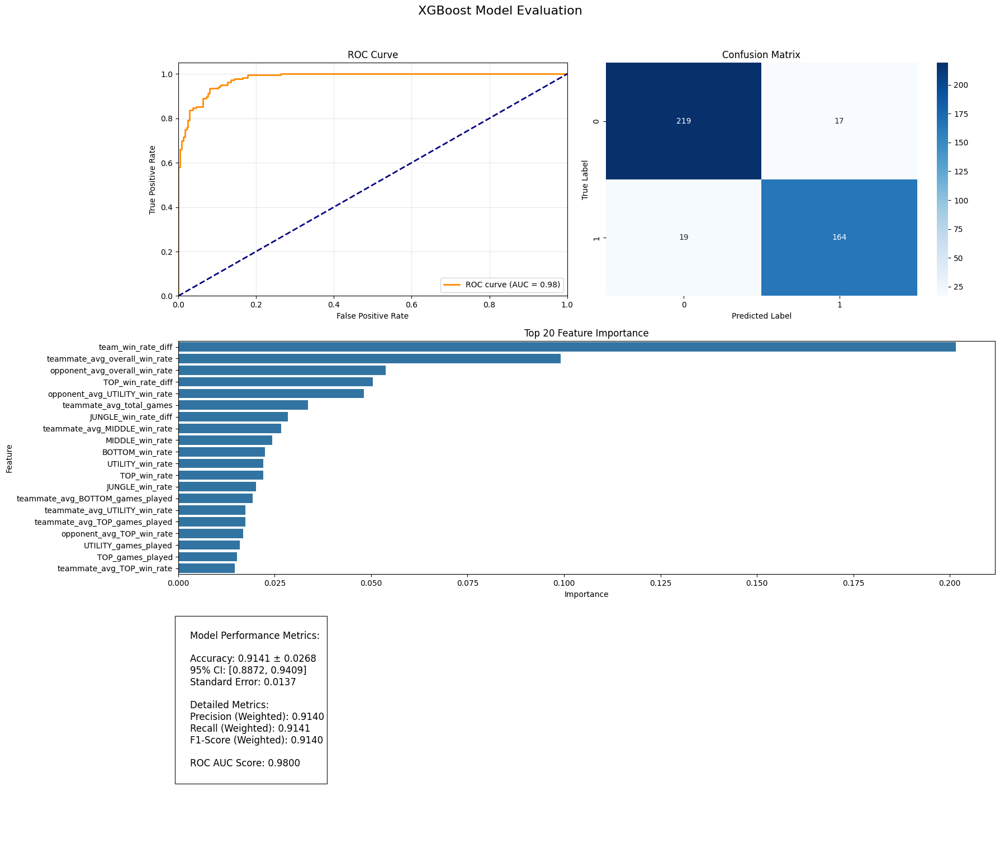


Generating learning curves...


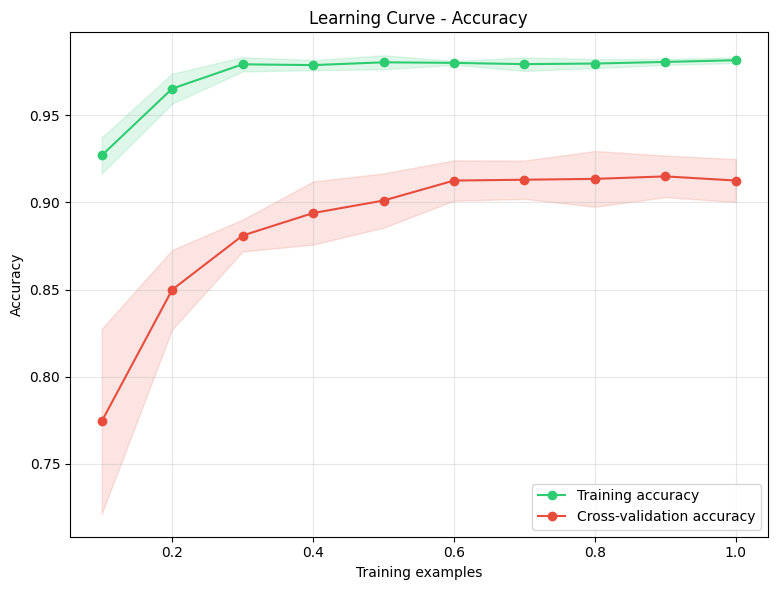


Final Scores:
--------------------------------------------------
Training Accuracy:     0.9816 ± 0.0016
CV Accuracy:          0.9125 ± 0.0123
Overfitting Gap:      0.0691


In [39]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import (roc_curve, auc, confusion_matrix, 
                           classification_report, accuracy_score)
from sklearn.base import clone
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import os

def plot_learning_curves(estimator, X, y, title, save_plots=True, output_dir='plots'):
    """Plot learning curves for model training and validation."""
    train_sizes = np.linspace(0.1, 1.0, 10)
    
    # Get accuracy scores
    train_sizes_acc, train_scores_acc, test_scores_acc = learning_curve(
        estimator, X, y,
        train_sizes=train_sizes,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        n_jobs=-1,
        scoring='accuracy'
    )
    
    # Calculate statistics
    train_mean_acc = np.mean(train_scores_acc, axis=1)
    train_std_acc = np.std(train_scores_acc, axis=1)
    test_mean_acc = np.mean(test_scores_acc, axis=1)
    test_std_acc = np.std(test_scores_acc, axis=1)
    
    # Create plot
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    plt.plot(train_sizes, train_mean_acc, 'o-', color='#2ecc71', label='Training accuracy')
    plt.fill_between(train_sizes, train_mean_acc - train_std_acc,
                    train_mean_acc + train_std_acc, alpha=0.15, color='#2ecc71')
    plt.plot(train_sizes, test_mean_acc, 'o-', color='#e74c3c', label='Cross-validation accuracy')
    plt.fill_between(train_sizes, test_mean_acc - test_std_acc,
                    test_mean_acc + test_std_acc, alpha=0.15, color='#e74c3c')
    plt.xlabel('Training examples')
    plt.ylabel('Accuracy')
    plt.title('Learning Curve - Accuracy')
    plt.legend(loc='lower right')
    plt.grid(True, alpha=0.3)
    
    if save_plots:
        plt.savefig(f'{output_dir}/learning_curves.png', dpi=300, bbox_inches='tight')
    
    plt.tight_layout()
    plt.show()
    
    # Print scores
    print("\nFinal Scores:")
    print("-" * 50)
    print(f"Training Accuracy:     {train_mean_acc[-1]:.4f} ± {train_std_acc[-1]:.4f}")
    print(f"CV Accuracy:          {test_mean_acc[-1]:.4f} ± {test_std_acc[-1]:.4f}")
    print(f"Overfitting Gap:      {train_mean_acc[-1] - test_mean_acc[-1]:.4f}")

def evaluate_model_comprehensive(model, X, y, X_test, y_test, title="Model Evaluation", 
                               figsize=(15, 10), save_plots=True, output_dir='plots'):
    """Comprehensive model evaluation with all metrics and visualizations."""
    
    if save_plots:
        os.makedirs(output_dir, exist_ok=True)
    
    # Make predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    n = len(y_test)
    confidence_interval = 1.96 * np.sqrt((accuracy * (1 - accuracy)) / n)
    std_error = np.sqrt((accuracy * (1 - accuracy)) / n)
    
    # Create main figure
    fig = plt.figure(figsize=(18, 15))
    gs = fig.add_gridspec(3, 2)
    
    # 1. ROC Curve
    ax1 = fig.add_subplot(gs[0, 0])
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    ax1.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    ax1.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC Curve')
    ax1.legend(loc="lower right")
    ax1.grid(True, alpha=0.3)
    
    # 2. Confusion Matrix
    ax2 = fig.add_subplot(gs[0, 1])
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax2)
    ax2.set_title('Confusion Matrix')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    # 3. Feature Importance
    ax3 = fig.add_subplot(gs[1, :])
    
    if hasattr(model, 'named_steps') and 'xgb' in model.named_steps:
        importance = model.named_steps['xgb'].feature_importances_
    else:
        importance = model.feature_importances_
    
    feature_importance = pd.DataFrame({
        'feature': X.columns,
        'importance': importance
    })
    feature_importance = feature_importance.sort_values('importance', ascending=False)
    
    sns.barplot(x='importance', y='feature', data=feature_importance.head(20), ax=ax3)
    ax3.set_title('Top 20 Feature Importance')
    ax3.set_xlabel('Importance')
    ax3.set_ylabel('Feature')
    
    # 4. Metrics Text
    ax4 = fig.add_subplot(gs[2, :])
    ax4.axis('off')
    
    classification_rep = classification_report(y_test, y_pred, output_dict=True)
    
    metrics_text = f"""
    Model Performance Metrics:
    
    Accuracy: {accuracy:.4f} ± {confidence_interval:.4f}
    95% CI: [{accuracy-confidence_interval:.4f}, {accuracy+confidence_interval:.4f}]
    Standard Error: {std_error:.4f}
    
    Detailed Metrics:
    Precision (Weighted): {classification_rep['weighted avg']['precision']:.4f}
    Recall (Weighted): {classification_rep['weighted avg']['recall']:.4f}
    F1-Score (Weighted): {classification_rep['weighted avg']['f1-score']:.4f}
    
    ROC AUC Score: {roc_auc:.4f}
    """
    
    ax4.text(0, 1, metrics_text, fontsize=12, va='top', ha='left',
             bbox=dict(facecolor='white', alpha=0.8))
    
    plt.suptitle(title, y=1.02, fontsize=16)
    plt.tight_layout()
    
    if save_plots:
        # Save individual plots
        plt.savefig(f'{output_dir}/complete_evaluation.png', dpi=300, bbox_inches='tight')
        feature_importance.to_csv(f'{output_dir}/feature_importance.csv', index=False)
        
        # Save metrics to text file
        with open(f'{output_dir}/model_metrics.txt', 'w') as f:
            f.write("Model Evaluation Results\n")
            f.write("=" * 50 + "\n\n")
            f.write("Performance Metrics:\n")
            f.write("-" * 30 + "\n")
            f.write(f"Accuracy: {accuracy:.4f} ± {confidence_interval:.4f}\n")
            f.write(f"95% CI: [{accuracy-confidence_interval:.4f}, {accuracy+confidence_interval:.4f}]\n")
            f.write(f"Standard Error: {std_error:.4f}\n")
            f.write(f"ROC AUC Score: {roc_auc:.4f}\n\n")
            f.write("Classification Report:\n")
            f.write("-" * 30 + "\n")
            f.write(classification_report(y_test, y_pred))
            f.write("\nTop 20 Most Important Features:\n")
            f.write("-" * 30 + "\n")
            for idx, row in feature_importance.head(20).iterrows():
                f.write(f"{row['feature']}: {row['importance']:.4f}\n")
    
    plt.show()
    
    return {
        'accuracy': accuracy,
        'confidence_interval': confidence_interval,
        'std_error': std_error,
        'roc_auc': roc_auc,
        'confusion_matrix': cm,
        'feature_importance': feature_importance,
        'classification_report': classification_report(y_test, y_pred, output_dict=True)
    }

# Create pipeline
xgb_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()),
    ('xgb', xgb.XGBClassifier(
        random_state=42,
        objective='binary:logistic',
        scale_pos_weight=1,
        enable_categorical=False
    ))
])

# Parameter grid
xgb_param_grid = {
    'xgb__n_estimators': [100, 200],
    'xgb__max_depth': [3, 4],
    'xgb__learning_rate': [0.01, 0.05],
    'xgb__min_child_weight': [5],
    'xgb__subsample': [0.7],
    'xgb__colsample_bytree': [0.7],
    'xgb__gamma': [0.1],
    'xgb__reg_alpha': [1],
    'xgb__reg_lambda': [2]
}

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42, 
    stratify=y
)

# Set up cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform Grid Search
grid_search = GridSearchCV(
    estimator=xgb_pipeline,
    param_grid=xgb_param_grid,
    cv=cv,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

# Fit the model
print("Starting model training...")
grid_search.fit(X_train, y_train)

# Get best model
best_model = grid_search.best_estimator_

# Print results
print("\nBest parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Generate comprehensive evaluation
print("\nGenerating comprehensive evaluation...")
metrics = evaluate_model_comprehensive(
    model=best_model,
    X=X,
    y=y,
    X_test=X_test,
    y_test=y_test,
    title="XGBoost Model Evaluation",
    save_plots=True,
    output_dir='model_evaluation'
)

# Generate learning curves
print("\nGenerating learning curves...")
plot_learning_curves(best_model, X, y, "XGBoost Learning Curves", save_plots=True, output_dir='model_evaluation')

## Comparative Model - Attempt to reduce overfitting ## 


Training Original XGBoost...
Fitting 5 folds for each of 8 candidates, totalling 40 fits

Best parameters for Original XGBoost: {'xgb__colsample_bytree': 0.7, 'xgb__gamma': 0.1, 'xgb__learning_rate': 0.05, 'xgb__max_depth': 4, 'xgb__min_child_weight': 5, 'xgb__n_estimators': 200, 'xgb__reg_alpha': 1, 'xgb__reg_lambda': 2, 'xgb__subsample': 0.7}
Best cross-validation score: 0.9754360502580512

Generating comprehensive evaluation for Original XGBoost...


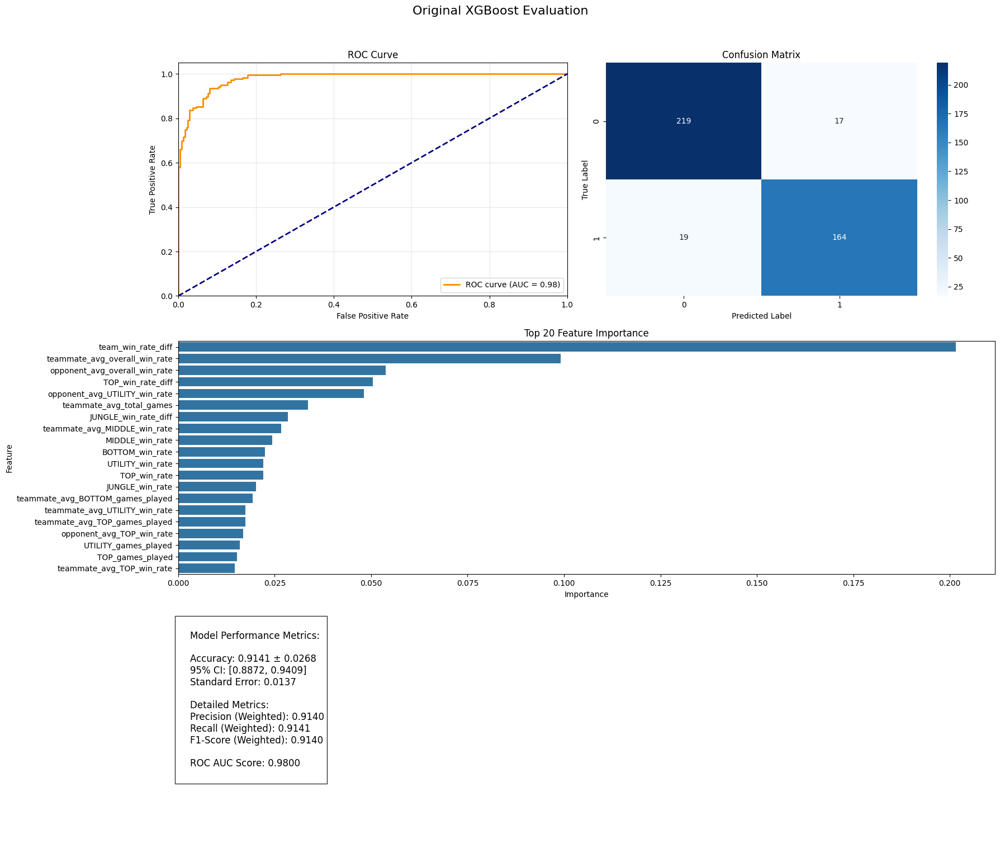


Generating learning curves for Original XGBoost...


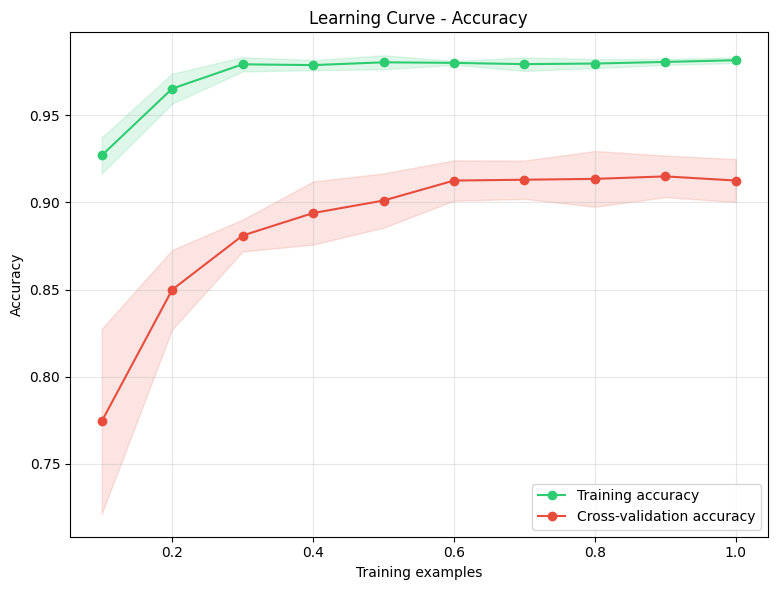


Final Scores:
--------------------------------------------------
Training Accuracy:     0.9816 ± 0.0016
CV Accuracy:          0.9125 ± 0.0123
Overfitting Gap:      0.0691

Training Conservative XGBoost...
Fitting 5 folds for each of 64 candidates, totalling 320 fits

Best parameters for Conservative XGBoost: {'xgb__colsample_bytree': 0.6, 'xgb__gamma': 0.2, 'xgb__learning_rate': 0.01, 'xgb__max_depth': 3, 'xgb__min_child_weight': 7, 'xgb__n_estimators': 100, 'xgb__reg_alpha': 2, 'xgb__reg_lambda': 5, 'xgb__subsample': 0.6}
Best cross-validation score: 0.9542537825389555

Generating comprehensive evaluation for Conservative XGBoost...


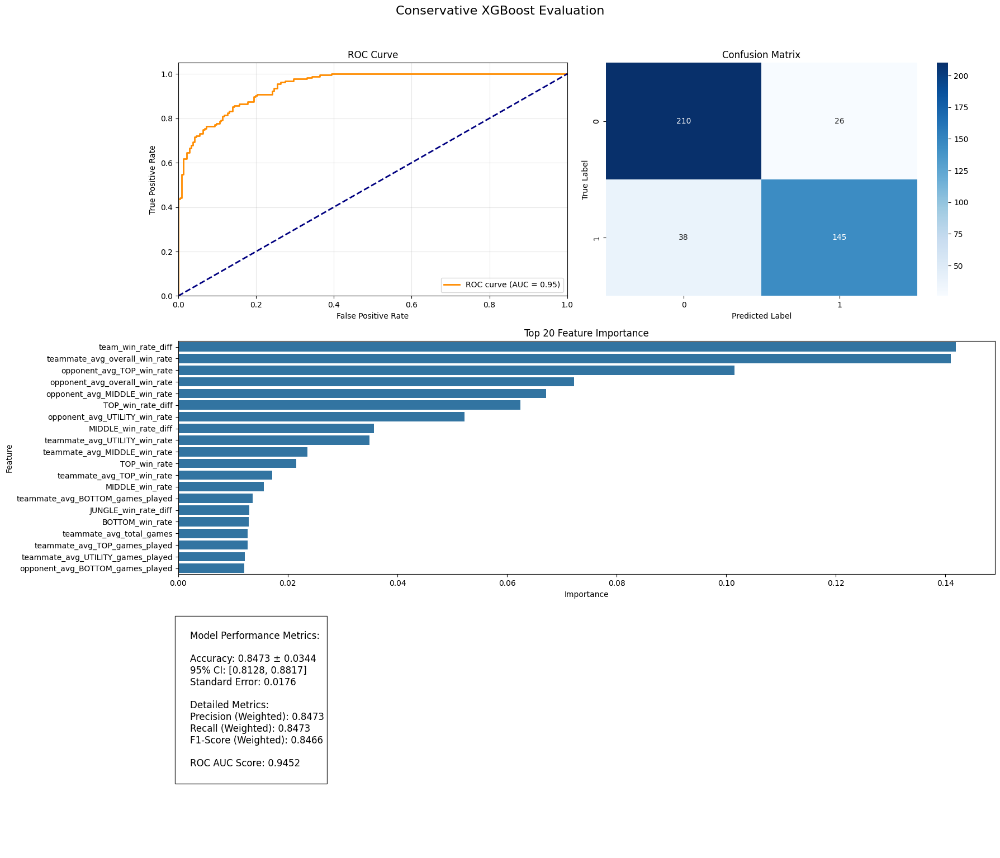


Generating learning curves for Conservative XGBoost...


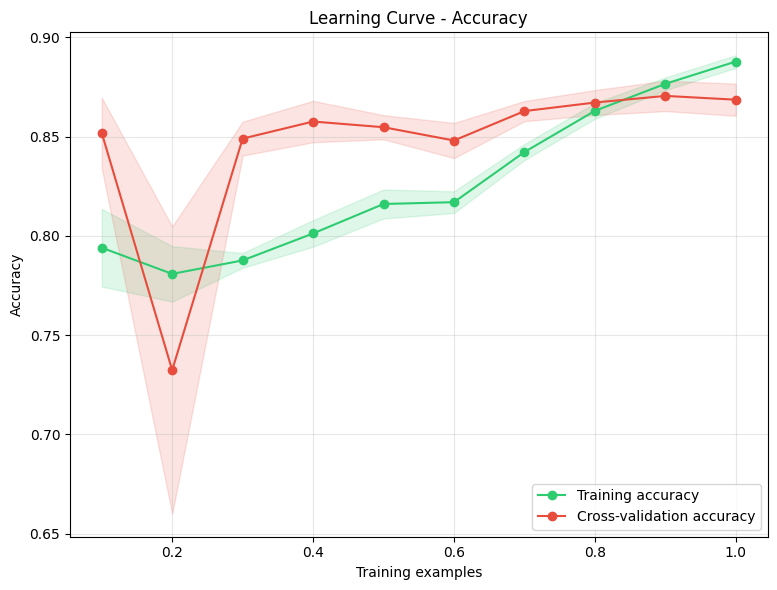


Final Scores:
--------------------------------------------------
Training Accuracy:     0.8877 ± 0.0032
CV Accuracy:          0.8685 ± 0.0081
Overfitting Gap:      0.0192

Model Comparison:
--------------------------------------------------
Original Model Accuracy: 0.9141 ± 0.0268
Conservative Model Accuracy: 0.8473 ± 0.0344

Original Model ROC AUC: 0.9800
Conservative Model ROC AUC: 0.9452
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.01, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=100, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.01, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=200, xgb__reg_alpha=1, xgb__reg_lambda=2, xgb__subsample=0.7; total time=   0.1s
[CV] END xgb__colsample_bytree=0.7, xgb__gamma=0.1, xgb__learning_rate=0.05, xgb__max_depth=3, xgb__min_child_weight=5, xgb__n_estimators=100, xgb__reg_alpha=1, xgb__r

In [40]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import (roc_curve, auc, confusion_matrix, 
                           classification_report, accuracy_score)
from sklearn.base import clone
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import os

def plot_learning_curves(estimator, X, y, title, save_plots=True, output_dir='plots'):
    """Plot learning curves for model training and validation."""
    train_sizes = np.linspace(0.1, 1.0, 10)
    
    # Get accuracy scores
    train_sizes_acc, train_scores_acc, test_scores_acc = learning_curve(
        estimator, X, y,
        train_sizes=train_sizes,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        n_jobs=-1,
        scoring='accuracy'
    )
    
    # Calculate statistics
    train_mean_acc = np.mean(train_scores_acc, axis=1)
    train_std_acc = np.std(train_scores_acc, axis=1)
    test_mean_acc = np.mean(test_scores_acc, axis=1)
    test_std_acc = np.std(test_scores_acc, axis=1)
    
    # Create plot
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 2, 1)
    plt.plot(train_sizes, train_mean_acc, 'o-', color='#2ecc71', label='Training accuracy')
    plt.fill_between(train_sizes, train_mean_acc - train_std_acc,
                    train_mean_acc + train_std_acc, alpha=0.15, color='#2ecc71')
    plt.plot(train_sizes, test_mean_acc, 'o-', color='#e74c3c', label='Cross-validation accuracy')
    plt.fill_between(train_sizes, test_mean_acc - test_std_acc,
                    test_mean_acc + test_std_acc, alpha=0.15, color='#e74c3c')
    plt.xlabel('Training examples')
    plt.ylabel('Accuracy')
    plt.title('Learning Curve - Accuracy')
    plt.legend(loc='lower right')
    plt.grid(True, alpha=0.3)
    
    if save_plots:
        plt.savefig(f'{output_dir}/learning_curves.png', dpi=300, bbox_inches='tight')
    
    plt.tight_layout()
    plt.show()
    
    # Print scores
    print("\nFinal Scores:")
    print("-" * 50)
    print(f"Training Accuracy:     {train_mean_acc[-1]:.4f} ± {train_std_acc[-1]:.4f}")
    print(f"CV Accuracy:          {test_mean_acc[-1]:.4f} ± {test_std_acc[-1]:.4f}")
    print(f"Overfitting Gap:      {train_mean_acc[-1] - test_mean_acc[-1]:.4f}")

def evaluate_model_comprehensive(model, X, y, X_test, y_test, title="Model Evaluation", 
                               figsize=(15, 10), save_plots=True, output_dir='plots'):
    """Comprehensive model evaluation with all metrics and visualizations."""
    if save_plots:
        os.makedirs(output_dir, exist_ok=True)
    
    # Make predictions
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    n = len(y_test)
    confidence_interval = 1.96 * np.sqrt((accuracy * (1 - accuracy)) / n)
    std_error = np.sqrt((accuracy * (1 - accuracy)) / n)
    
    # Create main figure
    fig = plt.figure(figsize=(18, 15))
    gs = fig.add_gridspec(3, 2)
    
    # 1. ROC Curve
    ax1 = fig.add_subplot(gs[0, 0])
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    ax1.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    ax1.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC Curve')
    ax1.legend(loc="lower right")
    ax1.grid(True, alpha=0.3)
    
    # 2. Confusion Matrix
    ax2 = fig.add_subplot(gs[0, 1])
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax2)
    ax2.set_title('Confusion Matrix')
    ax2.set_ylabel('True Label')
    ax2.set_xlabel('Predicted Label')
    
    # 3. Feature Importance
    ax3 = fig.add_subplot(gs[1, :])
    if hasattr(model, 'named_steps') and 'xgb' in model.named_steps:
        importance = model.named_steps['xgb'].feature_importances_
    else:
        importance = model.feature_importances_
    
    feature_importance = pd.DataFrame({
        'feature': X.columns,
        'importance': importance
    })
    feature_importance = feature_importance.sort_values('importance', ascending=False)
    
    sns.barplot(x='importance', y='feature', data=feature_importance.head(20), ax=ax3)
    ax3.set_title('Top 20 Feature Importance')
    ax3.set_xlabel('Importance')
    ax3.set_ylabel('Feature')
    
    # 4. Metrics Text
    ax4 = fig.add_subplot(gs[2, :])
    ax4.axis('off')
    
    classification_rep = classification_report(y_test, y_pred, output_dict=True)
    
    metrics_text = f"""
    Model Performance Metrics:
    
    Accuracy: {accuracy:.4f} ± {confidence_interval:.4f}
    95% CI: [{accuracy-confidence_interval:.4f}, {accuracy+confidence_interval:.4f}]
    Standard Error: {std_error:.4f}
    
    Detailed Metrics:
    Precision (Weighted): {classification_rep['weighted avg']['precision']:.4f}
    Recall (Weighted): {classification_rep['weighted avg']['recall']:.4f}
    F1-Score (Weighted): {classification_rep['weighted avg']['f1-score']:.4f}
    
    ROC AUC Score: {roc_auc:.4f}
    """
    
    ax4.text(0, 1, metrics_text, fontsize=12, va='top', ha='left',
             bbox=dict(facecolor='white', alpha=0.8))
    
    plt.suptitle(title, y=1.02, fontsize=16)
    plt.tight_layout()
    
    if save_plots:
        plt.savefig(f'{output_dir}/complete_evaluation.png', dpi=300, bbox_inches='tight')
        feature_importance.to_csv(f'{output_dir}/feature_importance.csv', index=False)
        
        with open(f'{output_dir}/model_metrics.txt', 'w') as f:
            f.write("Model Evaluation Results\n")
            f.write("=" * 50 + "\n\n")
            f.write("Performance Metrics:\n")
            f.write("-" * 30 + "\n")
            f.write(f"Accuracy: {accuracy:.4f} ± {confidence_interval:.4f}\n")
            f.write(f"95% CI: [{accuracy-confidence_interval:.4f}, {accuracy+confidence_interval:.4f}]\n")
            f.write(f"Standard Error: {std_error:.4f}\n")
            f.write(f"ROC AUC Score: {roc_auc:.4f}\n\n")
            f.write("Classification Report:\n")
            f.write("-" * 30 + "\n")
            f.write(classification_report(y_test, y_pred))
            f.write("\nTop 20 Most Important Features:\n")
            f.write("-" * 30 + "\n")
            for idx, row in feature_importance.head(20).iterrows():
                f.write(f"{row['feature']}: {row['importance']:.4f}\n")
    
    plt.show()
    
    return {
        'accuracy': accuracy,
        'confidence_interval': confidence_interval,
        'std_error': std_error,
        'roc_auc': roc_auc,
        'confusion_matrix': cm,
        'feature_importance': feature_importance,
        'classification_report': classification_report(y_test, y_pred, output_dict=True)
    }

def train_and_evaluate_model(X, y, pipeline, param_grid, model_name="Model"):
    """Train and evaluate a model with given parameters."""
    # Split data
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.2, 
        random_state=42, 
        stratify=y
    )
    
    # Set up cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    # Perform Grid Search
    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grid,
        cv=cv,
        scoring='roc_auc',
        n_jobs=-1,
        verbose=2,
        return_train_score=True
    )
    
    # Fit the model
    print(f"\nTraining {model_name}...")
    grid_search.fit(X_train, y_train)
    
    # Get best model
    best_model = grid_search.best_estimator_
    
    # Print results
    print(f"\nBest parameters for {model_name}:", grid_search.best_params_)
    print(f"Best cross-validation score:", grid_search.best_score_)
    
    # Generate comprehensive evaluation
    print(f"\nGenerating comprehensive evaluation for {model_name}...")
    metrics = evaluate_model_comprehensive(
        model=best_model,
        X=X,
        y=y,
        X_test=X_test,
        y_test=y_test,
        title=f"{model_name} Evaluation",
        save_plots=True,
        output_dir=f'{model_name.lower().replace(" ", "_")}_evaluation'
    )
    
    # Generate learning curves
    print(f"\nGenerating learning curves for {model_name}...")
    plot_learning_curves(
        best_model, 
        X, y, 
        f"{model_name} Learning Curves", 
        save_plots=True, 
        output_dir=f'{model_name.lower().replace(" ", "_")}_evaluation'
    )
    
    return best_model, metrics

# Define original model pipeline and parameters
original_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()),
    ('xgb', xgb.XGBClassifier(
        random_state=42,
        objective='binary:logistic',
        scale_pos_weight=1,
        enable_categorical=False
    ))
])

original_param_grid = {
    'xgb__n_estimators': [100, 200],
    'xgb__max_depth': [3, 4],
    'xgb__learning_rate': [0.01, 0.05],
    'xgb__min_child_weight': [5],
    'xgb__subsample': [0.7],
    'xgb__colsample_bytree': [0.7],
    'xgb__gamma': [0.1],
    'xgb__reg_alpha': [1],
    'xgb__reg_lambda': [2]
}

# Define conservative model pipeline and parameters
conservative_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler()),
    ('xgb', xgb.XGBClassifier(
        random_state=42,
        objective='binary:logistic',
        scale_pos_weight=1,
        enable_categorical=False
    ))
])

conservative_param_grid = {
    'xgb__n_estimators': [50, 100],
    'xgb__max_depth': [2, 3],
    'xgb__learning_rate': [0.01],
    'xgb__min_child_weight': [7, 10],
    'xgb__subsample': [0.6],
    'xgb__colsample_bytree': [0.6],
    'xgb__gamma': [0.2, 0.3],
    'xgb__reg_alpha': [2, 5],
    'xgb__reg_lambda': [5, 10]
}

# Train and evaluate both models
original_model, original_metrics = train_and_evaluate_model(
    X, y, 
    original_pipeline, 
    original_param_grid, 
    "Original XGBoost"
)

conservative_model, conservative_metrics = train_and_evaluate_model(
    X, y, 
    conservative_pipeline, 
    conservative_param_grid, 
    "Conservative XGBoost"
)

# Compare models
print("\nModel Comparison:")
print("-" * 50)
print(f"Original Model Accuracy: {original_metrics['accuracy']:.4f} ± {original_metrics['confidence_interval']:.4f}")
print(f"Conservative Model Accuracy: {conservative_metrics['accuracy']:.4f} ± {conservative_metrics['confidence_interval']:.4f}")
print(f"\nOriginal Model ROC AUC: {original_metrics['roc_auc']:.4f}")
print(f"Conservative Model ROC AUC: {conservative_metrics['roc_auc']:.4f}")


Training Conservative XGBoost model...
Fitting 5 folds for each of 64 candidates, totalling 320 fits
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

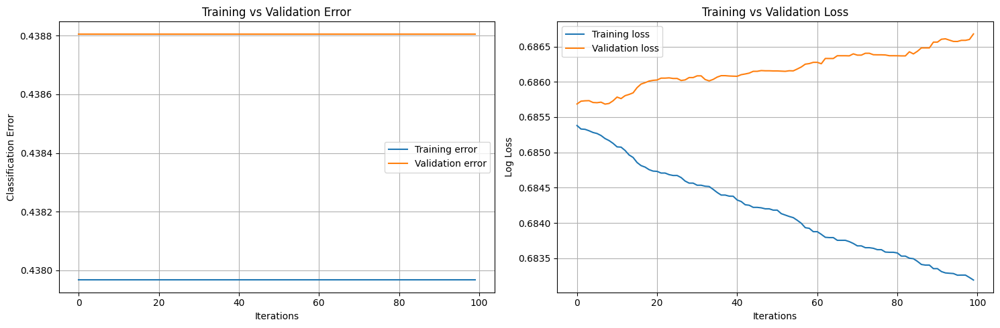


Test Set Metrics:
Accuracy: 0.5632458233890215
ROC AUC: 0.47606974159488746

Classification Report:
              precision    recall  f1-score   support

           0       0.56      1.00      0.72       236
           1       0.00      0.00      0.00       183

    accuracy                           0.56       419
   macro avg       0.28      0.50      0.36       419
weighted avg       0.32      0.56      0.41       419



/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/devinpathiraja/anaconda3/envs/CAB420/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

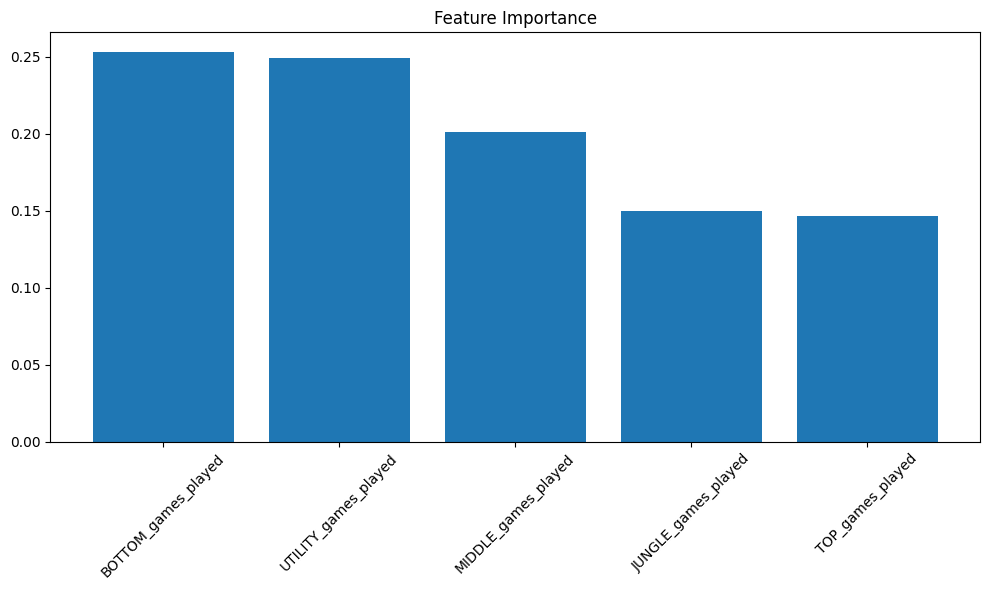

In [20]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
import matplotlib.pyplot as plt

# Split data
feature_cols = [
    'TOP_games_played', 
    'JUNGLE_games_played', 
    'MIDDLE_games_played', 
    'BOTTOM_games_played', 
    'UTILITY_games_played'
]

X = final_statistics_50[feature_cols]
y = (final_statistics_50['overall_win_rate'] > final_statistics_50['overall_win_rate'].median()).astype(int)

# Initial train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Create evaluation set for tracking metrics
X_train_model, X_val, y_train_model, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42, stratify=y_train
)

# Preprocess the data first
imputer = SimpleImputer(strategy='median')
scaler = StandardScaler()

# Transform all datasets
X_train_model_processed = scaler.fit_transform(imputer.fit_transform(X_train_model))
X_val_processed = scaler.transform(imputer.transform(X_val))
X_test_processed = scaler.transform(imputer.transform(X_test))

# Create XGBoost classifier
xgb_classifier = xgb.XGBClassifier(
    random_state=42,
    objective='binary:logistic',
    scale_pos_weight=1,
    enable_categorical=False,
    eval_metric=['error', 'logloss']
)

# Conservative parameters
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [2, 3],
    'learning_rate': [0.01],
    'min_child_weight': [7, 10],
    'subsample': [0.6],
    'colsample_bytree': [0.6],
    'gamma': [0.2, 0.3],
    'reg_alpha': [2, 5],
    'reg_lambda': [5, 10]
}

# Set up cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform Grid Search
grid_search = GridSearchCV(
    estimator=xgb_classifier,
    param_grid=param_grid,
    cv=cv,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

# Create evaluation set
eval_set = [(X_train_model_processed, y_train_model),
            (X_val_processed, y_val)]

# Fit the model
print("\nTraining Conservative XGBoost model...")
grid_search.fit(X_train_model_processed, y_train_model,
                eval_set=eval_set)

# Get best model
best_model = grid_search.best_estimator_

# Print results
print("\nBest parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get evaluation results
results = best_model.evals_result()

# Plot training metrics
plt.figure(figsize=(15, 5))

# Plot validation error
plt.subplot(1, 2, 1)
plt.plot(results['validation_0']['error'], label='Training error')
plt.plot(results['validation_1']['error'], label='Validation error')
plt.xlabel('Iterations')
plt.ylabel('Classification Error')
plt.title('Training vs Validation Error')
plt.legend()
plt.grid(True)

# Plot validation loss
plt.subplot(1, 2, 2)
plt.plot(results['validation_0']['logloss'], label='Training loss')
plt.plot(results['validation_1']['logloss'], label='Validation loss')
plt.xlabel('Iterations')
plt.ylabel('Log Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Make predictions on test set
y_pred = best_model.predict(X_test_processed)
y_prob = best_model.predict_proba(X_test_processed)[:, 1]

# Calculate and print final metrics
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score

print("\nTest Set Metrics:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_prob))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Feature importance plot
feature_importance = pd.DataFrame({
    'feature': feature_cols,
    'importance': best_model.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.bar(feature_importance['feature'], feature_importance['importance'])
plt.xticks(rotation=45)
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

## LightGBM ##

Training LightGBM model...
Fitting 5 folds for each of 64 candidates, totalling 320 fits
[LightGBM] [Info] Number of positive: 586, number of negative: 752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7509
[LightGBM] [Info] Number of data points in the train set: 1338, number of used features: 40
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437967 -> initscore=-0.249417
[LightGBM] [Info] Start training from score -0.249417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

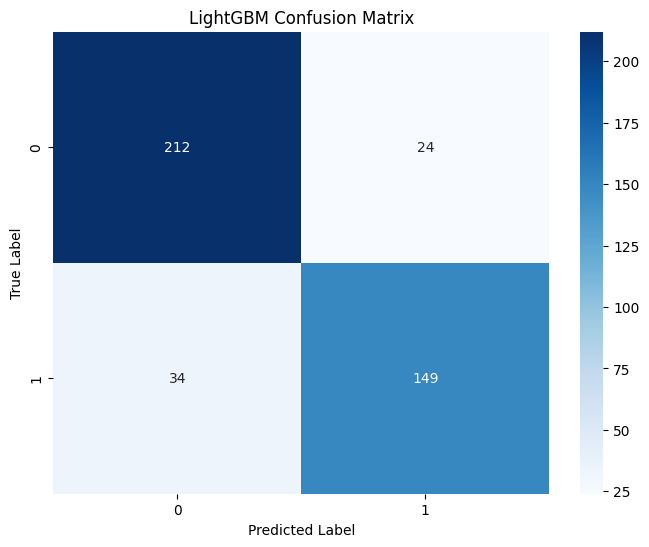

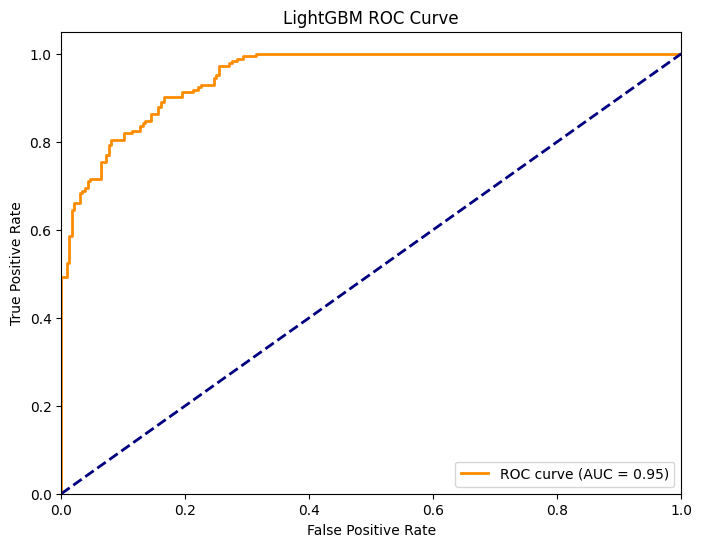

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

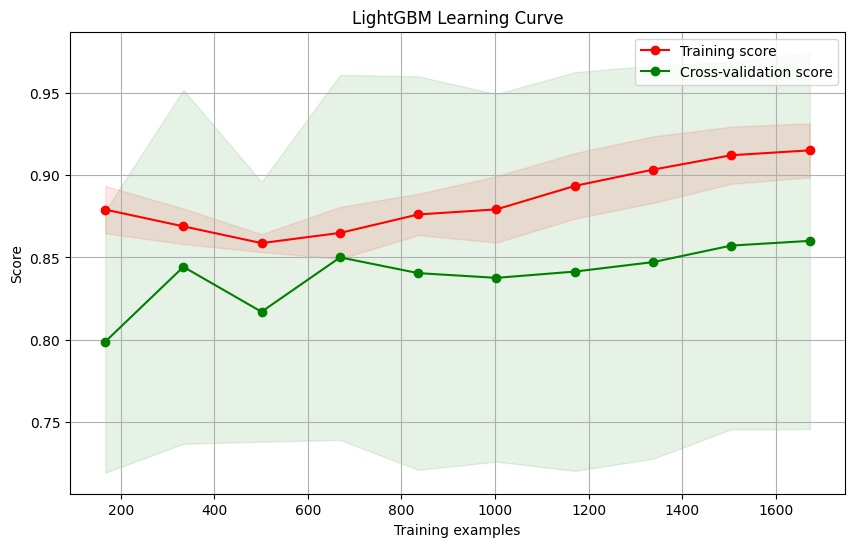


Final scores:
Training Score: 0.9150 ± 0.0164
CV Score: 0.8600 ± 0.1142
[LightGBM] [Info] Number of positive: 732, number of negative: 941
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7091
[LightGBM] [Info] Number of data points in the train set: 1673, number of used features: 40
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437537 -> initscore=-0.251163
[LightGBM] [Info] Start training from score -0.251163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

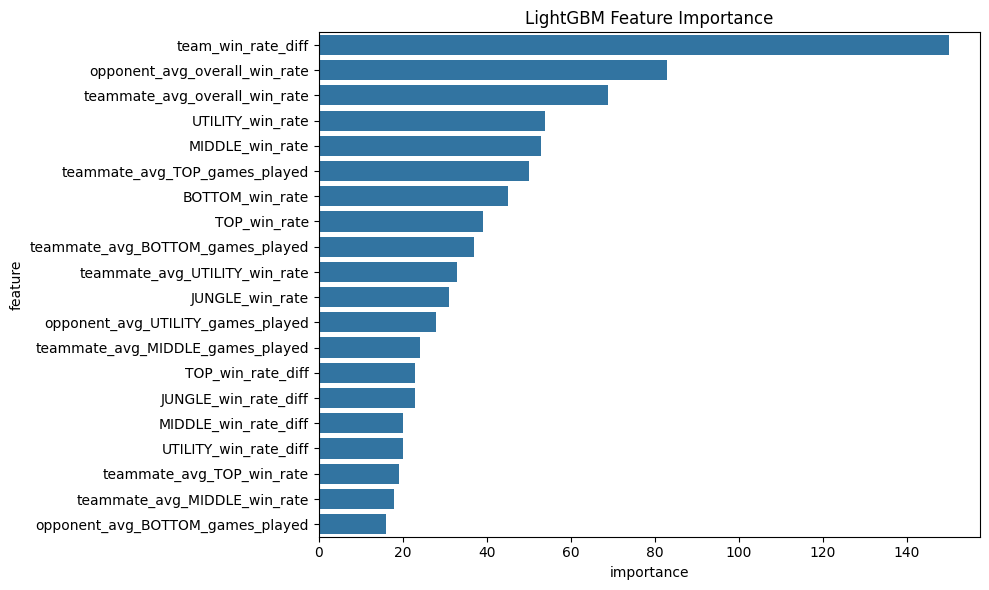

In [36]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb
from scipy.stats import t

# Create pipeline
lgb_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('lgb', lgb.LGBMClassifier(random_state=42))
])

# Define parameter grid with focus on preventing overfitting
lgb_param_grid = {
    'lgb__n_estimators': [100],
    'lgb__max_depth': [3, 4],
    'lgb__learning_rate': [0.01],
    'lgb__num_leaves': [8, 16],  # Should be smaller than 2^max_depth
    'lgb__min_child_samples': [20],  # Minimum number of data needed in a leaf
    'lgb__subsample': [0.6, 0.7],  # Sample ratio of training instance
    'lgb__colsample_bytree': [0.6, 0.7],  # Feature fraction
    'lgb__reg_alpha': [1, 2],  # L1 regularization
    'lgb__reg_lambda': [1, 2],  # L2 regularization
    'lgb__min_split_gain': [0.1]  # Minimal gain to perform split
}

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Perform Grid Search
print("Training LightGBM model...")
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(
    lgb_pipeline, 
    lgb_param_grid, 
    cv=cv, 
    scoring='roc_auc', 
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)

# Print results
print("\nBest parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get best model
best_model = grid_search.best_estimator_

# Evaluate on test set
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('LightGBM Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('LightGBM ROC Curve')
plt.legend(loc="lower right")
plt.show()

# Plot learning curve
def plot_learning_curve(estimator, X, y, title):
    train_sizes = np.linspace(0.1, 1.0, 10)
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y,
        train_sizes=train_sizes,
        cv=5,
        n_jobs=-1,
        scoring='accuracy'
    )
    
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, 'o-', color='r', label='Training score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='r')
    plt.plot(train_sizes, test_mean, 'o-', color='g', label='Cross-validation score')
    plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='g')
    
    plt.xlabel('Training examples')
    plt.ylabel('Score')
    plt.title(title)
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
    
    print(f"\nFinal scores:")
    print(f"Training Score: {train_mean[-1]:.4f} ± {train_std[-1]:.4f}")
    print(f"CV Score: {test_mean[-1]:.4f} ± {test_std[-1]:.4f}")

# Plot learning curve
plot_learning_curve(best_model, X, y, "LightGBM Learning Curve")

# Calculate model statistics
scores = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')
mean_accuracy = np.mean(scores)
std_dev = np.std(scores)
std_error = std_dev / np.sqrt(len(scores))
ci = t.interval(0.95, len(scores)-1, loc=mean_accuracy, scale=std_error)

print("\nModel Statistics:")
print(f"Mean Accuracy ± 95% CI: {mean_accuracy:.4f} ± {(ci[1] - mean_accuracy):.4f}")
print(f"Standard Deviation: {std_dev:.4f}")
print(f"Standard Error: {std_error:.4f}")

# Feature importance
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': best_model.named_steps['lgb'].feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance.head(20))
plt.title('LightGBM Feature Importance')
plt.tight_layout()
plt.show()

Training LightGBM model...
Fitting 5 folds for each of 64 candidates, totalling 320 fits
[LightGBM] [Info] Number of positive: 586, number of negative: 752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8857
[LightGBM] [Info] Number of data points in the train set: 1338, number of used features: 56
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437967 -> initscore=-0.249417
[LightGBM] [Info] Start training from score -0.249417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

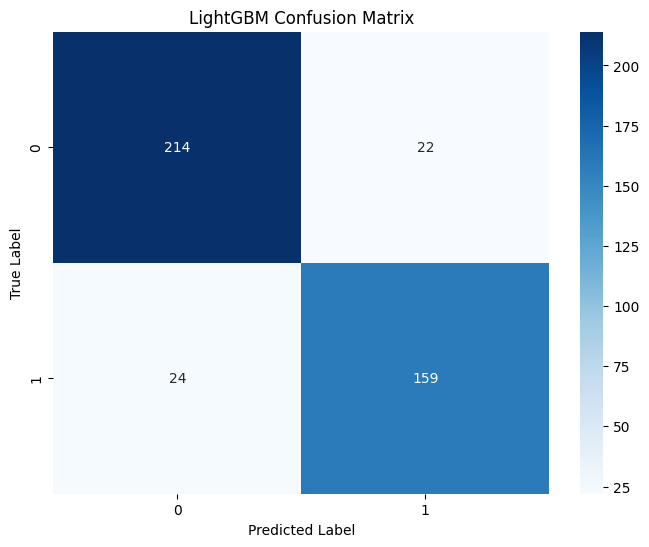

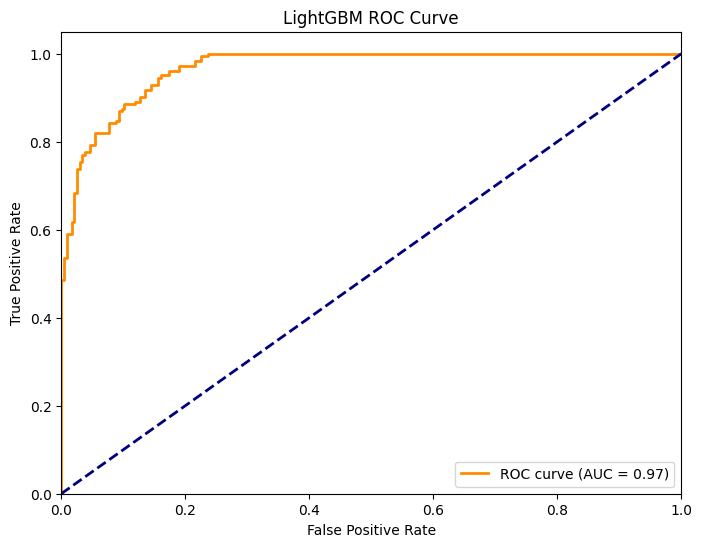

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

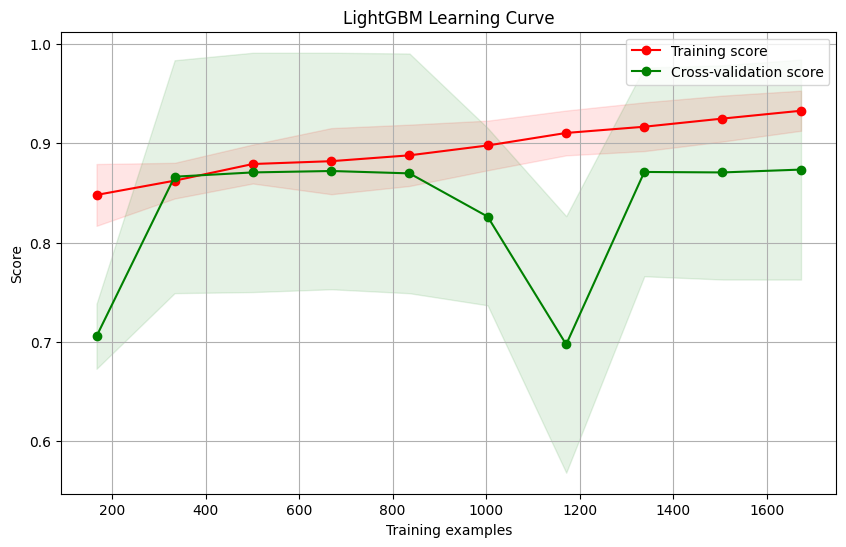


Final scores:
Training Score: 0.9327 ± 0.0202
CV Score: 0.8734 ± 0.1108

Model Statistics:
Mean Accuracy ± 95% CI: 0.8734 ± 0.1375
Standard Deviation: 0.1108
Standard Error: 0.0495


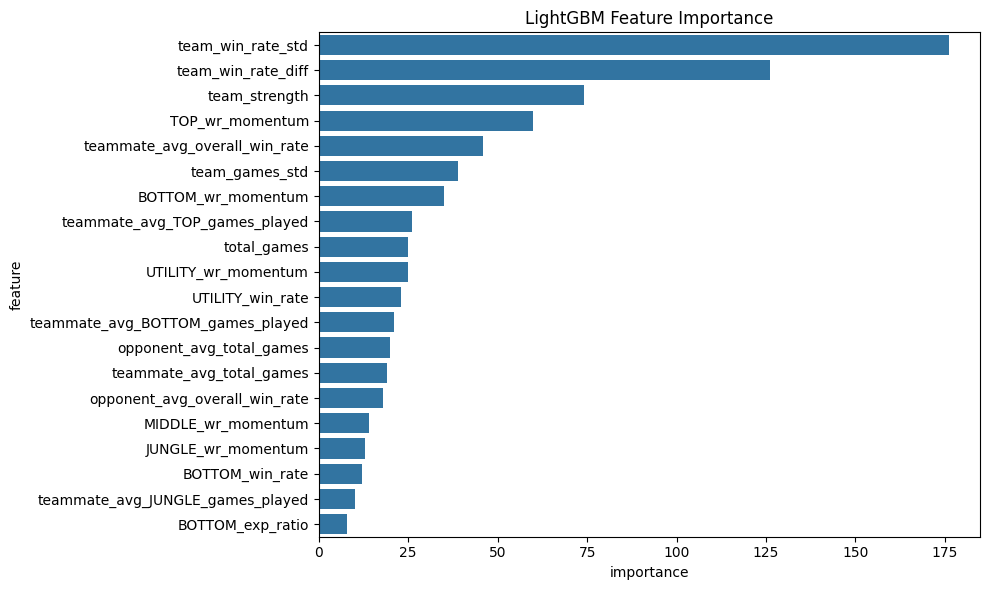

In [54]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb
from scipy.stats import t

# Check for NaN or infinite values
def clean_data(X):
    # Replace infinite values with NaN
    X.replace([np.inf, -np.inf], np.nan, inplace=True)
    # Impute NaN values
    X.fillna(X.mean(), inplace=True)  # or use another strategy
    return X

# Clean the data
X = clean_data(X)

# Create pipeline
lgb_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('lgb', lgb.LGBMClassifier(random_state=42))
])

# Define parameter grid
lgb_param_grid = {
    'lgb__n_estimators': [100],
    'lgb__max_depth': [3, 4],
    'lgb__learning_rate': [0.01],
    'lgb__num_leaves': [8, 16],
    'lgb__min_child_samples': [20],
    'lgb__subsample': [0.6, 0.7],
    'lgb__colsample_bytree': [0.6, 0.7],
    'lgb__reg_alpha': [1, 2],
    'lgb__reg_lambda': [1, 2],
    'lgb__min_split_gain': [0.1]
}

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Perform Grid Search
print("Training LightGBM model...")
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(
    lgb_pipeline, 
    lgb_param_grid, 
    cv=cv, 
    scoring='roc_auc', 
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)

# Print results
print("\nBest parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Get best model
best_model = grid_search.best_estimator_

# Evaluate on test set
y_pred = best_model.predict(X_test)
y_prob = best_model.predict_proba(X_test)[:, 1]

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('LightGBM Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('LightGBM ROC Curve')
plt.legend(loc="lower right")
plt.show()

# Plot learning curve
def plot_learning_curve(estimator, X, y, title):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y,
        train_sizes=np.linspace(0.1, 1.0, 10),
        cv=5,
        n_jobs=-1,
        scoring='accuracy'
    )
    
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, 'o-', color='r', label='Training score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='r')
    plt.plot(train_sizes, test_mean, 'o-', color='g', label='Cross-validation score')
    plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='g')
    
    plt.xlabel('Training examples')
    plt.ylabel('Score')
    plt.title(title)
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
    
    print(f"\nFinal scores:")
    print(f"Training Score: {train_mean[-1]:.4f} ± {train_std[-1]:.4f}")
    print(f"CV Score: {test_mean[-1]:.4f} ± {test_std[-1]:.4f}")

# Plot learning curve
plot_learning_curve(best_model, X, y, "LightGBM Learning Curve")

# Calculate model statistics
scores = cross_val_score(best_model, X, y, cv=5, scoring='accuracy')
mean_accuracy = np.mean(scores)
std_dev = np.std(scores)
std_error = std_dev / np.sqrt(len(scores))
ci = t.interval(0.95, len(scores)-1, loc=mean_accuracy, scale=std_error)

print("\nModel Statistics:")
print(f"Mean Accuracy ± 95% CI: {mean_accuracy:.4f} ± {(ci[1] - mean_accuracy):.4f}")
print(f"Standard Deviation: {std_dev:.4f}")
print(f"Standard Error: {std_error:.4f}")

# Feature importance
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': best_model.named_steps['lgb'].feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance.head(20))
plt.title('LightGBM Feature Importance')
plt.tight_layout()
plt.show()


Fitting 5 folds for each of 64 candidates, totalling 320 fits


/var/folders/p3/z0_c98cn62g6lp9kn_7bm4t40000gn/T/ipykernel_71881/1451936394.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.replace([np.inf, -np.inf], np.nan, inplace=True)
/var/folders/p3/z0_c98cn62g6lp9kn_7bm4t40000gn/T/ipykernel_71881/1451936394.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace=True)


[LightGBM] [Info] Number of positive: 586, number of negative: 752
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 108
[LightGBM] [Info] Number of data points in the train set: 1338, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.437967 -> initscore=-0.249417
[LightGBM] [Info] Start training from score -0.249417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

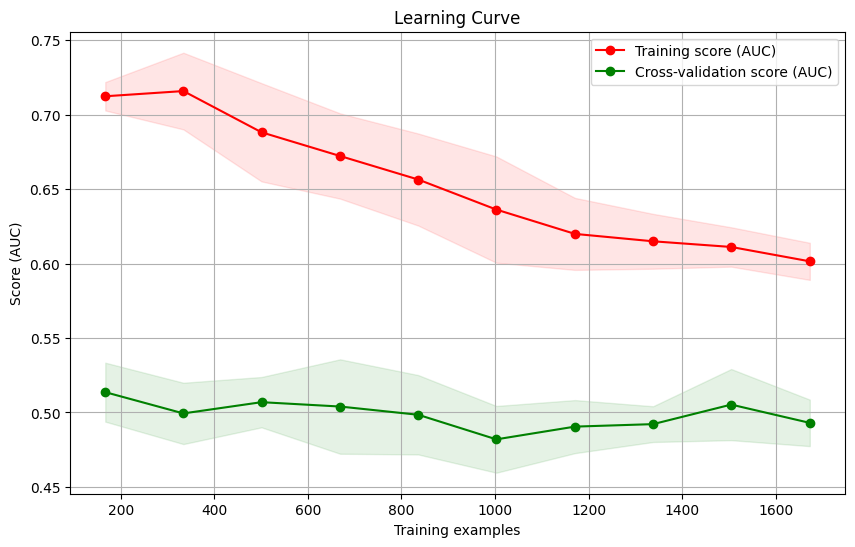

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

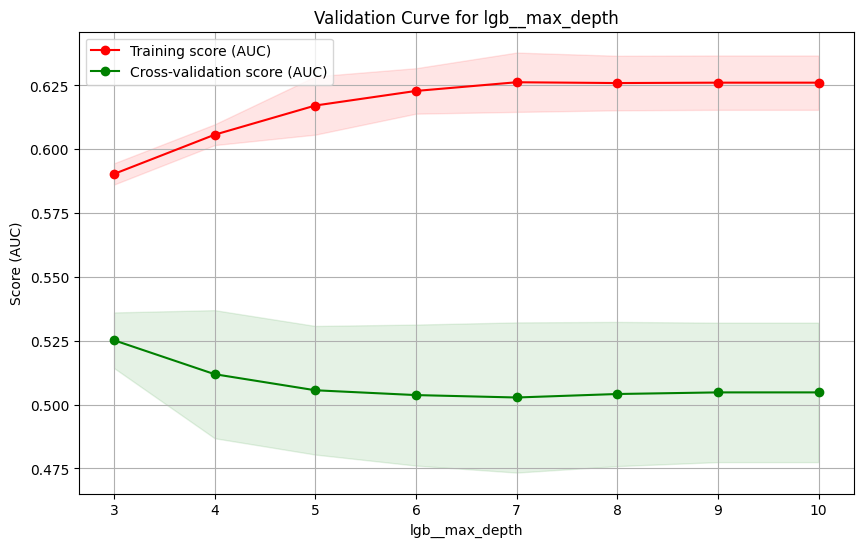

In [19]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, learning_curve, validation_curve
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb
from scipy.stats import t

# Function to clean data
def clean_data(X):
    X.replace([np.inf, -np.inf], np.nan, inplace=True)
    X.fillna(X.mean(), inplace=True)
    return X

# Clean the data
X = clean_data(X)

# Create pipeline
lgb_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('lgb', lgb.LGBMClassifier(random_state=42))
])

# Define parameter grid
lgb_param_grid = {
    'lgb__n_estimators': [100],
    'lgb__max_depth': [3, 4],
    'lgb__learning_rate': [0.01],
    'lgb__num_leaves': [8, 16],
    'lgb__min_child_samples': [20],
    'lgb__subsample': [0.6, 0.7],
    'lgb__colsample_bytree': [0.6, 0.7],
    'lgb__reg_alpha': [1, 2],
    'lgb__reg_lambda': [1, 2],
    'lgb__min_split_gain': [0.1]
}

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Perform Grid Search
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(
    lgb_pipeline, 
    lgb_param_grid, 
    cv=cv, 
    scoring='roc_auc', 
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)

# Get best model
best_model = grid_search.best_estimator_

# Plot Learning Curves
def plot_learning_curve(estimator, X, y):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y,
        train_sizes=np.linspace(0.1, 1.0, 10),
        cv=5,
        n_jobs=-1,
        scoring='roc_auc'
    )
    
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, 'o-', color='r', label='Training score (AUC)')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='r')
    plt.plot(train_sizes, test_mean, 'o-', color='g', label='Cross-validation score (AUC)')
    plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='g')
    
    plt.xlabel('Training examples')
    plt.ylabel('Score (AUC)')
    plt.title('Learning Curve')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

# Call learning curve plot
plot_learning_curve(best_model, X, y)

# Plot Validation Curve
def plot_validation_curve(estimator, X, y, param_name, param_range):
    train_scores, test_scores = validation_curve(
        estimator, X, y,
        param_name=param_name,
        param_range=param_range,
        cv=5,
        scoring='roc_auc',
        n_jobs=-1
    )
    
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(10, 6))
    plt.plot(param_range, train_mean, 'o-', color='r', label='Training score (AUC)')
    plt.fill_between(param_range, train_mean - train_std, train_mean + train_std, alpha=0.1, color='r')
    plt.plot(param_range, test_mean, 'o-', color='g', label='Cross-validation score (AUC)')
    plt.fill_between(param_range, test_mean - test_std, test_mean + test_std, alpha=0.1, color='g')

    plt.xlabel(param_name)
    plt.ylabel('Score (AUC)')
    plt.title(f'Validation Curve for {param_name}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

# Example of validation curve for 'max_depth'
param_range = [3, 4, 5, 6, 7, 8, 9, 10]
plot_validation_curve(best_model, X_train, y_train, 'lgb__max_depth', param_range)
